In [1]:
import matplotlib.pyplot as plt 
from sklearn import metrics
from sklearn.metrics import confusion_matrix
%matplotlib inline
import seaborn as sns

import numpy as np
import pandas as pd

import os
import re
import nltk

In [2]:
train = pd.read_csv('./fake-news/train.csv', low_memory=False)

test = pd.read_csv('./fake-news/test.csv', low_memory=False)

In [3]:
print(train.shape, test.shape)

(20800, 5) (5880, 747)


In [4]:
train.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [5]:
print(train.isnull().sum())
print('************')
print(test.isnull().sum())

id           0
title      558
author    1957
text        39
label        0
dtype: int64
************
id                 1
title            333
author           829
text             429
Unnamed: 4      5698
                ... 
Unnamed: 742    5879
Unnamed: 743    5879
Unnamed: 744    5879
Unnamed: 745    5879
Unnamed: 746    5879
Length: 747, dtype: int64


In [6]:
test = test.fillna(' ')
train = train.fillna(' ')
test['total'] = test['title'] + ' ' + test['author'] + ' ' + test['text']
train['total'] = train['title'] + ' ' + train['author'] + ' ' + train['text']

C:\Users\DELL\AppData\Local\Temp\ipykernel_19928\2796170633.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test['total'] = test['title'] + ' ' + test['author'] + ' ' + test['text']


# Creating Wordcloud Visuals

In [7]:
real_words = []
fake_words = []
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))

for val, label in zip(train['total'], train['label']):
    tokens = val.split()

    filtered_tokens = [token.lower() for token in tokens if token.lower() not in stop_words]
    
    if label == 1:
        real_words.extend(filtered_tokens)
    else:
        fake_words.extend(filtered_tokens)

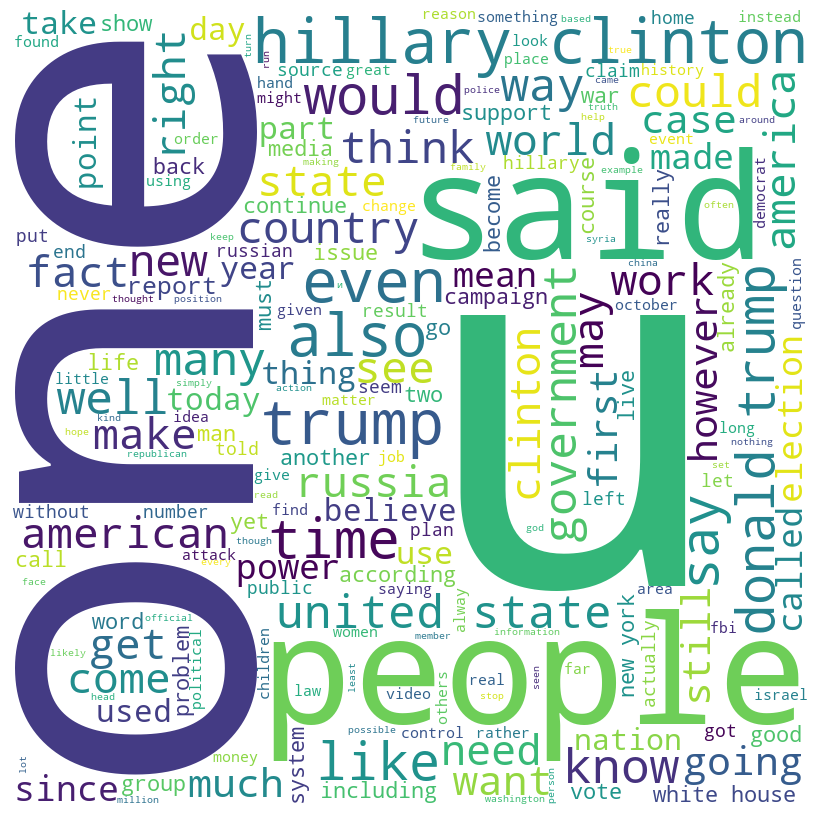

In [8]:
from wordcloud import WordCloud

real_words = ' '.join(real_words)
fake_words = ' '.join(fake_words)

wordcloud = WordCloud(width=800, height=800, 
                      background_color='white', 
                      stopwords=stop_words,
                      min_font_size=10).generate(real_words) 
                      
plt.figure(figsize=(8, 8), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
  
plt.show()

# Cleaning and preprocessing 

In [9]:
nltk.download('punkt')

[nltk_data] Error loading punkt: <urlopen error [WinError 10061] No
[nltk_data]     connection could be made because the target machine
[nltk_data]     actively refused it>


False

In [10]:
from nltk.stem import WordNetLemmatizer

In [11]:
lemmatizer=WordNetLemmatizer()
for index,row in train.iterrows():
    print(index,row)
    filter_sentence = ''
    
    sentence = row['total']
    sentence = re.sub(r'[^\w\s]','',sentence)
    
    words = nltk.word_tokenize(sentence)
    
    words = [w for w in words if not w in stop_words]
    
    for word in words:
        filter_sentence = filter_sentence + ' ' + str(lemmatizer.lemmatize(word)).lower()
        
    train.loc[index,'total'] = filter_sentence


0 id                                                        0
title     House Dem Aide: We Didn’t Even See Comey’s Let...
author                                        Darrell Lucus
text      House Dem Aide: We Didn’t Even See Comey’s Let...
label                                                     1
total     House Dem Aide: We Didn’t Even See Comey’s Let...
Name: 0, dtype: object
1 id                                                        1
title     FLYNN: Hillary Clinton, Big Woman on Campus - ...
author                                      Daniel J. Flynn
text      Ever get the feeling your life circles the rou...
label                                                     0
total     FLYNN: Hillary Clinton, Big Woman on Campus - ...
Name: 1, dtype: object
2 id                                                        2
title                     Why the Truth Might Get You Fired
author                                   Consortiumnews.com
text      Why the Truth Might Get You Fired Octo

30 id                                                       30
title     Chuck Todd to BuzzFeed EIC: ’You Just Publishe...
author                                         Ian Hanchett
text      During a discussion of BuzzFeed’s story on a d...
label                                                     0
total     Chuck Todd to BuzzFeed EIC: ’You Just Publishe...
Name: 30, dtype: object
31 id                                                       31
title     Israel is Becoming Pivotal to China’s Mid-East...
author                                                     
text      Country: Israel While China is silently playin...
label                                                     1
total     Israel is Becoming Pivotal to China’s Mid-East...
Name: 31, dtype: object
32 id                                                       32
title     Having Won, Boris Johnson and ‘Brexit’ Leaders...
author                                      Steven Erlanger
text      LONDON  —   With their giddy cele

92 id                                                       92
title     Venezuela Muzzles Legislature, Moving Closer t...
author                   Nicholas Casey and Patricia Torres
text      IQUITOS, Peru  —   Venezuela took its stronges...
label                                                     0
total     Venezuela Muzzles Legislature, Moving Closer t...
Name: 92, dtype: object
93 id                                                       93
title     Whether it's John McCain, Mitt Romney or Donal...
author                                 Natural News Editors
text      Whether it's John McCain, Mitt Romney or Donal...
label                                                     1
total     Whether it's John McCain, Mitt Romney or Donal...
Name: 93, dtype: object
94 id                                                       94
title          Breitbart News Daily: Trump Boom - Breitbart
author                                       Breitbart News
text      On the Thursday edition of Breitb

144 id                                                      144
title     Trump Bollywood Ad Meant To Sway Indian Americ...
author                                           T Steelman
text      Google Pinterest Digg Linkedin Reddit Stumbleu...
label                                                     1
total     Trump Bollywood Ad Meant To Sway Indian Americ...
Name: 144, dtype: object
145 id                                                      145
title     FBI Finds Previously Unseen Hillary Clinton Em...
author                                           Zero Hedge
text      \nCrushing the hope-filled “it’s just a backup...
label                                                     1
total     FBI Finds Previously Unseen Hillary Clinton Em...
Name: 145, dtype: object
146 id                                                      146
title     2 Years After This American Journalist Was Kil...
author                                             Starkman
text      Serena Shim is an American c

198 id                                                      198
title     Could Teaching Men to Nurture Counteract Our C...
author                                                     
text      By Ann Deslandes / thevocal.com.au \nThe femin...
label                                                     1
total     Could Teaching Men to Nurture Counteract Our C...
Name: 198, dtype: object
199 id                                                      199
title     Donald Trump’s Team Shows Few Signs of Post-El...
author    Eric Lipton, Charlie Savage and Michael S. Sch...
text         Donald J. Trump is picking up the pace with...
label                                                     0
total     Donald Trump’s Team Shows Few Signs of Post-El...
Name: 199, dtype: object
200 id                                                      200
title     Miami Beach Tries to Tame Its Most Raucous Str...
author                                      Lizette Alvarez
text      MIAMI BEACH, Fla.  —   From 

263 id                                                      263
title     The Uncomfortable Love Affair Between Donald T...
author                                       Mark Leibovich
text      “I’m not talking politics at all,” Tom Brady s...
label                                                     0
total     The Uncomfortable Love Affair Between Donald T...
Name: 263, dtype: object
264 id                                                      264
title     John McCain Withdraws Support for Donald Trump...
author                                       Alan Rappeport
text      Senator John McCain, the 2008 Republican presi...
label                                                     0
total     John McCain Withdraws Support for Donald Trump...
Name: 264, dtype: object
265 id                                                      265
title     The Strange, Unending Limbo of Egypt’s Hosni M...
author                        Declan Walsh and Nour Youssef
text      CAIRO  —   In many ways, lif

315 id                                                      315
title     Donald Trump to March for Life: ‘You Have My F...
author                                     Charlie Spiering
text      President Donald Trump signaled his support fo...
label                                                     0
total     Donald Trump to March for Life: ‘You Have My F...
Name: 315, dtype: object
316 id                                                      316
title     Police Official Found Dead on Long Island, and...
author                      Rick Rojas and J. David Goodman
text      A New York City police official was found dead...
label                                                     0
total     Police Official Found Dead on Long Island, and...
Name: 316, dtype: object
317 id                                                      317
title     Life: If You Love Enamel Pins, You’ll Love Thi...
author                                                     
text      Email If you can’t get enoug

368 id                                                      368
title     Your Monday Evening Briefing: Brexit, Abortion...
author            Jonah Engel Bromwich and Sandra Stevenson
text      (Want to get this briefing by email? Here’s th...
label                                                     0
total     Your Monday Evening Briefing: Brexit, Abortion...
Name: 368, dtype: object
369 id                                                      369
title     EU Increases ‘Brexit Bill’ Demand to €100 Bill...
author                                          Liam Deacon
text      The European Union (EU) has dramatically incre...
label                                                     0
total     EU Increases ‘Brexit Bill’ Demand to €100 Bill...
Name: 369, dtype: object
370 id                                                      370
title     Arianna Huffington’s Sleep Revolution Starts a...
author                                           Bob Morris
text      Arianna Huffington was sitti

422 id                                                      422
title     Gianno Caldwell Claims Hillary Only Cares Abou...
author                                                Davis
text      BREAKING: Trump Set to Break 50-Year-Old Recor...
label                                                     1
total     Gianno Caldwell Claims Hillary Only Cares Abou...
Name: 422, dtype: object
423 id                                                      423
title     ISIS Uses Ramadan as Calling for New Terrorist...
author                                          Ben Hubbard
text      BEIRUT, Lebanon  —   As the start of the Musli...
label                                                     0
total     ISIS Uses Ramadan as Calling for New Terrorist...
Name: 423, dtype: object
424 id                                                      424
title     ’Daily Show’ Mocks ’Mahatma Blondie’ Megyn Kel...
author                                      Daniel Nussbaum
text      The Daily Show‘s Trevor Noah

465 id                                                      465
title     Obama: Hillary Clinton Pardon Could Heal Divid...
author                                          Leigh Haugh
text      Note to President Obama: a Hillary Clinton par...
label                                                     1
total     Obama: Hillary Clinton Pardon Could Heal Divid...
Name: 465, dtype: object
466 id                                                      466
title                                  Exceptional Handling
author                                          Jane Bailey
text      Jane Bailey Jane Bailey is a self-published au...
label                                                     1
total     Exceptional Handling Jane Bailey Jane Bailey J...
Name: 466, dtype: object
467 id                                                      467
title          Nota conceptual para la presidencia de Rusia
author                                      voltairenet.org
text      Reunión del Consejo de Segur

527 id                                                      527
title     ‘Veep’ Season 5, Episode 7: Do a Little Dance ...
author                                          Noel Murray
text      Through nearly five seasons of “Veep,” we’ve s...
label                                                     0
total     ‘Veep’ Season 5, Episode 7: Do a Little Dance ...
Name: 527, dtype: object
528 id                                                      528
title     On ‘Dr. Oz,’ Trump Offers Placebo Transparency...
author                                     James Poniewozik
text      On Thursday’s episode of “The Dr. Oz Show,” Do...
label                                                     0
total     On ‘Dr. Oz,’ Trump Offers Placebo Transparency...
Name: 528, dtype: object
529 id                                                      529
title     Comment on Gold Medalist Wrestler Gets Violent...
author                                          Buck Rogers
text      USA CREATED ISIS ,ALL EUROPE

578 id                                                      578
title     SHERIFF CLARKE On Obama’s Final Days: “Obama’s...
author                                             EdJenner
text      Go to Article Wow! Milwaukee’s Sheriff David C...
label                                                     1
total     SHERIFF CLARKE On Obama’s Final Days: “Obama’s...
Name: 578, dtype: object
579 id                                                      579
title                        45 Weird Bans on Women in Iran
author                                  Dr. Majid Rafizadeh
text      45 Weird Bans on Women in Iran Gender aparthei...
label                                                     1
total     45 Weird Bans on Women in Iran Dr. Majid Rafiz...
Name: 579, dtype: object
580 id                          580
title                          
author                   SloMoe
text               Ludicrous...
label                         1
total       SloMoe Ludicrous...
Name: 580, dtype: object
5

625 id                                                      625
title     Fox News Just Exposed Hillary’s ILLEGAL VOTING...
author                                                     
text      Home / News / Fox News Just Exposed Hillary’s ...
label                                                     1
total     Fox News Just Exposed Hillary’s ILLEGAL VOTING...
Name: 625, dtype: object
626 id                                                      626
title     Russia, Cina e Arabia Saudita domano l'egemoni...
author                               Ariel Noyola Rodríguez
text      Russia, Cina e Arabia Saudita domano l’egemoni...
label                                                     1
total     Russia, Cina e Arabia Saudita domano l'egemoni...
Name: 626, dtype: object
627 id                                                      627
title     In Its Third Month, India’s Cash Shortage Begi...
author                           Geeta Anand and Hari Kumar
text      NEW DELHI  —   First, Yashpa

683 id                                                      683
title                                                      
author                                        Blitzkrieg622
text      The Walking Dead is a degenerate piece of Jewi...
label                                                     1
total       Blitzkrieg622 The Walking Dead is a degenera...
Name: 683, dtype: object
684 id                                                      684
title     California, at Forefront of Climate Fight, Won...
author                    Adam Nagourney and Henry Fountain
text      LOS ANGELES  —   Foreign governments concerned...
label                                                     0
total     California, at Forefront of Climate Fight, Won...
Name: 684, dtype: object
685 id                                                      685
title     The New York Times to Offer Open Access on Web...
author                                                     
text      The New York Times is inviti

725 id                                                      725
title                                                      
author                                                 Josh
text      And cops wonder why they get no respect. Stupi...
label                                                     1
total       Josh And cops wonder why they get no respect...
Name: 725, dtype: object
726 id                                                      726
title     For Simone Manuel, Gold Ripples Beyond the Poo...
author                                         Karen Crouse
text      RIO DE JANEIRO  —   Simone Manuel woke up Frid...
label                                                     0
total     For Simone Manuel, Gold Ripples Beyond the Poo...
Name: 726, dtype: object
727 id                                                      727
title     Rand Paul: Polls Showing Hillary Ahead Are ‘De...
author                                                     
text      Email \n\nWednesday on 800 W

772 id                                                      772
title     FL Sheriff: ’Not a Day Goes By That We All Don...
author                                         Ian Hanchett
text      On Thursday’s broadcast of the Fox News Channe...
label                                                     0
total     FL Sheriff: ’Not a Day Goes By That We All Don...
Name: 772, dtype: object
773 id                                                      773
title     Donald Trump Threatens to Cancel Berkeley Fede...
author                                     Charlie Spiering
text      President Donald Trump reacted to the massive ...
label                                                     0
total     Donald Trump Threatens to Cancel Berkeley Fede...
Name: 773, dtype: object
774 id                                                      774
title        Концепция записка российского председательства
author                                      voltairenet.org
text      Заседание Совета Безопасност

830 id                                                      830
title     Championing Optimism, Obama Hails Clinton as H...
author                    Jonathan Martin and Patrick Healy
text      PHILADELPHIA  —   President Obama delivered a ...
label                                                     0
total     Championing Optimism, Obama Hails Clinton as H...
Name: 830, dtype: object
831 id                                                      831
title     Fiona Apple Releases a Trump Protest Chant - T...
author                                 Jonah Engel Bromwich
text      On Saturday, hundreds of thousands of women ar...
label                                                     0
total     Fiona Apple Releases a Trump Protest Chant - T...
Name: 831, dtype: object
832 id                                                      832
title     Susan Rice: U.S. Must Integrate LGBT Rights in...
author                                      Kaitlyn Stegall
text      October 28, 2016 Susan Rice:

883 id                                                      883
title          Monica`s Stained Blue Dress Back in the news
author                                                     
text      Monica`s Stained Blue Dress Back in the news #...
label                                                     1
total     Monica`s Stained Blue Dress Back in the news  ...
Name: 883, dtype: object
884 id                                                      884
title     The MSM's twisted war language: Our 'sieges' a...
author                                                     
text      Wed, 26 Oct 2016 21:12 UTC © Alice Martins/The...
label                                                     1
total     The MSM's twisted war language: Our 'sieges' a...
Name: 884, dtype: object
885 id                                                      885
title              Open Borders Groups Gird for H-1B Fights
author                                          John Binder
text      The open borders lobby is br

957 id                                                      957
title     The Rolling Stones Paint It Blue on Their New ...
author                                          Jon Pareles
text      Beverly Hills, Calif.  —   More than five deca...
label                                                     0
total     The Rolling Stones Paint It Blue on Their New ...
Name: 957, dtype: object
958 id                                                      958
title     Uber Extends an Olive Branch to Local Governme...
author                                           Mike Isaac
text      The   company Uber and local governments often...
label                                                     0
total     Uber Extends an Olive Branch to Local Governme...
Name: 958, dtype: object
959 id                                                      959
title     Wilders: Put Dutch First, Not ’Brussels, Afric...
author                                      Jack Montgomery
text      Geert Wilders, the Euroscept

1033 id                                                     1033
title     Veterans prepare to join Standing Rock protest...
author                                      Zach Cartwright
text      November 22, 2016 \nIndigenous water protector...
label                                                     1
total     Veterans prepare to join Standing Rock protest...
Name: 1033, dtype: object
1034 id                                                     1034
title                                                      
author                                          rooster1957
text      How Do We Get to a Conversation in This Countr...
label                                                     1
total       rooster1957 How Do We Get to a Conversation ...
Name: 1034, dtype: object
1035 id                                                     1035
title                  Iran’s carpet exports to US at $50mn
author                                                     
text      Iran’s carpet exports t

1102 id                                                     1102
title     LIVE WIRE Dutch Elections: High Turnout Expect...
author                                     Breitbart London
text      The count is underway for the 2017 Dutch gener...
label                                                     0
total     LIVE WIRE Dutch Elections: High Turnout Expect...
Name: 1102, dtype: object
1103 id                                                     1103
title                     Why shaving means freedom to Omar
author                                                Guest
text      October 29, 2016 \nTo most men, it is a simple...
label                                                     1
total     Why shaving means freedom to Omar Guest Octobe...
Name: 1103, dtype: object
1104 id                                                     1104
title     BOMBSHELL: Leaked Emails Expose How Muslims Go...
author                                      Dawn Parabellum
text      BOMBSHELL: Leaked Email

1142 id                                                     1142
title     Germany: Students Forced to Chant ‘Allahu Akba...
author                                        Chris Menahan
text      From The Daily Express : \nPUPILS at a primary...
label                                                     1
total     Germany: Students Forced to Chant ‘Allahu Akba...
Name: 1142, dtype: object
1143 id                                                     1143
title     Meteor, space junk, rocket? Mysterious flash h...
author                                          -NO AUTHOR-
text      Meteor, space junk, rocket? Mysterious flash h...
label                                                     1
total     Meteor, space junk, rocket? Mysterious flash h...
Name: 1143, dtype: object
1144 id                                                     1144
title                                                      
author                                        Thomas Faddis
text      Look, gdi! The presiden

1182 id                                                     1182
title     Trump Counselor Kellyanne Conway, NFL Star Ben...
author                                      Dr. Susan Berry
text      Counselor to President Donald Trump Kellyanne ...
label                                                     0
total     Trump Counselor Kellyanne Conway, NFL Star Ben...
Name: 1182, dtype: object
1183 id                                                     1183
title     Hong Kong Subway Fire Injures at Least 17 Peop...
author                                            Alan Wong
text      HONG KONG  —   A   commute in Hong Kong turned...
label                                                     0
total     Hong Kong Subway Fire Injures at Least 17 Peop...
Name: 1183, dtype: object
1184 id                                                     1184
title     As Predicted by Bill Belichick, NFL Touchback ...
author                                          Dylan Gwinn
text      Against the advice of t

1221 id                                                     1221
title     Before Orlando Shooting, an Anti-Gay Massacre ...
author                                           Liam Stack
text      The terrorist attack that killed 49 and wounde...
label                                                     0
total     Before Orlando Shooting, an Anti-Gay Massacre ...
Name: 1221, dtype: object
1222 id                                                     1222
title     Could the Latest Solar Storm Warnings Bring an...
author                                        Ryan Banister
text      Did you know that the White House is currently...
label                                                     1
total     Could the Latest Solar Storm Warnings Bring an...
Name: 1222, dtype: object
1223 id                                                     1223
title     GE CEO Jeff Immelt Recalls Trump Hole-in-One: ...
author                                          Trent Baker
text      Trump just made Jeff Im

1256 id                                                     1256
title     When Dad’s Kind Birthday Gift For Ex-Wife Has ...
author                                         Sara Vallone
text      Share on Twitter \nOn October 21, 2016, father...
label                                                     1
total     When Dad’s Kind Birthday Gift For Ex-Wife Has ...
Name: 1256, dtype: object
1257 id                                                     1257
title     Mexico, Chinese New Year: Your Thursday Evenin...
author                    Karen Zraick and Sandra Stevenson
text      (Want to get this briefing by email? Here’s th...
label                                                     0
total     Mexico, Chinese New Year: Your Thursday Evenin...
Name: 1257, dtype: object
1258 id                                                     1258
title     NeverTrumper Michael Hayden of CIA, NSA: Breit...
author                                       Joel B. Pollak
text      Former Central Intellig

1305 id                                                     1305
title     ‘Mad About Mary’: How The Times Covered Mary T...
author                                         Jeremy Egner
text      Mary Tyler Moore, who died on Wednesday at 80,...
label                                                     0
total     ‘Mad About Mary’: How The Times Covered Mary T...
Name: 1305, dtype: object
1306 id                                                     1306
title     Mar-a-Lago, the Future Winter White House and ...
author                                      Maggie Haberman
text      WEST PALM BEACH, Fla.  —   When   Donald J. Tr...
label                                                     0
total     Mar-a-Lago, the Future Winter White House and ...
Name: 1306, dtype: object
1307 id                                                     1307
title     Caitlyn Jenner: ’Looking Into’ Running for Off...
author                                              Pam Key
text      Friday during an interv

1378 id                                                     1378
title     Re: The List Of Establishment Republicans That...
author                                         Hugh Everett
text      The List Of Establishment Republicans That Say...
label                                                     1
total     Re: The List Of Establishment Republicans That...
Name: 1378, dtype: object
1379 id                                                     1379
title     High School Assistant Principal Resigns After ...
author                                         Tom Ciccotta
text      The assistant principal of a Pennsylvania high...
label                                                     0
total     High School Assistant Principal Resigns After ...
Name: 1379, dtype: object
1380 id                                                     1380
title               Disabled veterans find freedom in water
author                                      Arnaldo Rodgers
text      ‹ › Arnaldo Rodgers is 

1429 id                                                     1429
title     World War 3 Alert U S Navy’s new $20 billion W...
author                                             Pakalert
text      November 6, 2016 at 10:19 am \nHere again that...
label                                                     1
total     World War 3 Alert U S Navy’s new $20 billion W...
Name: 1429, dtype: object
1430 id                                                     1430
title     Analyst: Why Turkey Opening Border to Millions...
author                                              dailouk
text      Home | World | Analyst: Why Turkey Opening Bor...
label                                                     1
total     Analyst: Why Turkey Opening Border to Millions...
Name: 1430, dtype: object
1431 id                                                     1431
title     Survey Shows Social Isolation, Sexual Rejectio...
author                                           Neil Munro
text      People who try to live 

1506 id                                                     1506
title     Sale of Federal Mortgages to Investors Puts Gr...
author         Jessica Silver-Greenberg and Michael Corkery
text      For years, the federal government avoided insu...
label                                                     0
total     Sale of Federal Mortgages to Investors Puts Gr...
Name: 1506, dtype: object
1507 id                                                     1507
title     PressTV-Hezbollah shares Aoun’s victory: Leban...
author                                                     
text      Lebanon Lebanese Foreign Minister Gebran Bassi...
label                                                     1
total     PressTV-Hezbollah shares Aoun’s victory: Leban...
Name: 1507, dtype: object
1508 id                                                     1508
title     Hillary Clinton Appears Disoriented And Confus...
author                                      Geoffrey Grider
text        Hillary Clinton Appea

1556 id                                                     1556
title     Applications Open For the Yiannopoulos Privile...
author                                         Charlie Nash
text      Applications for the Yiannopoulos Privilege Gr...
label                                                     0
total     Applications Open For the Yiannopoulos Privile...
Name: 1556, dtype: object
1557 id                                                     1557
title     Gary Johnson Goes Zombie, Tries to Bite Reporters
author                             The European Union Times
text      \nEverybody always knew Gary Johnson is kind o...
label                                                     1
total     Gary Johnson Goes Zombie, Tries to Bite Report...
Name: 1557, dtype: object
1558 id                                                     1558
title     Is FBI investigation a ploy to divert attentio...
author                                       Howard Portnoy
text      Print \nHmm, how about 

1609 id                                                     1609
title     On the Ground in Aleppo: Bloodshed, Misery and...
author                                         Declan Walsh
text      ALEPPO, Syria  —   On the edge of Aleppo’s anc...
label                                                     0
total     On the Ground in Aleppo: Bloodshed, Misery and...
Name: 1609, dtype: object
1610 id                                                     1610
title     Influence Peddling Scheme Hits President Park ...
author                                                     
text      Influence Peddling Scheme Hits President Park ...
label                                                     1
total     Influence Peddling Scheme Hits President Park ...
Name: 1610, dtype: object
1611 id                                                     1611
title     BREAKING: We Caught Obama Spending 30 Million ...
author                                               Editor
text      It’s no secret that Oba

1684 id                                                     1684
title     Fundamentally transforming the, uh, um, whatev...
author                                     Genosse Dummkopf
text      In Hillary's America, email server scrubs you ...
label                                                     1
total     Fundamentally transforming the, uh, um, whatev...
Name: 1684, dtype: object
1685 id                                                     1685
title     You Probably Have Never Eaten a Real Yam, Here...
author                                               Ariana
text      by ARIANA MARISOL \nIf you have ever been to a...
label                                                     1
total     You Probably Have Never Eaten a Real Yam, Here...
Name: 1685, dtype: object
1686 id                                                     1686
title     Solar Snare: Spend Thousands and Cut Power Bil...
author                                          David Segal
text      Does this seem like a r

1762 id                                                     1762
title     Standing Rock Indian Reservation: Thousands Of...
author               Dikran Arakelian (noreply@blogger.com)
text      Share on Facebook Native Americans attempting ...
label                                                     1
total     Standing Rock Indian Reservation: Thousands Of...
Name: 1762, dtype: object
1763 id                                                     1763
title     Смогут ли выборы в Соединенных Штатах что-то и...
author                                                     
text      Регион: США в мире В своей новой статье канадс...
label                                                     1
total     Смогут ли выборы в Соединенных Штатах что-то и...
Name: 1763, dtype: object
1764 id                                                     1764
title     Trump to Paul Ryan: Get NATO to ’Pay Their Bil...
author                                              Pam Key
text      Tuesday in Kenosha, WI 

1813 id                                                     1813
title         Like It Or Not, This Election Is A Referendum
author                                        Frank Salvato
text      Print \nThere is a sizeable faction in this co...
label                                                     1
total     Like It Or Not, This Election Is A Referendum ...
Name: 1813, dtype: object
1814 id                                                     1814
title     Billy Joel on Politics and Trump: Not My Job t...
author                                        Jerome Hudson
text      Rock legend Billy Joel says when it comes to p...
label                                                     0
total     Billy Joel on Politics and Trump: Not My Job t...
Name: 1814, dtype: object
1815 id                                                     1815
title     Voting Machine Shocker: Video Proof Election I...
author                                             Starkman
text      The Clinton campaign ha

1877 id                                                     1877
title       SIXTY KILLED IN NEW US-SAUDI WAR CRIME IN YEMEN
author                                           Iron Sheik
text      Home › WORLD NEWS › SIXTY KILLED IN NEW US-SAU...
label                                                     1
total     SIXTY KILLED IN NEW US-SAUDI WAR CRIME IN YEME...
Name: 1877, dtype: object
1878 id                                                     1878
title     NEW EMAILS IN CLINTON CASE CAME FROM ANTHONY W...
author                                            newsguy76
text      Home › POLITICS › NEW EMAILS IN CLINTON CASE C...
label                                                     1
total     NEW EMAILS IN CLINTON CASE CAME FROM ANTHONY W...
Name: 1878, dtype: object
1879 id                                                     1879
title     Director de 'Machete' y 'El Mariachi' insta a ...
author                                                     
text      Director de 'Machete' y

1915 id                                                     1915
title     MoMA Protests Trump Entry Ban by Rehanging Wor...
author                                         Jason Farago
text      In one of the strongest protests yet by a majo...
label                                                     0
total     MoMA Protests Trump Entry Ban by Rehanging Wor...
Name: 1915, dtype: object
1916 id                                                     1916
title     Pakistani Parliament is the first in the world...
author                                   The Mind Unleashed
text      Pakistani Parliament is the first in the world...
label                                                     1
total     Pakistani Parliament is the first in the world...
Name: 1916, dtype: object
1917 id                                                     1917
title     10 More Years: US Republicans Set to Prolong I...
author                                                     
text      Get short URL 0 8 0 0 G

1964 id                                                     1964
title     Google Launches ’Fact Check’ Label for Search ...
author                                          Lucas Nolan
text      In an effort to combat “fake news,” Google has...
label                                                     0
total     Google Launches ’Fact Check’ Label for Search ...
Name: 1964, dtype: object
1965 id                                                     1965
title     After Comedy Central Cancellation, Larry Wilmo...
author                                          John Koblin
text          months after Comedy Central canceled his  ...
label                                                     0
total     After Comedy Central Cancellation, Larry Wilmo...
Name: 1965, dtype: object
1966 id                                                     1966
title     In Betsy DeVos for Education, Trump Taps Into ...
author    Vanessa Friedman, Maggie Haberman and Alan Rap...
text        Donald J. Trump has r

2001 id                                                     2001
title     Video: This Will Change The Way You Watch ‘Apo...
author                                                     
text      This Will Change The Way You Watch ‘Apocalypse...
label                                                     1
total     Video: This Will Change The Way You Watch ‘Apo...
Name: 2001, dtype: object
2002 id                                                     2002
title     U.K. Set to Choose Sharp Break From European U...
author                                      Steven Erlanger
text      LONDON  —   If British plans for leaving the E...
label                                                     0
total     U.K. Set to Choose Sharp Break From European U...
Name: 2002, dtype: object
2003 id                                                     2003
title     Georgia Abandons Ukraine's Anti-Russian Obsess...
author                                                     
text      Your daily reality snac

2040 id                                                     2040
title     Mainstream Media Crashed — The Scapegoat is 'F...
author                noreply@blogger.com (Alexander Light)
text      . Mainstream Media Crashed — The Scapegoat is ...
label                                                     1
total     Mainstream Media Crashed — The Scapegoat is 'F...
Name: 2040, dtype: object
2041 id                                                     2041
title     ‘Unintentional’ Human Error Led to Airstrikes ...
author                                   Michael S. Schmidt
text      WASHINGTON  —   The Pentagon on Tuesday blamed...
label                                                     0
total     ‘Unintentional’ Human Error Led to Airstrikes ...
Name: 2041, dtype: object
2042 id                                                     2042
title     Ashley Judd Accuses Donald Trump of Having ’We...
author                                         Ian Hanchett
text      During Saturday’s Women

2108 id                                                     2108
title     Last Days of John Kirby: Hapless State Rep Get...
author                                                     
text      This post was originally published on this sit...
label                                                     1
total     Last Days of John Kirby: Hapless State Rep Get...
Name: 2108, dtype: object
2109 id                                                     2109
title     Big Expose! Why Mamata Banarjee is attacking M...
author                                                     
text      Viswajith | November 15, 2016 | Viral Videos |...
label                                                     1
total     Big Expose! Why Mamata Banarjee is attacking M...
Name: 2109, dtype: object
2110 id                                                     2110
title     A Struggling Theme Park Asks: Do You Still Bel...
author                                        Annie Stoltie
text      NORTH POLE, N. Y.  —   

2147 id                                                     2147
title     At Least 9 Civilians Killed as Coalition Strik...
author                        Mujib Mashal and Taimoor Shah
text      KABUL, Afghanistan  —   Officials in Afghanist...
label                                                     0
total     At Least 9 Civilians Killed as Coalition Strik...
Name: 2147, dtype: object
2148 id                                                     2148
title     Gorafi Magazine: Barack Obama « Je vous ai déj...
author                                                     
text                                                       
label                                                     1
total     Gorafi Magazine: Barack Obama « Je vous ai déj...
Name: 2148, dtype: object
2149 id                                                     2149
title     DELINGPOLE: Facebook Banned Me For Defending M...
author                                     James Delingpole
text      Facebook just put me on

2194 id                                                     2194
title     Morbid or Touching? W. Paints Portraits of Vet...
author                                  Contributing Author
text      \nThis article was written by John Vibes and o...
label                                                     1
total     Morbid or Touching? W. Paints Portraits of Vet...
Name: 2194, dtype: object
2195 id                                                     2195
title     Bus of Nepal Earthquake Survivors Plunges Off ...
author                    Kai Schultz and Rajneesh Bhandari
text      KATHMANDU, Nepal  —   The second time the over...
label                                                     0
total     Bus of Nepal Earthquake Survivors Plunges Off ...
Name: 2195, dtype: object
2196 id                                                     2196
title     Haitians, Battered by Hurricane, Huddle in Cav...
author                                           Azam Ahmed
text      LACADONIE, Haiti  —   W

2237 id                                                     2237
title     Vote Highlighted a Gender Gap, With Both Sides...
author                                          Susan Chira
text      Call it pink and blue America. To the many div...
label                                                     0
total     Vote Highlighted a Gender Gap, With Both Sides...
Name: 2237, dtype: object
2238 id                                                     2238
title     Nigel Farage held at Heathrow on return from T...
author                                                     
text      Monday 14 November 2016 by Benedict Farkerhaus...
label                                                     1
total     Nigel Farage held at Heathrow on return from T...
Name: 2238, dtype: object
2239 id                                                     2239
title     U.S. Presidential Race, North Dakota, NASA: Yo...
author                Andrea Kannapell and Sandra Stevenson
text      (Want to get this brief

2298 id                                                     2298
title     Confusion as Clinton Cards changes name to Tru...
author                                                Guest
text       Posted: Nov 10th, 2016 by Guest   Guest   Ticker
label                                                     1
total     Confusion as Clinton Cards changes name to Tru...
Name: 2298, dtype: object
2299 id                                                     2299
title     ‘Fantastic Beasts’ Has a New Dumbledore: Jude ...
author                                         Cara Buckley
text      The British actor Jude Law, whose recent scree...
label                                                     0
total     ‘Fantastic Beasts’ Has a New Dumbledore: Jude ...
Name: 2299, dtype: object
2300 id                                                     2300
title     Government to Revive Pledge to Cut Migrant Ben...
author                                         Nick Hallett
text      The British government 

2365 id                                                     2365
title     EXCLUSIVE – Juanita Broaddrick Slams Madonna, ...
author                                          Aaron Klein
text      Juanita Broaddrick, the woman who accused Bill...
label                                                     0
total     EXCLUSIVE – Juanita Broaddrick Slams Madonna, ...
Name: 2365, dtype: object
2366 id                                                     2366
title     RESET: Vladimir Putin Says That Russia Is Read...
author                                      Geoffrey Grider
text        RESET: Vladimir Putin Says That Russia Is Re...
label                                                     1
total     RESET: Vladimir Putin Says That Russia Is Read...
Name: 2366, dtype: object
2367 id                                                     2367
title     GERMAN ‘GESTAPO’ considers prosecuting parents...
author                                       BareNakedIslam
text      BNI Store Oct 30 2016 G

2406 id                                                     2406
title     Explosion in St. Petersburg, Russia, Kills 11 ...
author               Ivan Nechepurenko and Neil MacFarquhar
text      ST. PETERSBURG, Russia  —   It was 2:40 p. m. ...
label                                                     0
total     Explosion in St. Petersburg, Russia, Kills 11 ...
Name: 2406, dtype: object
2407 id                                                     2407
title     School to update PE lessons with introduction ...
author                                                     
text      Tuesday 1 November 2016 by James W School to t...
label                                                     1
total     School to update PE lessons with introduction ...
Name: 2407, dtype: object
2408 id                                                     2408
title     Israeli Embassy Official Plotted to ‘Take Down...
author                                      Steven Erlanger
text      LONDON  —   In a deeply

2482 id                                                     2482
title                       Hillary Emails: “Taken Care Of”
author                                                     
text      Hillary Emails: “Taken Care Of” October 28, 20...
label                                                     1
total     Hillary Emails: “Taken Care Of”   Hillary Emai...
Name: 2482, dtype: object
2483 id                                                     2483
title     North Korea Threatens Israel: ‘Merciless, Thou...
author                                  Breitbart Jerusalem
text      The Jerusalem Post reports:  Israeli Defense M...
label                                                     0
total     North Korea Threatens Israel: ‘Merciless, Thou...
Name: 2483, dtype: object
2484 id                                                     2484
title     The Media Go Insane Over Trump In Every Way. T...
author                                             EdJenner
text      A new poll from Rasmuss

2539 id                                                     2539
title     Man Kicks in Ex-Girlfriend’s Door, Dies from M...
author                                          AWR Hawkins
text      A    suspect who kicked in his  ’s door died f...
label                                                     0
total     Man Kicks in Ex-Girlfriend’s Door, Dies from M...
Name: 2539, dtype: object
2540 id                                                     2540
title     Anonymous Release Bone Chilling Video of Huma ...
author                                            wmw_admin
text      Behind the headlines - conspiracies, cover-ups...
label                                                     1
total     Anonymous Release Bone Chilling Video of Huma ...
Name: 2540, dtype: object
2541 id                                                     2541
title     Sleep Is the New Status Symbol - The New York ...
author                                       Penelope Green
text      At M. I. T. ’s Media La

2597 id                                                     2597
title     Exclusive — Discussion About GOP Replacement t...
author                                        Matthew Boyle
text      Republican officials in Congress and the White...
label                                                     0
total     Exclusive — Discussion About GOP Replacement t...
Name: 2597, dtype: object
2598 id                                                     2598
title     Feds Find Local Police Willing Partners in Sur...
author                              Joe Wolverton, II, J.D.
text      "A man must keep a little back shop where he c...
label                                                     1
total     Feds Find Local Police Willing Partners in Sur...
Name: 2598, dtype: object
2599 id                                                     2599
title     Why any Wife, Mother, Daughter, Sister or Femi...
author                                                     
text      Why any Wife, Mother, D

2669 id                                                     2669
title                                                      
author                                        Tennessee Dan
text      Take your meds fruitloop. Don’t make me call d...
label                                                     1
total       Tennessee Dan Take your meds fruitloop. Don’...
Name: 2669, dtype: object
2670 id                                                     2670
title     White House to Be Lit in Blue in Honor of Auti...
author                                  Katherine Rodriguez
text      The White House will light up in the color blu...
label                                                     0
total     White House to Be Lit in Blue in Honor of Auti...
Name: 2670, dtype: object
2671 id                                                     2671
title                                                      
author                                            Anonymous
text      Hell thats a good speec

2735 id                                                     2735
title     Obama Illegally Transferred DOJ Money To Clint...
author                                   Sean Adl-Tabatabai
text        Sean Adl-Tabatabai in News , US // 0 Comment...
label                                                     1
total     Obama Illegally Transferred DOJ Money To Clint...
Name: 2735, dtype: object
2736 id                                                     2736
title     **Livewire** President Trump’s First Address t...
author                         Breitbart News, Amanda House
text      Welcome to the Breitbart News Livewire of Pres...
label                                                     0
total     **Livewire** President Trump’s First Address t...
Name: 2736, dtype: object
2737 id                                                     2737
title     Pollsters Admit They Underestimated Voters’ Ad...
author                                                     
text      Man Wearing ‘Jewmerica’

2772 id                                                     2772
title     Drop in the bucket: Failed weapons systems cos...
author                                                     
text      Wed, 26 Oct 2016 20:37 UTC © AFP The Pentagon ...
label                                                     1
total     Drop in the bucket: Failed weapons systems cos...
Name: 2772, dtype: object
2773 id                                                     2773
title           Newsbud Roundtable on Elections vs. Reality
author                                              Corbett
text        \nvia Newsbud.com : In this week’s edition o...
label                                                     1
total     Newsbud Roundtable on Elections vs. Reality Co...
Name: 2773, dtype: object
2774 id                                                     2774
title     Edward Enninful as British Vogue Editor: A Bar...
author                                     Vanessa Friedman
text      He had been rumored to 

2831 id                                                     2831
title                     GOP has a day of reckoning coming
author                                                     
text      License DMCA The face of the Republican Party....
label                                                     1
total     GOP has a day of reckoning coming   License DM...
Name: 2831, dtype: object
2832 id                                                     2832
title     The Supermoon and Other Moons That Are Super i...
author                                   Nicholas St. Fleur
text      Shrug off the supermoon. Yes, it’s true that o...
label                                                     0
total     The Supermoon and Other Moons That Are Super i...
Name: 2832, dtype: object
2833 id                                                     2833
title     DNC To Sue Trump For Telling Truth About ‘Elec...
author                                   Sean Adl-Tabatabai
text      Posted on October 27, 2

2909 id                                                     2909
title     GOP Rep. Babin: Concealed Carry for Me but Not...
author                                          AWR Hawkins
text      On June 20, Rep. Brian Babin (  ) put forward ...
label                                                     0
total     GOP Rep. Babin: Concealed Carry for Me but Not...
Name: 2909, dtype: object
2910 id                                                     2910
title     House Intel Chairman: No Evidence of Contacts ...
author                                       Neil W. McCabe
text      The chairman of the House Permanent Committee ...
label                                                     0
total     House Intel Chairman: No Evidence of Contacts ...
Name: 2910, dtype: object
2911 id                                                     2911
title     A Bumblebee Gets New Protection on Obama’s Way...
author                Tatiana Schlossberg and John Schwartz
text      The Obama administratio

2953 id                                                     2953
title     Virgil: The Deep State Strikes Again with Rach...
author                                               Virgil
text      A few days ago, under the headline, “The Depar...
label                                                     0
total     Virgil: The Deep State Strikes Again with Rach...
Name: 2953, dtype: object
2954 id                                                     2954
title     Adelson boosts Trump with $25 million to defea...
author                                       Ian Greenhalgh
text      Adelson boosts Trump with $25 million to defea...
label                                                     1
total     Adelson boosts Trump with $25 million to defea...
Name: 2954, dtype: object
2955 id                                                     2955
title     Goldman-Sachs Says an Asteroid Mining Rush Is ...
author                                          Nate Church
text        made its case for min

3015 id                                                     3015
title     Gorsuch Supreme Court Nomination Gains More De...
author                  Michael S. Schmidt and Noah Weiland
text      WASHINGTON  —   A third Democratic senator ann...
label                                                     0
total     Gorsuch Supreme Court Nomination Gains More De...
Name: 3015, dtype: object
3016 id                                                     3016
title     Connie Kopelov, of First Same-Sex Couple Legal...
author                                         Mike McPhate
text      Connie Kopelov, whose wedding to Phyllis Siege...
label                                                     0
total     Connie Kopelov, of First Same-Sex Couple Legal...
Name: 3016, dtype: object
3017 id                                                     3017
title     Nuclear weapons: how foreign hotspots could te...
author                                      Kaitlyn Stegall
text      November 11, 2016 Nucle

3073 id                                                     3073
title     Buffalo Meat Industry Facing Government Shutdo...
author                         Ellen Barry and Suhasini Raj
text      NARAHARA, India  —   In recent years, as deman...
label                                                     0
total     Buffalo Meat Industry Facing Government Shutdo...
Name: 3073, dtype: object
3074 id                                                     3074
title     Melania Trump Praises U.S. Troops and Their Fa...
author                                          Penny Starr
text      Melania Trump ended her first trip abroad as F...
label                                                     0
total     Melania Trump Praises U.S. Troops and Their Fa...
Name: 3074, dtype: object
3075 id                                                     3075
title     Proposed Football League Envisions a No-Colleg...
author                                           Ken Belson
text      The sports landscape is

3139 id                                                     3139
title     Kurds Fear the U.S. Will Again Betray Them, in...
author                                           Tim Arango
text      ISTANBUL  —   For almost two years, Syrian Kur...
label                                                     0
total     Kurds Fear the U.S. Will Again Betray Them, in...
Name: 3139, dtype: object
3140 id                                                     3140
title     Billy Ray Cyrus, Like Miley, Knows About Reinv...
author                                       Joe Coscarelli
text      Surrounded by images of music icons, Billy Ray...
label                                                     0
total     Billy Ray Cyrus, Like Miley, Knows About Reinv...
Name: 3140, dtype: object
3141 id                                                     3141
title     Few Expect China to Punish North Korea for Lat...
author                                          Jane Perlez
text      BEIJING  —   North Kore

3205 id                                                     3205
title     Election 2016 and the Growing Global Nuclear T...
author                                     Michael T. Klare
text      Election 2016 and the Growing Global Nuclear T...
label                                                     1
total     Election 2016 and the Growing Global Nuclear T...
Name: 3205, dtype: object
3206 id                                                     3206
title                                 WORLD WAR 3 IS COMING
author                                             Pakalert
text      source Add To The Conversation Using Facebook ...
label                                                     1
total     WORLD WAR 3 IS COMING Pakalert source Add To T...
Name: 3206, dtype: object
3207 id                                                     3207
title                            Obama’s Secret Muslim List
author                                    Daniel Greenfield
text      Obama’s Secret Muslim L

3268 id                                                     3268
title     The Women Blazing a Trail Into Ice Hockey - Th...
author                                            Tim Casey
text      BOSTON  —   During a men’s hockey game between...
label                                                     0
total     The Women Blazing a Trail Into Ice Hockey - Th...
Name: 3268, dtype: object
3269 id                                                     3269
title                                                      
author                                   ctwatcher✓ᵛᵉʳᶦᶠᶦᵉᵈ
text      You're our enemy yet we will play in manufactu...
label                                                     1
total       ctwatcher✓ᵛᵉʳᶦᶠᶦᵉᵈ You're our enemy yet we w...
Name: 3269, dtype: object
3270 id                                                     3270
title     Дырка от рублика: Украина не получит штрафы с ...
author                                                     
text      0 комментариев 1 подели

3357 id                                                     3357
title     FEAR OF TRUMP: BUSH, OBAMA, CLINTON ALL BUYING...
author                                                     
text      Email \n\nIt appears Bill and Hillary Clinton ...
label                                                     1
total     FEAR OF TRUMP: BUSH, OBAMA, CLINTON ALL BUYING...
Name: 3357, dtype: object
3358 id                                                     3358
title     A Chinese Artist Consumed by the Idea of Inevi...
author                                            Joyce Lau
text      BEIJING  —   A trip to Sun Xun’s studio involv...
label                                                     0
total     A Chinese Artist Consumed by the Idea of Inevi...
Name: 3358, dtype: object
3359 id                                                     3359
title     Suicide Bombings Hit 3 Cities in Saudi Arabia,...
author                                          Ben Hubbard
text      BEIRUT, Lebanon  —   Bo

3403 id                                                     3403
title     ‘They Don’t Speak For Me’ — Evangelical PhD SL...
author                                    Stephanie Kuklish
text      ‘They Don’t Speak For Me’— Evangelical PhD SLA...
label                                                     1
total     ‘They Don’t Speak For Me’ — Evangelical PhD SL...
Name: 3403, dtype: object
3404 id                                                     3404
title                      How To Recognize Light From Dark
author                                              Gillian
text      Leave a reply \nDiane Canfield – The biggest s...
label                                                     1
total     How To Recognize Light From Dark Gillian Leave...
Name: 3404, dtype: object
3405 id                                                     3405
title     The FOUR Reasons for the Assassination of JFK,...
author                noreply@blogger.com (Alexander Light)
text      . The FOUR Reasons for 

3461 id                                                     3461
title     Two houses and gas pipeline damaged in Republi...
author                                                     
text      This post was originally published on this sit...
label                                                     1
total     Two houses and gas pipeline damaged in Republi...
Name: 3461, dtype: object
3462 id                                                     3462
title     DREAMers Continue to Demand Protections from T...
author                                          John Binder
text      Migrants covered by former President Obama’s D...
label                                                     0
total     DREAMers Continue to Demand Protections from T...
Name: 3462, dtype: object
3463 id                                                     3463
title                      The Trump – Epstein Rape Lawsuit
author                                      Michael Collins
text      Posted on November 3, 2

3504 id                                                     3504
title     Chances of Yemen Partition Grow as Pro-Saudi F...
author                                           Jason Ditz
text      Hadi: UN Deal Would Reward 'Putschists' by Jas...
label                                                     1
total     Chances of Yemen Partition Grow as Pro-Saudi F...
Name: 3504, dtype: object
3505 id                                                     3505
title                               Public vs. Media on War
author                                         DavidSwanson
text      Posted on October 27, 2016 by DavidSwanson \nA...
label                                                     1
total     Public vs. Media on War DavidSwanson Posted on...
Name: 3505, dtype: object
3506 id                                                     3506
title     Should the United States Save Tangier Island F...
author                                          Jon Gertner
text      It was a few minutes be

3529 id                                                     3529
title     Donald Trump’s Far-Flung Holdings Raise Potent...
author                        Eric Lipton and Susanne Craig
text      WASHINGTON  —   Just a few blocks down Pennsyl...
label                                                     0
total     Donald Trump’s Far-Flung Holdings Raise Potent...
Name: 3529, dtype: object
3530 id                                                     3530
title     Arkansas Rushes to Execute 8 Men in the Space ...
author                     Matthew Haag and Richard Fausset
text      The state of Arkansas plans to put to death ei...
label                                                     0
total     Arkansas Rushes to Execute 8 Men in the Space ...
Name: 3530, dtype: object
3531 id                                                     3531
title     Studies Examine Racial Bias in Pollution, Deva...
author                                          Henry Wolff
text      Studies Examine Racial 

3554 id                                                     3554
title                          Obama Votes Against US at UN
author                                    Daniel Greenfield
text      Obama Votes Against US at UN October 27, 2016 ...
label                                                     1
total     Obama Votes Against US at UN Daniel Greenfield...
Name: 3554, dtype: object
3555 id                                                     3555
title     Great Barrier Reef Hit by Worst Coral Die-Off ...
author                                       Michelle Innis
text      SYDNEY, Australia  —   Scientists surveying th...
label                                                     0
total     Great Barrier Reef Hit by Worst Coral Die-Off ...
Name: 3555, dtype: object
3556 id                                                     3556
title     Top aide: Hillary ‘still not perfect in her he...
author                                                     
text      Email \n\nIn an email r

3609 id                                                     3609
title     Tim Graham: Establishment Media Give VA Shoote...
author                                            Dan Riehl
text      Tim Graham, executive editor of NewsBusters, s...
label                                                     0
total     Tim Graham: Establishment Media Give VA Shoote...
Name: 3609, dtype: object
3610 id                                                     3610
title     Paul Ryan’s Plan To Use Bernie To Scare Voters...
author                                        Michael Hayne
text      By Michael Hayne Election 2016 , News , Politi...
label                                                     1
total     Paul Ryan’s Plan To Use Bernie To Scare Voters...
Name: 3610, dtype: object
3611 id                                                     3611
title     Caroline Kennedy Dances in a Christmas Video, ...
author                                            Mike Ives
text      HONG KONG  —   The Japa

3673 id                                                     3673
title     Trump Doing More to Help Los Angeles’ Olympic ...
author                                          Dylan Gwinn
text      The head of the group attempting to bring the ...
label                                                     0
total     Trump Doing More to Help Los Angeles’ Olympic ...
Name: 3673, dtype: object
3674 id                                                     3674
title     Washington Post Cries Uncle: Stop Using ’Taint...
author                                       Breitbart News
text      Writing at the Washington Post, Margaret Sulli...
label                                                     0
total     Washington Post Cries Uncle: Stop Using ’Taint...
Name: 3674, dtype: object
3675 id                                                     3675
title     2 TV Shows, 4 Books and 7 Viral Videos for You...
author                                                     
text      Summer’s almost over. H

3731 id                                                     3731
title     If Hillary And Obama Didn't Use email Server A...
author                   Be Glad U Had Obama (UID 58059507)
text      Report Copyright Violation If Hillary And Obam...
label                                                     1
total     If Hillary And Obama Didn't Use email Server A...
Name: 3731, dtype: object
3732 id                                                     3732
title     15 Great Stories That Have Nothing to Do With ...
author                  Anna Dubenko and Michelle L. Dozois
text      Welcome to Our Picks, a guide to the best stuf...
label                                                     0
total     15 Great Stories That Have Nothing to Do With ...
Name: 3732, dtype: object
3733 id                                                     3733
title                       Why did Satan-2 shock the West?
author                                                     
text      Why did Satan-2 shock t

3803 id                                                     3803
title     Comment on Six Million Jews 1915-1938 by Jews ...
author    Jews Did World War and Open Borders – aladdins...
text      Behind the headlines - conspiracies, cover-ups...
label                                                     1
total     Comment on Six Million Jews 1915-1938 by Jews ...
Name: 3803, dtype: object
3804 id                                                     3804
title                         7 reasons I'll vote for Trump
author                                        Michael Brown
text      Print \nBefore you applaud me for my integrity...
label                                                     1
total     7 reasons I'll vote for Trump Michael Brown Pr...
Name: 3804, dtype: object
3805 id                                                     3805
title                                 Trump sues ‘Trumpton’
author                                                Guest
text      November 14, 2016 \nThe

3871 id                                                     3871
title     Egyptian President Sisi Thanks Trump for Allia...
author                                     Charlie Spiering
text      WASHINGTON  —   Egyptian President Abdel Fatta...
label                                                     0
total     Egyptian President Sisi Thanks Trump for Allia...
Name: 3871, dtype: object
3872 id                                                     3872
title     Carter: US laying groundwork for Raqqah offensive
author                                                     
text      Foreign Policy US Secretary of Defense Ashton ...
label                                                     1
total     Carter: US laying groundwork for Raqqah offens...
Name: 3872, dtype: object
3873 id                                                     3873
title     Should Ivanka Trump the Woman Wear Ivanka Trum...
author                                     Vanessa Friedman
text      A few hours after her f

3906 id                                                     3906
title     ‘A noun, a verb and Donald Trump’: Rubio seeks...
author                                       Howard Portnoy
text      Print \nAs Marco Rubio and Patrick Murphy squa...
label                                                     1
total     ‘A noun, a verb and Donald Trump’: Rubio seeks...
Name: 3906, dtype: object
3907 id                                                     3907
title     Re: Former FBI Official: Clintons are a “Crime...
author                                            Dan Jones
text      The FBI is not happy with either Director Jame...
label                                                     1
total     Re: Former FBI Official: Clintons are a “Crime...
Name: 3907, dtype: object
3908 id                                                     3908
title     Ammon Bundy’s bodyguard sentenced in Oregon st...
author                                                Admin
text      PORTLAND, Ore., Oct. 26

3948 id                                                     3948
title     How they could steal Trump win next Tuesday wi...
author                                 Dr. Patrick Slattery
text      How they could steal Trump win next Tuesday wi...
label                                                     1
total     How they could steal Trump win next Tuesday wi...
Name: 3948, dtype: object
3949 id                                                     3949
title     Baby Bonds: A Plan for Black/White Wealth Equa...
author                                           Yves Smith
text      by Yves Smith \nYves here. I strongly suspect ...
label                                                     1
total     Baby Bonds: A Plan for Black/White Wealth Equa...
Name: 3949, dtype: object
3950 id                                                     3950
title     Trump, Mocking Claim That Russia Hacked Electi...
author                                      David E. Sanger
text      WASHINGTON  —   An extr

3991 id                                                     3991
title     Bangalore car driver drives 200 km in search o...
author                                     Citizen Satirist
text      Bangalore car driver drives 200 km in search o...
label                                                     1
total     Bangalore car driver drives 200 km in search o...
Name: 3991, dtype: object
3992 id                                                     3992
title     Mississippi Ends Inquiry Into 1964 Killing of ...
author                                   Campbell Robertson
text      The investigation into the 1964 murders of thr...
label                                                     0
total     Mississippi Ends Inquiry Into 1964 Killing of ...
Name: 3992, dtype: object
3993 id                                                     3993
title     US spy chief gives false intel on Syria to Oba...
author                                                     
text      Interviews James Clappe

4045 id                                                     4045
title     As President Joseph Kabila Digs In, Tensions R...
author                                    Jeffrey Gettleman
text      KINSHASA, Democratic Republic of Congo  —   In...
label                                                     0
total     As President Joseph Kabila Digs In, Tensions R...
Name: 4045, dtype: object
4046 id                                                     4046
title     James Comey: I Documented Meeting with Preside...
author                                          Penny Starr
text      Fired former FBI Director James Comey said dur...
label                                                     0
total     James Comey: I Documented Meeting with Preside...
Name: 4046, dtype: object
4047 id                                                     4047
title     Facebook CEO Mark Zuckerberg Warns Against Tur...
author                                       Breitbart Tech
text      (Reuters)  —   Facebook

4092 id                                                     4092
title            Abedin & Weiner to Testify Against Clinton
author                                          Dave Hodges
text      \n \n\nHuma Abedin, Hillary’s Clinton’s top ai...
label                                                     1
total     Abedin & Weiner to Testify Against Clinton Dav...
Name: 4092, dtype: object
4093 id                                                     4093
title     Though Awash in Fakes, China Rethinks Counterf...
author                                          Sui-Lee Wee
text      BEIJING  —   Ji Wanchang strolled through a Be...
label                                                     0
total     Though Awash in Fakes, China Rethinks Counterf...
Name: 4093, dtype: object
4094 id                                                     4094
title     The Real Effects of Architecture on the Mind, ...
author                                               Editor
text      By Tera Graham\nWe spen

4165 id                                                     4165
title     Comment on The New York Times Calls For Obama ...
author                                     MaxRockatansky33
text      10 Signs That An All-Out Attempt Is Being Made...
label                                                     1
total     Comment on The New York Times Calls For Obama ...
Name: 4165, dtype: object
4166 id                                                     4166
title     Comment on BBC targets children to promote the...
author    BBC targets children to promote the transgende...
text      Posted on October 30, 2016 by DCG | 1 Comment ...
label                                                     1
total     Comment on BBC targets children to promote the...
Name: 4166, dtype: object
4167 id                                                     4167
title     Celebrity Deathmatch: Darkmoon Sages Make Thei...
author                                                Admin
text      Is Trump the lesser of 

4195 id                                                     4195
title     TV Viewership Falls in N.F.L. and Premier Leag...
author          Ken Belson, Richard Sandomir and Rory Smith
text      The two most successful sports leagues in the ...
label                                                     0
total     TV Viewership Falls in N.F.L. and Premier Leag...
Name: 4195, dtype: object
4196 id                                                     4196
title     Pakistan expels India diplomat in tit-for-tat ...
author                                                     
text      Pakistan This photo taken in Lahore on October...
label                                                     1
total     Pakistan expels India diplomat in tit-for-tat ...
Name: 4196, dtype: object
4197 id                                                     4197
title     BREAKING: Trump Fires 500 Obama Staffers… Dems...
author                                                     
text      Email Print Donald Trum

4224 id                                                     4224
title     Debate Over Role of ‘People’s Army’ in Israel ...
author                                      Isabel Kershner
text      JERUSALEM  —   In a politically fractious coun...
label                                                     0
total     Debate Over Role of ‘People’s Army’ in Israel ...
Name: 4224, dtype: object
4225 id                                                     4225
title                     Debate: NATO's eastward expansion
author                                                     
text      The Debate NATO's eastward expansion \nIn this...
label                                                     1
total     Debate: NATO's eastward expansion   The Debate...
Name: 4225, dtype: object
4226 id                                                     4226
title     Crackdown: AG Sessions Vows ’New Era’ at South...
author                                            Ian Mason
text      Attorney General Jeff S

4278 id                                                     4278
title     Robots v Humans: AI machine ‘attacks’ visitor ...
author                                                     
text      You Are Here: Home » News » Featured » Robots ...
label                                                     1
total     Robots v Humans: AI machine ‘attacks’ visitor ...
Name: 4278, dtype: object
4279 id                                                     4279
title     ARREST HIIM! Barack Hussein Obama tells illega...
author                                       BareNakedIslam
text      November 6, 2016 @ 12:34 pm \nThe same in the ...
label                                                     1
total     ARREST HIIM! Barack Hussein Obama tells illega...
Name: 4279, dtype: object
4280 id                                                     4280
title     Convicted Terrorist Oscar López Rivera Booed a...
author                                            Adam Shaw
text      NEW YORK CITY  —   Conv

4334 id                                                     4334
title     BREAKING : List of States Allowing you to CHAN...
author                                           Amy Moreno
text      BREAKING : List of States Allowing you to CHAN...
label                                                     1
total     BREAKING : List of States Allowing you to CHAN...
Name: 4334, dtype: object
4335 id                                                     4335
title     EU using taxpayer money to give Muslim invader...
author                                       BareNakedIslam
text      BNI Store Oct 29 2016 EU using taxpayer money ...
label                                                     1
total     EU using taxpayer money to give Muslim invader...
Name: 4335, dtype: object
4336 id                                                     4336
title     They Found Bombs on a Beer Run. What Gratitude...
author                                     Ginia Bellafante
text      On Sunday evening, the 

4378 id                                                     4378
title     Fox Is Said to Settle With Former Contributor ...
author                                          Emily Steel
text      Last summer, as it wrapped up multiple settlem...
label                                                     0
total     Fox Is Said to Settle With Former Contributor ...
Name: 4378, dtype: object
4379 id                                                     4379
title     John Lewis offers stark warning about cleaning...
author                                                     
text      Thursday 10 November 2016 John Lewis offers st...
label                                                     1
total     John Lewis offers stark warning about cleaning...
Name: 4379, dtype: object
4380 id                                                     4380
title     N.S.A. Contractor Arrested in Possible New The...
author    Jo Becker, Adam Goldman, Michael S. Schmidt an...
text      WASHINGTON  —   The F. 

4425 id                                                     4425
title     | Man whose son was killed by illegal immigran...
author                                                     
text      The Hill – by Don Rosenburg \nI always cared a...
label                                                     1
total     | Man whose son was killed by illegal immigran...
Name: 4425, dtype: object
4426 id                                                     4426
title     Poll: Americans Back Donald Trump’s Immigratio...
author                                           Neil Munro
text      Americans support Donald Trump’s Jan. 25 compr...
label                                                     0
total     Poll: Americans Back Donald Trump’s Immigratio...
Name: 4426, dtype: object
4427 id                                                     4427
title     Amazon’s July 12 ‘Day of Action’ for Net Neutr...
author                                     Chriss W. Street
text      Amazon is mobilizing a 

4468 id                                                     4468
title     Libertarians See Chance Amid Discontent Over D...
author                                       Alan Rappeport
text      ORLANDO, Fla.  —   Delegates puffed on   betwe...
label                                                     0
total     Libertarians See Chance Amid Discontent Over D...
Name: 4468, dtype: object
4469 id                                                     4469
title      71 Rare And Exclusive Pictures Of The Royal Kids
author                                   Anonymous Activist
text      The world just can’t get enough of the royal f...
label                                                     1
total     71 Rare And Exclusive Pictures Of The Royal Ki...
Name: 4469, dtype: object
4470 id                                                     4470
title     Civil War In FBI As Patriot Agents Battle Corr...
author                                                     
text      Nov 4 Nov 4 Civil War I

4509 id                                                     4509
title     2016 Already Shows Record Global Temperatures ...
author                                  Tatiana Schlossberg
text      This year is off to a   start for global tempe...
label                                                     0
total     2016 Already Shows Record Global Temperatures ...
Name: 4509, dtype: object
4510 id                                                     4510
title     Saudis and Extremism: ‘Both the Arsonists and ...
author                                          Scott Shane
text      WASHINGTON  —   Hillary Clinton and Donald Tru...
label                                                     0
total     Saudis and Extremism: ‘Both the Arsonists and ...
Name: 4510, dtype: object
4511 id                                                     4511
title     Malia Obama Rebels, Sort of, by Choosing Harva...
author           Julie Hirschfeld Davis and Nicholas Fandos
text      WASHINGTON  —   So much

4553 id                                                     4553
title     Liked ‘Serial’? Here’s Why the True-Crime Podc...
author                                          Amanda Hess
text      In 2014, the   podcast “Serial” began like thi...
label                                                     0
total     Liked ‘Serial’? Here’s Why the True-Crime Podc...
Name: 4553, dtype: object
4554 id                                                     4554
title     Megyn Kelly Spox: Fox News Exit ‘Still Being N...
author                                       Brian McNicoll
text      Megyn Kelly’s jump from Fox News to NBC seems ...
label                                                     0
total     Megyn Kelly Spox: Fox News Exit ‘Still Being N...
Name: 4554, dtype: object
4555 id                                                     4555
title                                      Newsticker (971)
author                  noreply@blogger.com (Der Postillon)
text      +++ Muhten ihm einiges 

4611 id                                                     4611
title      Trump follows through. More soon, unfortunately.
author                           newsbiscuit editorial team
text      Click for full archive for ' Isle of Wight New...
label                                                     1
total     Trump follows through. More soon, unfortunatel...
Name: 4611, dtype: object
4612 id                                                     4612
title     White Artist’s Painting of Emmett Till at Whit...
author                                        Randy Kennedy
text      The   photographs of the mutilated body of Emm...
label                                                     0
total     White Artist’s Painting of Emmett Till at Whit...
Name: 4612, dtype: object
4613 id                                                     4613
title     Riots, Flag Burning And Open “Threats to Kill ...
author                                  Contributing Author
text      \nThis article was writ

4680 id                                                     4680
title     Flecks of Extraterrestrial Dust, All Over the ...
author                                     William J. Broad
text      After decades of failures and misunderstanding...
label                                                     0
total     Flecks of Extraterrestrial Dust, All Over the ...
Name: 4680, dtype: object
4681 id                                                     4681
title     A Senate Vote-a-Rama Primer, in Case You Plan ...
author                                        Thomas Kaplan
text      WASHINGTON  —   The Senate is getting ready fo...
label                                                     0
total     A Senate Vote-a-Rama Primer, in Case You Plan ...
Name: 4681, dtype: object
4682 id                                                     4682
title     Experts Speechless! Numerous People Miraculous...
author                                    beforeitsnews.com
text      (Before It's News)\nAn 

4755 id                                                     4755
title                    Condell: America’s Moment Of Truth
author                                                admin
text      Truth Revolt October 26, 2016 \nAs usual, Pat ...
label                                                     1
total     Condell: America’s Moment Of Truth admin Truth...
Name: 4755, dtype: object
4756 id                                                     4756
title     Stephen Colbert: GOP ’Kicked America in the Ba...
author                                      Daniel Nussbaum
text      Stephen Colbert believes Republicans in the Ho...
label                                                     0
total     Stephen Colbert: GOP ’Kicked America in the Ba...
Name: 4756, dtype: object
4757 id                                                     4757
title     Texas Soldier Stands in Pouring Rain to Salute...
author                                            Bob Price
text      A Texas soldier station

4802 id                                                     4802
title     Earthquake Strikes Japan and Tsunami Alert Iss...
author                                         Bob Reinhard
text      A strong earthquake struck Japan on Nov. 21, 2...
label                                                     1
total     Earthquake Strikes Japan and Tsunami Alert Iss...
Name: 4802, dtype: object
4803 id                                                     4803
title     American Woman In Bikini Desecrates French Cat...
author                                        André du Pôle
text        American Woman In Bikini Desecrates French C...
label                                                     1
total     American Woman In Bikini Desecrates French Cat...
Name: 4803, dtype: object
4804 id                                                     4804
title     Trump Tweets: Democrats Help MS-13, Heroin Smu...
author                                           Neil Munro
text      Drug smugglers are bein

4853 id                                                     4853
title     Dallas Stares Down a Texas-Size Threat of Bank...
author                                  Mary Williams Walsh
text      DALLAS  —   Picture the next major American ci...
label                                                     0
total     Dallas Stares Down a Texas-Size Threat of Bank...
Name: 4853, dtype: object
4854 id                                                     4854
title     Hillary Clinton Blames F.B.I. Director for Ele...
author                                          Amy Chozick
text      Hillary Clinton on Saturday cast blame for her...
label                                                     0
total     Hillary Clinton Blames F.B.I. Director for Ele...
Name: 4854, dtype: object
4855 id                                                     4855
title     Donald Trump’s Son-in-Law, Jared Kushner, Test...
author           Julie Hirschfeld Davis and Maggie Haberman
text      WASHINGTON  —   Jared K

4900 id                                                     4900
title     Police Launch Hours-Long Attack On Dakota Acce...
author                                       Kevin Gosztola
text      Police in North Dakota surrounded hundreds of ...
label                                                     1
total     Police Launch Hours-Long Attack On Dakota Acce...
Name: 4900, dtype: object
4901 id                                                     4901
title     NYPD: Hillary Clinton ‘Child Sex Scandal’ Abou...
author                                          Eddy Lavine
text      posted by Eddie New York Police Department (NY...
label                                                     1
total     NYPD: Hillary Clinton ‘Child Sex Scandal’ Abou...
Name: 4901, dtype: object
4902 id                                                     4902
title     Why Hillary Clinton's Campaign Is Collapsing |...
author                     tokyowashi (noreply@blogger.com)
text                             

4949 id                                                     4949
title     Sarkozy admits French language a hoax after Wi...
author                                               OllieP
text      November 14, 2016 \nAfter yesterday’s Wikileak...
label                                                     1
total     Sarkozy admits French language a hoax after Wi...
Name: 4949, dtype: object
4950 id                                                     4950
title     Comment on Quid Pro Quo? Wikileaks Email Revea...
author                                           lenore.lee
text      New Wikileaks email dumps have revealed massiv...
label                                                     1
total     Comment on Quid Pro Quo? Wikileaks Email Revea...
Name: 4950, dtype: object
4951 id                                                     4951
title     Blatant bias against Trump may hasten the end ...
author                                            wmw_admin
text      By wmw_admin on Novembe

5000 id                                                     5000
title     These 12 Female Activists Are Making The World...
author                                      Brianna Acuesta
text      These women are changing the world as we speak...
label                                                     1
total     These 12 Female Activists Are Making The World...
Name: 5000, dtype: object
5001 id                                                     5001
title     African Migrants Brutally Rape Swedish Teen Le...
author                                      Jack Montgomery
text      Two migrants have been given sentences of thre...
label                                                     0
total     African Migrants Brutally Rape Swedish Teen Le...
Name: 5001, dtype: object
5002 id                                                     5002
title     Trump Tweets Support for L.L. Bean Against Lef...
author                                       Joel B. Pollak
text        tweeted his support f

5040 id                                                     5040
title     В наступлении на Мосул иракская армия взяла пе...
author                                                     
text      0 комментариев 0 поделились Фото: AP \n"Они сд...
label                                                     1
total     В наступлении на Мосул иракская армия взяла пе...
Name: 5040, dtype: object
5041 id                                                     5041
title             NewsThump declared an Enemy of the People
author                                                     
text      Friday 4 November 2016 by Davywavy NewsThump d...
label                                                     1
total     NewsThump declared an Enemy of the People   Fr...
Name: 5041, dtype: object
5042 id                                                     5042
title     Chinese Companies Are Investing American Manuf...
author                                          John Carney
text      The global trade winds 

5093 id                                                     5093
title     Supreme Court Decides to Weigh in On Transgend...
author                                      Adalia Woodbury
text      By Adalia Woodbury on Sun, Oct 30th, 2016 at 1...
label                                                     1
total     Supreme Court Decides to Weigh in On Transgend...
Name: 5093, dtype: object
5094 id                                                     5094
title     EU Adds Cost of Migrants in Turkey to Brexit Bill
author                                 Donna Rachel Edmunds
text      The bill for Britain’s Brexit divorce settleme...
label                                                     0
total     EU Adds Cost of Migrants in Turkey to Brexit B...
Name: 5094, dtype: object
5095 id                                                     5095
title     BREAKING: WikiLeaks Just Released Full ISIS Do...
author                                   The Sleuth Journal
text      in: Government , Govern

5139 id                                                     5139
title     Michigan Union Executives Removed Over Embezzl...
author                                   Warner Todd Huston
text      Michigan’s Service Employee International Unio...
label                                                     0
total     Michigan Union Executives Removed Over Embezzl...
Name: 5139, dtype: object
5140 id                                                     5140
title                            India Bans Cash, Now Gold?
author                                     Daily Bell Staff
text      India Bans Cash, Now Gold?   16, 2016 \nIndia ...
label                                                     1
total     India Bans Cash, Now Gold? Daily Bell Staff In...
Name: 5140, dtype: object
5141 id                                                     5141
title     Donald Trump, Chattanooga, Mosul: Your Tuesday...
author                    Karen Zraick and Sandra Stevenson
text      (Want to get this brief

5187 id                                                     5187
title     Donald Trump appoints Lord Voldemort as Chief ...
author                                                     
text      Monday 14 November 2016 by Neil Tollfree Donal...
label                                                     1
total     Donald Trump appoints Lord Voldemort as Chief ...
Name: 5187, dtype: object
5188 id                                                     5188
title     ’Destiny 2’ - Official Gameplay Reveal Trailer...
author                                       Breitbart Tech
text      The Last City has fallen and The Traveller has...
label                                                     0
total     ’Destiny 2’ - Official Gameplay Reveal Trailer...
Name: 5188, dtype: object
5189 id                                                     5189
title     Heh : Hillary Literally Became the Definition ...
author                                        PatriotRising
text      Posted 10/31/2016 2:37 

5241 id                                                     5241
title     Chris Hedges and Tavis Smiley Discuss Popular ...
author                                                     
text      Chris Hedges and Tavis Smiley Discuss Popular ...
label                                                     1
total     Chris Hedges and Tavis Smiley Discuss Popular ...
Name: 5241, dtype: object
5242 id                                                     5242
title     MILO: The Difference Between Conservatives and...
author                                         Charlie Nash
text      Breitbart News Senior Editor MILO claimed that...
label                                                     0
total     MILO: The Difference Between Conservatives and...
Name: 5242, dtype: object
5243 id                                                     5243
title     Israel Accuses U.N. Worker of Aiding Hamas in ...
author                                           Diaa Hadid
text      JERUSALEM  —   Israeli 

5290 id                                                     5290
title     Under the Surface - Naomi Klein and the Great ...
author                                                     
text      Under the Surface - Naomi Klein and the Great ...
label                                                     1
total     Under the Surface - Naomi Klein and the Great ...
Name: 5290, dtype: object
5291 id                                                     5291
title     Patriots Owner Robert Kraft: Trump Intends to ...
author                                          Trent Baker
text      ”I remember who the people are there when the ...
label                                                     0
total     Patriots Owner Robert Kraft: Trump Intends to ...
Name: 5291, dtype: object
5292 id                                                     5292
title     Duterte Declares Martial Law After Islamic Sta...
author                                         John Hayward
text      A group of heavily arme

5343 id                                                     5343
title     Robert Scheer and Lizbeth Mateo Explore the Co...
author                                                     
text      Robert Scheer and Lizbeth Mateo Explore the Co...
label                                                     1
total     Robert Scheer and Lizbeth Mateo Explore the Co...
Name: 5343, dtype: object
5344 id                                                     5344
title     Поражение под Алеппо стало концом «единого фро...
author                                                     
text      Страна: Сирия Как отмечает в своей новой стать...
label                                                     1
total     Поражение под Алеппо стало концом «единого фро...
Name: 5344, dtype: object
5345 id                                                     5345
title     US Military on Ground in Syria Training Opposi...
author                                                     
text      0 9 0 0 The US is train

5391 id                                                     5391
title     Americans Consume 80 Percent World’s Pain Pill...
author                                       Admin - Orissa
text      by Dr. Mercola \nA new federal report revealed...
label                                                     1
total     Americans Consume 80 Percent World’s Pain Pill...
Name: 5391, dtype: object
5392 id                                                     5392
title     Lena Dunham: ‘Disastrous’ for Women Not to Hav...
author                                      Dr. Susan Berry
text      In an   in the New York Times, actress Lena Du...
label                                                     0
total     Lena Dunham: ‘Disastrous’ for Women Not to Hav...
Name: 5392, dtype: object
5393 id                                                     5393
title     Welsh Reject E.U., but Its Money Will Be Misse...
author                                          Danny Hakim
text      NEWPORT, Wales  —   Dav

5439 id                                                     5439
title     Colombia Reaches New Peace Deal With Rebels - ...
author                                       Nicholas Casey
text      The Colombian government and the nation’s main...
label                                                     0
total     Colombia Reaches New Peace Deal With Rebels - ...
Name: 5439, dtype: object
5440 id                                                     5440
title     Six Latin King Gangsters Charged in Street Sta...
author                                        Ryan Saavedra
text      Prosecutors charged six members of the violent...
label                                                     0
total     Six Latin King Gangsters Charged in Street Sta...
Name: 5440, dtype: object
5441 id                                    5441
title                                     
author                              hsun85
text               boy, look at that flame
label                                    

5482 id                                                     5482
title     Police Helicopter Deployed, Karaoke Machine Co...
author                                       Oliver JJ Lane
text      A British police officer was moved to activate...
label                                                     0
total     Police Helicopter Deployed, Karaoke Machine Co...
Name: 5482, dtype: object
5483 id                                                     5483
title                       API Reports A Build, DOE A Draw
author                                                  IWB
text      API Reports A Build, DOE A Draw by IWB · Octob...
label                                                     1
total     API Reports A Build, DOE A Draw IWB API Report...
Name: 5483, dtype: object
5484 id                                                     5484
title     Trump Welcomes Wife of Venezuelan Political Pr...
author                                       Frances Martel
text      President Donald Trump 

5547 id                                                     5547
title     Danish Teen Girl Charged With Plotting to Bomb...
author                                     Breitbart London
text      COPENHAGEN, Denmark (AP)  —   A Danish prosecu...
label                                                     0
total     Danish Teen Girl Charged With Plotting to Bomb...
Name: 5547, dtype: object
5548 id                                                     5548
title     Drivers in at Least 21 States Claim ’Covfefe’ ...
author                                  Katherine Rodriguez
text      Drivers across the country are racing to their...
label                                                     0
total     Drivers in at Least 21 States Claim ’Covfefe’ ...
Name: 5548, dtype: object
5549 id                                                     5549
title     Loretta Lynch: Federal Government Must ’Hold P...
author                                  Katherine Rodriguez
text      Outgoing Attorney Gener

5597 id                                                     5597
title     Review: ‘A Really Good Day,’ Ayelet Waldman’s ...
author                                      Jennifer Senior
text      Let’s just get this out of the way, shall we? ...
label                                                     0
total     Review: ‘A Really Good Day,’ Ayelet Waldman’s ...
Name: 5597, dtype: object
5598 id                                                     5598
title     Russia’s super secret spy submarine returns to...
author                                                  IWB
text      Russia’s super secret spy submarine returns to...
label                                                     1
total     Russia’s super secret spy submarine returns to...
Name: 5598, dtype: object
5599 id                                                     5599
title     Facebook Working on Brain-Computer Interface t...
author                                          Lucas Nolan
text      Facebook’s Building 8 “

5643 id                                                     5643
title     Think Hillary Clinton Will Win in a Landslide?...
author             Jeremy W. Peters and Giovanni Russonello
text      Donald J. Trump, after weeks of   damage, has ...
label                                                     0
total     Think Hillary Clinton Will Win in a Landslide?...
Name: 5643, dtype: object
5644 id                                                     5644
title                                                      
author                                          Steve smith
text      Google David Howard......Uh oh! Google Me........
label                                                     1
total       Steve smith Google David Howard......Uh oh! ...
Name: 5644, dtype: object
5645 id                                                     5645
title                                                      
author                                          Ruby Rowell
text      He is not going to admi

5688 id                                                     5688
title     How Trump Used Alt-Right Pawns to Gain Power B...
author                                              dailouk
text      Home | World | How Trump Used Alt-Right Pawns ...
label                                                     1
total     How Trump Used Alt-Right Pawns to Gain Power B...
Name: 5688, dtype: object
5689 id                                                     5689
title     Russia, India discuss FGFA advanced fighter, S...
author                                              Sputnik
text      Russia, India discuss FGFA advanced fighter, S...
label                                                     1
total     Russia, India discuss FGFA advanced fighter, S...
Name: 5689, dtype: object
5690 id                                                     5690
title          Donald Trump Returns to Bashing ’Fake Media’
author                                     Charlie Spiering
text      President Donald Trump 

5725 id                                                     5725
title         Election crossroads: Socialism or capitalism?
author                                        Jane Chastain
text      Election crossroads: Socialism or capitalism? ...
label                                                     1
total     Election crossroads: Socialism or capitalism? ...
Name: 5725, dtype: object
5726 id                                                     5726
title     ’Titanfall 2’ - Colony Reborn Gameplay Trailer...
author                                       Breitbart Tech
text      The latest free content update for Titanfall 2...
label                                                     0
total     ’Titanfall 2’ - Colony Reborn Gameplay Trailer...
Name: 5726, dtype: object
5727 id                                                     5727
title     Climate Change Conversations Are Targeted in Q...
author                                      Coral Davenport
text      WASHINGTON  —     Donal

5767 id                                                     5767
title     British High Court Forces Uber Drivers to Take...
author                                        Jack Hadfield
text      Uber has lost a battle in the British High Cou...
label                                                     0
total     British High Court Forces Uber Drivers to Take...
Name: 5767, dtype: object
5768 id                                                     5768
title                  Of Veterans and Black Mirror Roaches
author                                         DavidSwanson
text      Posted on November 2, 2016 by DavidSwanson \nI...
label                                                     1
total     Of Veterans and Black Mirror Roaches DavidSwan...
Name: 5768, dtype: object
5769 id                                                     5769
title     Trump to Tee It Up With Japan Prime Minister S...
author                                     Robert J. Marlow
text      President Donald Trump 

5847 id                                                     5847
title     Google Adds Tool to Flag ’Offensive’ Search Re...
author                                       Breitbart Tech
text      NEW YORK (AP)  —   Google is now directing its...
label                                                     0
total     Google Adds Tool to Flag ’Offensive’ Search Re...
Name: 5847, dtype: object
5848 id                                                     5848
title     Carrie Fisher’s Fans Find Solace in Her Books ...
author                                      Alexandra Alter
text      “I heard someone once say that we’re only as s...
label                                                     0
total     Carrie Fisher’s Fans Find Solace in Her Books ...
Name: 5848, dtype: object
5849 id                                                     5849
title     Are Final Clubs Too Exclusive for Harvard? - T...
author                                     Sarah Maslin Nir
text      One midnight near semes

5891 id                                                     5891
title     Hershey Rejects Mondelez’s $23 Billion Takeove...
author          Michael J. de la Merced and Stephanie Strom
text      For more than a century, Hershey  —   an Ameri...
label                                                     0
total     Hershey Rejects Mondelez’s $23 Billion Takeove...
Name: 5891, dtype: object
5892 id                                                     5892
title     TRUNEWS 11/02/16 Jim Rickards | Spook D’etat: ...
author                                                     
text      TRUNEWS 11/02/16 Jim Rickards | Spook D’etat: ...
label                                                     1
total     TRUNEWS 11/02/16 Jim Rickards | Spook D’etat: ...
Name: 5892, dtype: object
5893 id                                                     5893
title     Memo To Trump: Slash Payroll Taxes For Workers...
author                                       David Stockman
text      Memo To Trump: Slash Pa

5941 id                                                     5941
title     Comment on Jury Finds Woman NOT Guilty of ‘Man...
author                                        James Michael
text      Jury Nullification!!! Live it….Love it…..Learn...
label                                                     1
total     Comment on Jury Finds Woman NOT Guilty of ‘Man...
Name: 5941, dtype: object
5942 id                                                     5942
title     A California High-Speed Rail... in Silver and ...
author                                           Samuel Chi
text      A viable   rail system that actually serves co...
label                                                     0
total     A California High-Speed Rail... in Silver and ...
Name: 5942, dtype: object
5943 id                                                     5943
title     Remade Trail Blazers Fall Short of Golden Stat...
author                                          John Branch
text      OAKLAND, Calif.  —    I

6009 id                                                     6009
title     Why are celebs staying silent about politics? ...
author                                             Brett T.
text      Why are celebs staying silent about politics? ...
label                                                     1
total     Why are celebs staying silent about politics? ...
Name: 6009, dtype: object
6010 id                                                     6010
title     EXCLUSIVE - Benghazi Hero Kris Paronto: Susan ...
author                                      Adelle Nazarian
text      WASHINGTON, D. C.  —   Former U. S. Army Range...
label                                                     0
total     EXCLUSIVE - Benghazi Hero Kris Paronto: Susan ...
Name: 6010, dtype: object
6011 id                                                     6011
title     WikiLeaks Initiates Phase 3: The Dump That Wil...
author                                      Dawn Parabellum
text      WikiLeaks Initiates Pha

6091 id                                                     6091
title     U.S. Behind Huge Weapons Shipments To Saudi Ar...
author                  Paul Gottinger and Ken Klippenstein
text      The United States shipped hundreds of millions...
label                                                     1
total     U.S. Behind Huge Weapons Shipments To Saudi Ar...
Name: 6091, dtype: object
6092 id                                                     6092
title     ’Angel’ Dad: ’Trump Is Not Wasting Any Time’ o...
author                                          John Binder
text      The father of a man who was brutally shot and ...
label                                                     0
total     ’Angel’ Dad: ’Trump Is Not Wasting Any Time’ o...
Name: 6092, dtype: object
6093 id                                                     6093
title     Seller-Financed Deals Are Putting Poor People ...
author            Alexandra Stevenson and Matthew Goldstein
text      BALTIMORE  —   A year a

6144 id                                                     6144
title     Iran’s latest propaganda tool: the Clinton-Tru...
author                                            wmw_admin
text      By wmw_admin on November 6, 2016 Thomas Erdbri...
label                                                     1
total     Iran’s latest propaganda tool: the Clinton-Tru...
Name: 6144, dtype: object
6145 id                                                     6145
title     Fort McMurray Wildfire Upends Plan to Restart ...
author                                           Ian Austen
text      OTTAWA  —   Rapidly changing winds brought Alb...
label                                                     0
total     Fort McMurray Wildfire Upends Plan to Restart ...
Name: 6145, dtype: object
6146 id                                                     6146
title     Reward Is Doubled as Authorities Seek Leads in...
author                                        Eli Rosenberg
text      More than five months a

6197 id                                                     6197
title     Hillary Thugs IDENTIFIED, Homeless Woman Prote...
author                                      Rebecca Diserio
text      Hillary Thugs IDENTIFIED, Homeless Woman Prote...
label                                                     1
total     Hillary Thugs IDENTIFIED, Homeless Woman Prote...
Name: 6197, dtype: object
6198 id                                                     6198
title     U.S. Forces Play Crucial Role Against ISIS in ...
author                                    Michael R. Gordon
text      HAMAM   Iraq  —   One week after Iraqi forces ...
label                                                     0
total     U.S. Forces Play Crucial Role Against ISIS in ...
Name: 6198, dtype: object
6199 id                                                     6199
title     Want a Zika Test? It’s Not Easy - The New York...
author                                     Roni Caryn Rabin
text      MIAMI  —   After return

6248 id                                                     6248
title     2017 Has Seen a Terror Attack Attempted in Eur...
author                  Raheem Kassam and Victoria Friedman
text      Europe, the United Kingdom, and Russia have wi...
label                                                     0
total     2017 Has Seen a Terror Attack Attempted in Eur...
Name: 6248, dtype: object
6249 id                                                     6249
title     Must Watch: When People Laughed At Donald Trum...
author                                            Mac Slavo
text      Who’s laughing now?\n\n( Watch at Youtube )\nA...
label                                                     1
total     Must Watch: When People Laughed At Donald Trum...
Name: 6249, dtype: object
6250 id                                                     6250
title     Veterans to Serve as ‘Human Shields’ for Dakot...
author                                     Christopher Mele
text      As many as 2, 000 veter

6298 id                                                     6298
title     Why First Aid Is Often Lacking in the Moments ...
author                                   Richard Pérez-Peña
text      After the police in Tulsa, Okla. released vide...
label                                                     0
total     Why First Aid Is Often Lacking in the Moments ...
Name: 6298, dtype: object
6299 id                                                     6299
title                 Failed Investigations of JFK’s Murder
author                                   Consortiumnews.com
text      Failed Investigations of JFK’s Murder November...
label                                                     1
total     Failed Investigations of JFK’s Murder Consorti...
Name: 6299, dtype: object
6300 id                                                     6300
title     Caitlyn Jenner Warns Trump: You ’Mess’ with LG...
author                                      Daniel Nussbaum
text      Caitlyn Jenner has issu

6368 id                                                     6368
title     Christie Laughed When Told of 2013 Bridge Plot...
author                                         Kate Zernike
text      NEWARK  —   Gov. Chris Christie of New Jersey ...
label                                                     0
total     Christie Laughed When Told of 2013 Bridge Plot...
Name: 6368, dtype: object
6369 id                                                     6369
title     FBI Reopen Hillary Clinton Email Investigation...
author                                   Sean Adl-Tabatabai
text        Sean Adl-Tabatabai in News , US // 0 Comment...
label                                                     1
total     FBI Reopen Hillary Clinton Email Investigation...
Name: 6369, dtype: object
6370 id                                                     6370
title     As She Fights Cancer, a Woman Strives for Norm...
author                                            John Otis
text      For decades, Patricia L

6427 id                                                     6427
title     Vitamin D Deficiency, Dirty Air Doubles Your R...
author                                         Fiona Miller
text      Vitamin D Deficiency, Dirty Air Doubles Your R...
label                                                     1
total     Vitamin D Deficiency, Dirty Air Doubles Your R...
Name: 6427, dtype: object
6428 id                                                     6428
title     Trump Invites Widows of Slain Law Enforcement ...
author                                     Charlie Spiering
text      President Donald Trump and First Lady Melania ...
label                                                     0
total     Trump Invites Widows of Slain Law Enforcement ...
Name: 6428, dtype: object
6429 id                                                     6429
title     Moveable Feast Cafe 2016/10/28 … Open Thread |...
author                                         Herb Swanson
text      Leave a Reply Click her

6488 id                                                     6488
title     Netflix Ceo: TV’s Future includes Hallucinatio...
author                                          Alex Ansary
text      Netflix Ceo: TV’s Future includes Hallucinatio...
label                                                     1
total     Netflix Ceo: TV’s Future includes Hallucinatio...
Name: 6488, dtype: object
6489 id                                                     6489
title     Kris Kobach: Democrats Already Attacking Elect...
author                                         John Hayward
text        Kris Kobach of the Presidential Advisory Com...
label                                                     0
total     Kris Kobach: Democrats Already Attacking Elect...
Name: 6489, dtype: object
6490 id                                                     6490
title     Bombshell: Clinton Campaign Was Heavily Funded...
author                noreply@blogger.com (Alexander Light)
text      Print Email http://huma

6532 id                                                     6532
title     Three Women Arrested in Ongoing Counterterrori...
author                                     Breitbart London
text      LONDON (AP)  —   British police have arrested ...
label                                                     0
total     Three Women Arrested in Ongoing Counterterrori...
Name: 6532, dtype: object
6533 id                                                     6533
title     Investigation Launched After Texas Judge Wears...
author                                   Warner Todd Huston
text      A short investigation was launched after a Tra...
label                                                     0
total     Investigation Launched After Texas Judge Wears...
Name: 6533, dtype: object
6534 id                                                     6534
title     Gawker’s New Owner Deletes Six Posts Involved ...
author                                         Sydney Ember
text      Executives at Univision

6577 id                                                     6577
title     Comey’s October Surprise Blows Up In His Face ...
author                                         Jason Easley
text      Senate Democrats aren’t playing around with FB...
label                                                     1
total     Comey’s October Surprise Blows Up In His Face ...
Name: 6577, dtype: object
6578 id                                                     6578
title     Report: Online Dating Lowers People’s Standard...
author                                         Charlie Nash
text      Using online dating services can lead to the l...
label                                                     0
total     Report: Online Dating Lowers People’s Standard...
Name: 6578, dtype: object
6579 id                                                     6579
title     Under Hawaii’s Starriest Skies, a Fight Over S...
author                                       Dennis Overbye
text      MAUNA KEA, Hawaii  —   

6608 id                                                     6608
title     Russia, Syria, Debbie Reynolds: Your Thursday ...
author                      Remy Tumin and Sandra Stevenson
text      (Want to get this briefing by email? Here’s th...
label                                                     0
total     Russia, Syria, Debbie Reynolds: Your Thursday ...
Name: 6608, dtype: object
6609 id                                                     6609
title     U.N. Admits Role in Cholera Epidemic in Haiti ...
author                                     Jonathan M. Katz
text      For the first time since a cholera epidemic be...
label                                                     0
total     U.N. Admits Role in Cholera Epidemic in Haiti ...
Name: 6609, dtype: object
6610 id                                                     6610
title     Woman Accused of Murdering Son-in-Law Celebrat...
author                                  Katherine Rodriguez
text      A California woman accu

6632 id                                                     6632
title     Loretta Lynch takes on 'killer cops' -- except...
author                                         Joseph Farah
text      Print \nHave you ever noticed how Washington a...
label                                                     1
total     Loretta Lynch takes on 'killer cops' -- except...
Name: 6632, dtype: object
6633 id                                                     6633
title     I'm so tired of all these psychotics babbling ...
author                                             Craazee8
text      I'm so tired of all these psychotics babbling ...
label                                                     1
total     I'm so tired of all these psychotics babbling ...
Name: 6633, dtype: object
6634 id                                                     6634
title     How an American Ended Up Accused of Aiding ISI...
author                                       Eric Lichtblau
text      WASHINGTON  —   The F. 

6657 id                                                     6657
title     Part 1: Poverty and Crime: "We can hire half t...
author                                                     
text      License DMCA Today, no one is discussing our w...
label                                                     1
total     Part 1: Poverty and Crime: "We can hire half t...
Name: 6657, dtype: object
6658 id                                                     6658
title     Magnus Carlsen and Sergey Karjakin Head to Tie...
author                                          John Leland
text      After   weeks of   close play, the World Chess...
label                                                     0
total     Magnus Carlsen and Sergey Karjakin Head to Tie...
Name: 6658, dtype: object
6659 id                                        6659
title                                         
author                           william ketly
text                      joking that’s my mum
label                    

6707 id                                                     6707
title     Ever Wanted to Back a Start-Up? Indiegogo Open...
author                                         Stacy Cowley
text      Armchair venture capitalists will soon have a ...
label                                                     0
total     Ever Wanted to Back a Start-Up? Indiegogo Open...
Name: 6707, dtype: object
6708 id                                                     6708
title     A Closer Look at Simone Manuel, Olympic Medali...
author                                         Katie Rogers
text      When Simone Manuel touched the wall of the poo...
label                                                     0
total     A Closer Look at Simone Manuel, Olympic Medali...
Name: 6708, dtype: object
6709 id                                                     6709
title        Putin Asks: "Is America Now A Banana Republic"
author                                         Tyler Durden
text       Putin Asks: "Is Americ

6751 id                                                     6751
title         Exclusive: Dem Senator’s Private Email Hacked
author                                        Mikael Thalen
text      Exclusive: Dem Senator’s Private Email Hacked ...
label                                                     1
total     Exclusive: Dem Senator’s Private Email Hacked ...
Name: 6751, dtype: object
6752 id                                                     6752
title     Ferguson Protest Leader Darren Seals Found Dea...
author                                     Christopher Mele
text      The body of an activist from St. Louis who led...
label                                                     0
total     Ferguson Protest Leader Darren Seals Found Dea...
Name: 6752, dtype: object
6753 id                                                     6753
title     Scandals Embroil Alabama Governor, Speaker and...
author                                   Campbell Robertson
text      MONTGOMERY, Ala.  —   I

6792 id                                                     6792
title     FBI finds no evidence to prove Trump's relatio...
author                                                     
text      FBI finds no evidence to prove Trump's relatio...
label                                                     1
total     FBI finds no evidence to prove Trump's relatio...
Name: 6792, dtype: object
6793 id                                                     6793
title     The High Cost of Investing Like a Daredevil  -...
author                                          Jeff Sommer
text      Live in the moment: If you’re skiing, surfing ...
label                                                     0
total     The High Cost of Investing Like a Daredevil  -...
Name: 6793, dtype: object
6794 id                                                     6794
title     Lawyer Says Ex-Aide and Christie Spoke of Brid...
author                                         Kate Zernike
text      NEWARK  —   Bridget Ann

6830 id                                                     6830
title     Hope Moves In Shadowy And Offbeat Places: Bob ...
author                                           Rowan Wolf
text      =By= Edward Curtain Editor's Note This article...
label                                                     1
total     Hope Moves In Shadowy And Offbeat Places: Bob ...
Name: 6830, dtype: object
6831 id                                                     6831
title     Election Shows Many South Africans Losing Fait...
author                                     Norimitsu Onishi
text      CHANTELLE, South Africa  —   A week before Sou...
label                                                     0
total     Election Shows Many South Africans Losing Fait...
Name: 6831, dtype: object
6832 id                                                     6832
title                           The Great American Screwjob
author                                            Jon Bowne
text      Learn how globalist pol

6876 id                                                     6876
title     This North Dakota Bike Trail Is Stunning. Just...
author                                        John O’Connor
text      It had been decades since I’d flown over a pai...
label                                                     0
total     This North Dakota Bike Trail Is Stunning. Just...
Name: 6876, dtype: object
6877 id                                                     6877
title     Wikileaks: Clinton, Podesta Agreed Not To Dist...
author                                        ZeroHedge.com
text      Videos Wikileaks: Clinton, Podesta Agreed Not ...
label                                                     1
total     Wikileaks: Clinton, Podesta Agreed Not To Dist...
Name: 6877, dtype: object
6878 id                                                     6878
title     Greek Lawmakers Narrowly Approve Austerity Leg...
author                                     Niki Kitsantonis
text      ATHENS  —   After days 

6929 id                                                     6929
title     Syrians Are Healthy, Mentally Clear, Not Sickl...
author                                    Heather Callaghan
text      By Cassius Kamarampi and Brandon Turbeville (E...
label                                                     1
total     Syrians Are Healthy, Mentally Clear, Not Sickl...
Name: 6929, dtype: object
6930 id                                                     6930
title     South Carolina Law on Disrupting School Faces ...
author                                         Erik Eckholm
text      The video was startling and soon went viral: A...
label                                                     0
total     South Carolina Law on Disrupting School Faces ...
Name: 6930, dtype: object
6931 id                                                     6931
title     Voter Turnout High in First Round of French Pr...
author                                     Breitbart London
text      PARIS (AP)  —   France’

6978 id                                                     6978
title     Congregants’ Quiet Agony at the Dylann Roof Tr...
author                                           Kevin Sack
text      CHARLESTON, S. C.  —   Each morning they flowe...
label                                                     0
total     Congregants’ Quiet Agony at the Dylann Roof Tr...
Name: 6978, dtype: object
6979 id                                                     6979
title     Whom to Blame for Oroville -- and How Presiden...
author                                        Frank Gaffney
text      The forecast is for more rain around the Orovi...
label                                                     0
total     Whom to Blame for Oroville -- and How Presiden...
Name: 6979, dtype: object
6980 id                                                     6980
title     Comment on Physicists discover humans have sou...
author                              William Brandon Shanley
text      Posted on November 6, 2

7027 id                                                     7027
title                  Comment on Links 10/29/16 by jgordon
author                                              jgordon
text      Computer seized in Weiner probe prompts FBI to...
label                                                     1
total     Comment on Links 10/29/16 by jgordon jgordon C...
Name: 7027, dtype: object
7028 id                                                     7028
title     Creator of Fake News Website to Donate Ad Reve...
author                                        Jerome Hudson
text      James McDaniel created a fake news website in ...
label                                                     0
total     Creator of Fake News Website to Donate Ad Reve...
Name: 7028, dtype: object
7029 id                                                     7029
title     Facebook Closes Hundreds of Oculus VR Demo Sta...
author                                          Nate Church
text      Oculus Rift “ ” demonst

7086 id                                                     7086
title     Islamic State German Magazine Tells Fighters T...
author                                      Chris Tomlinson
text      The   Islamic state magazine Rumiyah has calle...
label                                                     0
total     Islamic State German Magazine Tells Fighters T...
Name: 7086, dtype: object
7087 id                                                     7087
title     ’We’re Digging Coal Again’: Trump Celebrates O...
author                                     Charlie Spiering
text      President Donald Trump celebrated the opening ...
label                                                     0
total     ’We’re Digging Coal Again’: Trump Celebrates O...
Name: 7087, dtype: object
7088 id                                                     7088
title     Japan Limited Immigration Now It’s Short of Wo...
author                                       Jonathan Soble
text      GIFU, Japan  —   Liu Ho

7124 id                                                     7124
title                                                      
author                                            Anonymous
text      The second video (bottom one ) proves what Tru...
label                                                     1
total       Anonymous The second video (bottom one ) pro...
Name: 7124, dtype: object
7125 id                                                     7125
title     For Marketers, TV Sets Are an Invaluable Pair ...
author                                     Sapna Maheshwari
text      While Ellen Milz and her family were watching ...
label                                                     0
total     For Marketers, TV Sets Are an Invaluable Pair ...
Name: 7125, dtype: object
7126 id                                                     7126
title     THE SMOKING GUN: WikiLeaks Emails Show Proof P...
author                                      Geoffrey Grider
text      NTEB Ads Privacy Policy

7183 id                                                     7183
title     Beyoncé Unearths Pain and Lets It Flow in ‘Lem...
author                                        Wesley Morris
text      Let’s see. Last thing she remembered was their...
label                                                     0
total     Beyoncé Unearths Pain and Lets It Flow in ‘Lem...
Name: 7183, dtype: object
7184 id                                                     7184
title                  Mary Rodwells New Book The New Human
author                                          ConnectDots
text      Mary Rodwell's New Book The New Human page: 1 ...
label                                                     1
total     Mary Rodwells New Book The New Human ConnectDo...
Name: 7184, dtype: object
7185 id                                                     7185
title                Ann Coulter: Swamp People: 47 Trump: 0
author                                          Ann Coulter
text      If this is the budget d

7243 id                                                     7243
title     News: Animal Welfare FTW! Oscar Mayer Now Requ...
author                                                     
text      Email \nThe cruelty of factory farms is a dail...
label                                                     1
total     News: Animal Welfare FTW! Oscar Mayer Now Requ...
Name: 7243, dtype: object
7244 id                                                     7244
title                            REUTERS TO CUT 2,000 JOBS…
author                                            newsguy76
text      Warning : array_key_exists() expects parameter...
label                                                     1
total     REUTERS TO CUT 2,000 JOBS… newsguy76 Warning :...
Name: 7244, dtype: object
7245 id                                                     7245
title                     PODCAST: The Serenity Of Stoicism
author                                      Roosh Valizadeh
text      Stoicism is a philosoph

7300 id                                                     7300
title     Striking it Rich! $300,000 Spanish Gold Coin F...
author                                                     
text      Get short URL 0 23 0 0 An extremely rare Spani...
label                                                     1
total     Striking it Rich! $300,000 Spanish Gold Coin F...
Name: 7300, dtype: object
7301 id                                                     7301
title     Dem Sen Murphy: I Worry That Trump’s Rhetoric ...
author                                         Ian Hanchett
text      During a discussion of the attack in Mancheste...
label                                                     0
total     Dem Sen Murphy: I Worry That Trump’s Rhetoric ...
Name: 7301, dtype: object
7302 id                                                     7302
title     U.C.L.A. Shooting Was Murder-Suicide, Police S...
author    Ian Lovett, Richard Pérez-Peña and Christine H...
text      LOS ANGELES  —   Two me

7359 id                                                     7359
title     Donald Trump the Philanthropist Is Known for H...
author                          Steve Eder and Megan Twohey
text      When Donald J. Trump made an appearance this s...
label                                                     0
total     Donald Trump the Philanthropist Is Known for H...
Name: 7359, dtype: object
7360 id                                                     7360
title     EXCLUSIVE - Linda Tripp: SNL Made Me into A ‘V...
author                                          Aaron Klein
text      During a radio interview broadcast on Sunday, ...
label                                                     0
total     EXCLUSIVE - Linda Tripp: SNL Made Me into A ‘V...
Name: 7360, dtype: object
7361 id                                                     7361
title                                       Re: - WikiLeaks
author                                                     
text      How to contact WikiLeak

7398 id                                                     7398
title     #MyUnintendedJoy: Americans Show Why They Choo...
author                                      Dr. Susan Berry
text      The hashtag #MyUnintendedJoy is trending on Tw...
label                                                     0
total     #MyUnintendedJoy: Americans Show Why They Choo...
Name: 7398, dtype: object
7399 id                                                     7399
title         Will a No-Fly Zone Help the People of Aleppo?
author                                              stclair
text      Email \nMedia coverage has recently been satur...
label                                                     1
total     Will a No-Fly Zone Help the People of Aleppo? ...
Name: 7399, dtype: object
7400 id                                                     7400
title     Inside the Invisible Government: John Pilger o...
author                                                     
text      Inside the Invisible Go

7443 id                                                     7443
title     7 Malheur Wildlife Refuge standoff defendants ...
author                                     Shepard Ambellas
text      VIDEOS 7 Malheur Wildlife Refuge standoff defe...
label                                                     1
total     7 Malheur Wildlife Refuge standoff defendants ...
Name: 7443, dtype: object
7444 id                                                     7444
title     Cubs, Trump, Mosul: Your Wednesday Evening Bri...
author                    Karen Zraick and Sandra Stevenson
text      (Want to get this briefing by email? Here’s th...
label                                                     0
total     Cubs, Trump, Mosul: Your Wednesday Evening Bri...
Name: 7444, dtype: object
7445 id                                                     7445
title     There’s A Reason Why Pizzas Have That Plastic ...
author                                          Eddy Lavine
text      Many Women Suffer From 

7475 id                                                     7475
title     Episode #160 – SUNDAY WIRE: ‘Hail to the Deplo...
author                                                     
text      November 13, 2016 By 21wire Leave a Comment \n...
label                                                     1
total     Episode #160 – SUNDAY WIRE: ‘Hail to the Deplo...
Name: 7475, dtype: object
7476 id                                                     7476
title     Someone Just Donated $2.5 Million to Bail Out ...
author                                                     
text      Someone Just Donated $2.5 Million to Bail Out ...
label                                                     1
total     Someone Just Donated $2.5 Million to Bail Out ...
Name: 7476, dtype: object
7477 id                                                     7477
title     Man Who Shot Christina Grimmie, a Singer on ‘T...
author                                           Liam Stack
text      The police on Saturday 

7519 id                                                     7519
title     Rio Olympics: Claressa Shields Punches Her Way...
author                                     Scott Blumenthal
text      Hundreds of athletes at the Rio Games showed t...
label                                                     0
total     Rio Olympics: Claressa Shields Punches Her Way...
Name: 7519, dtype: object
7520 id                                                     7520
title     Jon Stewart on Media Covering Trump: ’I Say St...
author                                            Jeff Poor
text      Monday on CBS’s “The Late Show,” former Comedy...
label                                                     0
total     Jon Stewart on Media Covering Trump: ’I Say St...
Name: 7520, dtype: object
7521 id                                                     7521
title     North Korea Fires Ballistic Missile a Day Befo...
author                                        Choe Sang-Hun
text      SEOUL, South Korea  —  

7549 id                                                     7549
title     Border Wall Contractors Fear Attacks During Co...
author                                            Bob Price
text      Proposed drawings of the border wall promised ...
label                                                     0
total     Border Wall Contractors Fear Attacks During Co...
Name: 7549, dtype: object
7550 id                                                     7550
title     A Threat on Migration That May Prove to Be Emp...
author                                     Patrick Kingsley
text      ISTANBUL  —   When Turkey and Europe reached a...
label                                                     0
total     A Threat on Migration That May Prove to Be Emp...
Name: 7550, dtype: object
7551 id                                                     7551
title     A Solo Traveler’s Guide to Meeting People - Th...
author                                 Stephanie Rosenbloom
text      When you are traveling 

7612 id                                                     7612
title     Funny or Die PSA: Trump Working from ’Alternat...
author                                      Daniel Nussbaum
text      Celebrities including Susan Sarandon, Dulé Hil...
label                                                     0
total     Funny or Die PSA: Trump Working from ’Alternat...
Name: 7612, dtype: object
7613 id                                                     7613
title     Aid Agencies in Iraq Brace for Exodus as Civil...
author                             Jason Ditz | Antiwar.com
text      Videos Aid Agencies in Iraq Brace for Exodus a...
label                                                     1
total     Aid Agencies in Iraq Brace for Exodus as Civil...
Name: 7613, dtype: object
7614 id                                                     7614
title     French citizens killed in Malta plane crash we...
author                                                     
text      French citizens killed 

7707 id                                                     7707
title                                                      
author                                              The Man
text                fu – ck the Yankee K I_I NT5 – ha ha ha
label                                                     1
total       The Man fu – ck the Yankee K I_I NT5 – ha ha ha
Name: 7707, dtype: object
7708 id                                                     7708
title     Vicente Fox Trolls Trump on Twitter: ’Are You ...
author                                          Alex Swoyer
text      Former President of Mexico Vicente Fox took to...
label                                                     0
total     Vicente Fox Trolls Trump on Twitter: ’Are You ...
Name: 7708, dtype: object
7709 id                                                     7709
title     Volkswagen to Pay $14.7 Billion to Settle Dies...
author                        Hiroko Tabuchi and Jack Ewing
text      Volkswagen has agreed t

7750 id                                                     7750
title     Court Leader or Leading Dissenter? Chief Justi...
author                                          Adam Liptak
text      WASHINGTON  —   In Chief Justice John G. Rober...
label                                                     0
total     Court Leader or Leading Dissenter? Chief Justi...
Name: 7750, dtype: object
7751 id                                                     7751
title     Our New Country: Women And Minorities Hit Hardest
author                                          Ann Coulter
text      Our New Country: Women And Minorities Hit Hard...
label                                                     1
total     Our New Country: Women And Minorities Hit Hard...
Name: 7751, dtype: object
7752 id                                                     7752
title                         On Being Aloof and Democratic
author                                         Gilad Atzmon
text      Behind the headlines - 

7807 id                                                     7807
title                    Sucker MCs to blame for everything
author                                                     
text      Sucker MCs to blame for everything 15-11-16 SU...
label                                                     1
total     Sucker MCs to blame for everything   Sucker MC...
Name: 7807, dtype: object
7808 id                                                     7808
title     Emperor OctoTrumpus™ appoints special prosecut...
author                                                     
text      Monday, 14 November 2016 Poor old Kate runs fo...
label                                                     1
total     Emperor OctoTrumpus™ appoints special prosecut...
Name: 7808, dtype: object
7809 id                                                     7809
title     3 Hollywood Films For Blue-Pill Men That Reinf...
author                                            Bob Smith
text        3 Hollywood Films For

7847 id                                                     7847
title     Multiple Reports Tie Clinton’s Podesta Brother...
author                            wtromp@operamail.com (WT)
text      BREAKING BOMBSHELL : Multiple Reports Tie Clin...
label                                                     1
total     Multiple Reports Tie Clinton’s Podesta Brother...
Name: 7847, dtype: object
7848 id                                                     7848
title     After Victory in California, Hillary Clinton T...
author                    Patrick Healy and Jonathan Martin
text      Hillary Clinton claimed the Democratic preside...
label                                                     0
total     After Victory in California, Hillary Clinton T...
Name: 7848, dtype: object
7849 id                                                     7849
title     ABD’de reform mu olacak yoksa parçalanacak mı?...
author                                         Osman Soysal
text      ABD’de reform mu olacak

7878 id                                                     7878
title     12 Injured After Molotov Cocktail Explodes in ...
author                                  Katherine Rodriguez
text      Twelve people, six of them police officers, we...
label                                                     0
total     12 Injured After Molotov Cocktail Explodes in ...
Name: 7878, dtype: object
7879 id                                                     7879
title              Trump victory: A new political awakening
author                                                     
text      Trump victory: A new political awakening 09.11...
label                                                     1
total     Trump victory: A new political awakening   Tru...
Name: 7879, dtype: object
7880 id                                                     7880
title     Silent Counter-Coup by 17 Intel Agencies To St...
author                                              Gillian
text      Leave a reply \nBill St

7921 id                                                     7921
title     Pence: World Will Know America Stands with Israel
author                                  Breitbart Jerusalem
text      CBS News reports: LAS VEGAS  —   Vice Presiden...
label                                                     0
total     Pence: World Will Know America Stands with Isr...
Name: 7921, dtype: object
7922 id                                                     7922
title     Bernie Sanders’s New Political Group Is Met by...
author                  Alan Rappeport and Yamiche Alcindor
text      Senator Bernie Sanders of Vermont, his preside...
label                                                     0
total     Bernie Sanders’s New Political Group Is Met by...
Name: 7922, dtype: object
7923 id                                                     7923
title     Tesla, ‘World’s Safest Car,’ Explodes Like a Bomb
author                                     Daily Bell Staff
text      Tesla, ‘World’s Safest 

7975 id                                                     7975
title     President Trump Demands Investigation After Na...
author                                          Penny Starr
text      A photo published on the Politico website show...
label                                                     0
total     President Trump Demands Investigation After Na...
Name: 7975, dtype: object
7976 id                                                     7976
title     Samsung sales double in Pakistan after reports...
author                                            Kaushik R
text      Samsung sales double in Pakistan after reports...
label                                                     1
total     Samsung sales double in Pakistan after reports...
Name: 7976, dtype: object
7977 id                                                     7977
title     Trump Begins Speech with Black History Month, ...
author                                       Joel B. Pollak
text      President Donald Trump 

8031 id                                                     8031
title     Panama Papers: The Role of Western Secrecy Jur...
author                                           Yves Smith
text      Originally published at the Tax Justice Networ...
label                                                     1
total     Panama Papers: The Role of Western Secrecy Jur...
Name: 8031, dtype: object
8032 id                                                     8032
title     Franklin Graham: Donald Trump Won Election by ...
author                            Thomas D. Williams, Ph.D.
text      Celebrated evangelical Rev. Franklin Graham sa...
label                                                     0
total     Franklin Graham: Donald Trump Won Election by ...
Name: 8032, dtype: object
8033 id                                                     8033
title     Feds Indict 33 ’Thief-in-Law’ Members of Russi...
author                                            Bob Price
text        defendants associated

8077 id                                                     8077
title     Dead Voter Drive: video & petition to stop dec...
author                                                hdr22
text      Channel list \nFollowing hurricane Matthew's f...
label                                                     1
total     Dead Voter Drive: video & petition to stop dec...
Name: 8077, dtype: object
8078 id                                                     8078
title     Obama's Departure is One Reason to Feel Optimi...
author                                       Danny Haiphong
text      2016 elections by Danny Haiphong \nFears of Tr...
label                                                     1
total     Obama's Departure is One Reason to Feel Optimi...
Name: 8078, dtype: object
8079 id                                                     8079
title     Can the Oligarchy Still Steal the Presidential...
author                                   Paul Craig Roberts
text        \nThe election was se

8106 id                                                     8106
title     Trump, Price, Pruitt: Your Wednesday Evening B...
author                    Karen Zraick and Sandra Stevenson
text      (Want to get this briefing by email? Here’s th...
label                                                     0
total     Trump, Price, Pruitt: Your Wednesday Evening B...
Name: 8106, dtype: object
8107 id                                                     8107
title     ‘Obviously, Marital Vows Mean Nothing to Him’ ...
author                           Lela Moore and Julia Simon
text      Here are the top 10 comments of the week on ou...
label                                                     0
total     ‘Obviously, Marital Vows Mean Nothing to Him’ ...
Name: 8107, dtype: object
8108 id                                                     8108
title     Under Trump, Approach to Civil Rights Law Is L...
author                                          Matt Apuzzo
text      WASHINGTON  —   In the 

8148 id                                                     8148
title     Too Many Deer on the Road? Let Cougars Return,...
author                                         James Gorman
text      What large mammal regularly kills humans in th...
label                                                     0
total     Too Many Deer on the Road? Let Cougars Return,...
Name: 8148, dtype: object
8149 id                                                     8149
title     FBI Reopens Hillary Clinton Email Case After N...
author                                                     
text      FBI Reopens Hillary Clinton Email Case After N...
label                                                     1
total     FBI Reopens Hillary Clinton Email Case After N...
Name: 8149, dtype: object
8150 id                                                     8150
title     Show a Film, End Up on a Watch List - CounterP...
author                                                     
text      Email \nIn a speech bef

8199 id                                                     8199
title     North Korea to Tillerson: We Are Ready for ’An...
author                                       Frances Martel
text      North Korea’s foreign ministry warned Monday t...
label                                                     0
total     North Korea to Tillerson: We Are Ready for ’An...
Name: 8199, dtype: object
8200 id                                                     8200
title     ’Facezam’ App Lets Strangers Stalk Your Facebo...
author                                          Nate Church
text      Creepers of the web, rejoice! Now you can find...
label                                                     0
total     ’Facezam’ App Lets Strangers Stalk Your Facebo...
Name: 8200, dtype: object
8201 id                                                     8201
title     Meet Evatar: The Lab Model That Mimics the Fem...
author                                     Christine Hauser
text      Researchers in the Unit

8243 id                                                     8243
title            La crisis de Twitter: nada es para siempre
author                                      voltairenet.org
text      La crisis de Twitter: nada es para siempre No ...
label                                                     1
total     La crisis de Twitter: nada es para siempre vol...
Name: 8243, dtype: object
8244 id                                                     8244
title     Remember Those Rumors Megyn Kelly is Leaving F...
author                                          Kyle Becker
text      Getty - Jemall Countess/Stringer The Wildfire ...
label                                                     1
total     Remember Those Rumors Megyn Kelly is Leaving F...
Name: 8244, dtype: object
8245 id                                                     8245
title     FBI Wants you to Believe It Examined 650,000 E...
author                noreply@blogger.com (Alexander Light)
text      . FBI Wants you to Beli

8295 id                                                     8295
title     Understanding Propaganda - The Art Of Distract...
author                                                     
text      5 \nMost American spend over 9 hours a day usi...
label                                                     1
total     Understanding Propaganda - The Art Of Distract...
Name: 8295, dtype: object
8296 id                                                     8296
title     Russian Hackers Find Ready Bullhorns in the Me...
author                                           Max Fisher
text      As the dust settles on Russian interference in...
label                                                     0
total     Russian Hackers Find Ready Bullhorns in the Me...
Name: 8296, dtype: object
8297 id                                                     8297
title     Helicopter Trip Becomes Another Stumble for Ma...
author                  J. David Goodman and William Neuman
text      The grass of a baseball

8349 id                                                     8349
title     Matthews: Kushner ’A Little Bit Like Uday and ...
author                                         Ian Hanchett
text      On Tuesday’s broadcast of MSNBC’s “Hardball wi...
label                                                     0
total     Matthews: Kushner ’A Little Bit Like Uday and ...
Name: 8349, dtype: object
8350 id                                                     8350
title     Oakland to Use Soda Tax ’Bait-and-Switch’ to C...
author                                     Chriss W. Street
text      Oakland Mayor Libby Schaaf wants to fund a $32...
label                                                     0
total     Oakland to Use Soda Tax ’Bait-and-Switch’ to C...
Name: 8350, dtype: object
8351 id                                                     8351
title     US Condemnation Of Yemen Slaughter Backfires A...
author                                           Dan Wright
text      Once called the world’s

8406 id                                                     8406
title     ‘Big Success Story’: Sri Lanka Is Declared Fre...
author                                 Donald G. McNeil Jr.
text      After a long struggle, Sri Lanka, the large is...
label                                                     0
total     ‘Big Success Story’: Sri Lanka Is Declared Fre...
Name: 8406, dtype: object
8407 id                                                     8407
title                    Elitists Will Reap Grapes of Wrath
author                                  The Alex Jones Show
text      Elitists Will Reap Grapes of Wrath Michael Moo...
label                                                     1
total     Elitists Will Reap Grapes of Wrath The Alex Jo...
Name: 8407, dtype: object
8408 id                                                     8408
title     ’No Border Wall’ Mural on State Property Depic...
author                             Assemblyman Tim Donnelly
text      A mural painted on stat

8462 id                                                     8462
title     A Tee Time With Trump? Pro Golfers Say Absolut...
author                                         Karen Crouse
text      Ernie Els, known as the Big Easy, created a li...
label                                                     0
total     A Tee Time With Trump? Pro Golfers Say Absolut...
Name: 8462, dtype: object
8463 id                                                     8463
title     Defiance and Disillusionment in Heartland of S...
author                                          Motoko Rich
text      DAEGU, South Korea  —   Like many of her fello...
label                                                     0
total     Defiance and Disillusionment in Heartland of S...
Name: 8463, dtype: object
8464 id                                                     8464
title     Trump Says China Will Get Better Trade Deal if...
author                                         Mark Landler
text      WASHINGTON  —   Preside

8512 id                                                     8512
title     Feeling Guilty About Not Flossing? Maybe There...
author                                Catherine Saint Louis
text      For decades, the federal government  —   not t...
label                                                     0
total     Feeling Guilty About Not Flossing? Maybe There...
Name: 8512, dtype: object
8513 id                                                     8513
title     650,000 Emails Found On Anthony Weiner’s Lapto...
author                                           Zero Hedge
text      \nYesterday, we reported that the FBI has foun...
label                                                     1
total     650,000 Emails Found On Anthony Weiner’s Lapto...
Name: 8513, dtype: object
8514 id                                                     8514
title     Xi Jinping May Delay Picking China’s Next Lead...
author                                        Chris Buckley
text      BEIJING  —   The Chines

8551 id                                                     8551
title     Mattis: Nothing Keeps Me Awake at Night, I Kee...
author                                              Pam Key
text      Sec. Mattis on what keeps him awake at night p...
label                                                     0
total     Mattis: Nothing Keeps Me Awake at Night, I Kee...
Name: 8551, dtype: object
8552 id                                                     8552
title     Hillary Clinton: Her Notable Moments - The New...
author                                          Amy Chozick
text      The name Hillary Rodham first appeared in the ...
label                                                     0
total     Hillary Clinton: Her Notable Moments - The New...
Name: 8552, dtype: object
8553 id                                          8553
title                                           
author                                 BabaLooey
text                  Tesla's on FIRE! \noh wait
label            

8597 id                                                     8597
title     Just One Raw Egg Per Day Reduces The 5th Leadi...
author                                    Heather Callaghan
text      By Natasha Longo When it comes to recommendati...
label                                                     1
total     Just One Raw Egg Per Day Reduces The 5th Leadi...
Name: 8597, dtype: object
8598 id                                                     8598
title     Pack Your Bags: 18 Celebs Who Said They Would ...
author                                             Starkman
text      Since even before the presidential primaries b...
label                                                     1
total     Pack Your Bags: 18 Celebs Who Said They Would ...
Name: 8598, dtype: object
8599 id                                                     8599
title     America’s Kosher Conservatives are Alarmed at ...
author                                        Andrew Anglin
text      Diversity Macht Frei Oc

8653 id                                                     8653
title     Pro-‘Brexit’ City of Sunderland Glad to Poke E...
author                             Kimiko De Freytas-Tamura
text      SUNDERLAND, England  —   In places like Sunder...
label                                                     0
total     Pro-‘Brexit’ City of Sunderland Glad to Poke E...
Name: 8653, dtype: object
8654 id                                                     8654
title     His Predecessor Gone, Gambia’s New President F...
author                  Jaime Yaya Barry and Dionne Searcey
text      BANJUL, Gambia  —   A week after he was inaugu...
label                                                     0
total     His Predecessor Gone, Gambia’s New President F...
Name: 8654, dtype: object
8655 id                                                     8655
title     Bill Gross and Pimco Settle Suit Over His Oust...
author                                          Mary Childs
text      NEWPORT BEACH, Calif.  

8720 id                                                     8720
title     Philadelphia Orchestra Walks Out on Opening Ni...
author                                       Michael Cooper
text      The musicians of the fabled Philadelphia Orche...
label                                                     0
total     Philadelphia Orchestra Walks Out on Opening Ni...
Name: 8720, dtype: object
8721 id                                                     8721
title     VIDEO: Cartel Gunmen Hold Up Border City Curre...
author                                    Cartel Chronicles
text      REYNOSA, Tamaulipas  —   A team of cartel gunm...
label                                                     0
total     VIDEO: Cartel Gunmen Hold Up Border City Curre...
Name: 8721, dtype: object
8722 id                                                     8722
title     The Effects Of Fragranced Products Upon Consumers
author                                               Editor
text      By Catherine J. Frompov

8762 id                                                     8762
title     RAF Jets Escort Pakistan Airlines Flight to Lo...
author                                     Breitbart London
text      LONDON (AP)  —   Royal Air Force fighter jets ...
label                                                     0
total     RAF Jets Escort Pakistan Airlines Flight to Lo...
Name: 8762, dtype: object
8763 id                                                     8763
title     IPhone 7 and Wireless Headphones: Analyzing Ap...
author        Brian X. Chen, Farhad Manjoo and Katie Benner
text      SAN FRANCISCO  —   Apple unveiled new iPhones ...
label                                                     0
total     IPhone 7 and Wireless Headphones: Analyzing Ap...
Name: 8763, dtype: object
8764 id                                                     8764
title     Experimental GM crops from Dow Chemical and Du...
author                          Ethan A. Huff, staff writer
text      Experimental GM crops f

8804 id                                                     8804
title                 More Police Violence at Standing Rock
author                                          WakingTimes
text      Waking Times \nNow that the establishment corp...
label                                                     1
total     More Police Violence at Standing Rock WakingTi...
Name: 8804, dtype: object
8805 id                                                     8805
title                         Syria Is Another Pipeline War
author                                      WashingtonsBlog
text      Posted on October 30, 2016 by WashingtonsBlog ...
label                                                     1
total     Syria Is Another Pipeline War WashingtonsBlog ...
Name: 8805, dtype: object
8806 id                                                     8806
title     At Cannes, Women Turn Out in Force - The New Y...
author                                       Rachel Donadio
text      CANNES, France  —   Las

8851 id                                                     8851
title     Americans Preparing for Strong Possibility of ...
author                                        Activist Post
text      By Vic Bishop With the U.S. presidential elect...
label                                                     1
total     Americans Preparing for Strong Possibility of ...
Name: 8851, dtype: object
8852 id                                                     8852
title                  Ten Meter Tower - The New York Times
author           Maximilien Van Aertryck and Axel Danielson
text      Our objective in making this film was somethin...
label                                                     0
total     Ten Meter Tower - The New York Times Maximilie...
Name: 8852, dtype: object
8853 id                                                     8853
title     Irwin Stambler, 92, Dies Reference Book Writer...
author                                     Richard Sandomir
text      Irwin Stambler, who was

8910 id                                                     8910
title     What’s the Longest Humans Can Live? 115 Years,...
author                                          Carl Zimmer
text      On Aug. 4, 1997, Jeanne Calment passed away in...
label                                                     0
total     What’s the Longest Humans Can Live? 115 Years,...
Name: 8910, dtype: object
8911 id                                                     8911
title                                                      
author                          Hillary & Obama Murder Inc.
text                              out of america \ngood bye
label                                                     1
total       Hillary & Obama Murder Inc. out of america \...
Name: 8911, dtype: object
8912 id                                                     8912
title     Donald Trump Wins The Presidency In Historic V...
author                                              Gillian
text      4 Replies \nJonathan Tu

8970 id                                                     8970
title     Earth Sets a Temperature Record for the Third ...
author                                        Justin Gillis
text      Marking another milestone for a changing plane...
label                                                     0
total     Earth Sets a Temperature Record for the Third ...
Name: 8970, dtype: object
8971 id                                                     8971
title                                                      
author                                       Karl Simanonok
text      The Electoral College was put in place by the ...
label                                                     1
total       Karl Simanonok The Electoral College was put...
Name: 8971, dtype: object
8972 id                                                     8972
title     Mark Kelly Renews Vow to Fight National Recipr...
author                                          AWR Hawkins
text      On June 16, just two da

9023 id                                                     9023
title     Trump The President: What Does That Mean For T...
author                                                     
text      in World — by Mirza Yawar Baig — November 10, ...
label                                                     1
total     Trump The President: What Does That Mean For T...
Name: 9023, dtype: object
9024 id                                                     9024
title     Marco Rubio, Reversing Plans, Is Leaning Towar...
author                                     Jeremy W. Peters
text      WASHINGTON  —   Senator Marco Rubio of Florida...
label                                                     0
total     Marco Rubio, Reversing Plans, Is Leaning Towar...
Name: 9024, dtype: object
9025 id                                                     9025
title     Governments Turn to Commercial Spyware to Inti...
author                                      Nicole Perlroth
text      SAN FRANCISCO  —   In t

9067 id                                                     9067
title     Along New York Harbor, ‘On the Waterfront’ End...
author                                     Joseph Goldstein
text      On an overcast Friday morning last January, lo...
label                                                     0
total     Along New York Harbor, ‘On the Waterfront’ End...
Name: 9067, dtype: object
9068 id                                                     9068
title     From Jingles to Pop Hits, A.I. Is Music to Som...
author                                        Alex Marshall
text      LONDON  —   Patrick Stobbs recently sat in a c...
label                                                     0
total     From Jingles to Pop Hits, A.I. Is Music to Som...
Name: 9068, dtype: object
9069 id                                                     9069
title     Goldman Sachs Endorses Hillary Clinton For Pre...
author                                           Dan Wright
text      Goldman Sachs Endorses 

9111 id                                                     9111
title     Trump swept to victory by fans of poor quality...
author                                                     
text      Trump swept to victory by fans of poor quality...
label                                                     1
total     Trump swept to victory by fans of poor quality...
Name: 9111, dtype: object
9112 id                                                     9112
title     Concern Mounts as Over 250 Earthquakes Hit Bor...
author                                          AWR Hawkins
text      What originally seemed an isolated group of 10...
label                                                     0
total     Concern Mounts as Over 250 Earthquakes Hit Bor...
Name: 9112, dtype: object
9113 id                                                     9113
title                    The Most Unhealthy Jobs in America
author                                                     
text      Prev post Page 1 of 4 N

9163 id                                                     9163
title     SCHOOLS ALL OVER AMERICA ARE CLOSING ON ELECTI...
author                                            newsguy76
text      Home › SOCIETY | US NEWS › SCHOOLS ALL OVER AM...
label                                                     1
total     SCHOOLS ALL OVER AMERICA ARE CLOSING ON ELECTI...
Name: 9163, dtype: object
9164 id                                                     9164
title     Held Hostage in an Orlando Restroom, and Playi...
author                          Jack Healy and Marc Santora
text      ORLANDO, Fla.  —   As the sound of gunfire in ...
label                                                     0
total     Held Hostage in an Orlando Restroom, and Playi...
Name: 9164, dtype: object
9165 id                                                     9165
title                     Obama’s Brother: I’m Voting Trump
author                                        Baxter Dmitry
text      Posted on October 27, 2

9193 id                                                     9193
title     Priebus: Trump Doesn’t Want to ’Meddle with Me...
author                                              Pam Key
text      Sunday on CBS’s “Face The Nation,” incoming Wh...
label                                                     0
total     Priebus: Trump Doesn’t Want to ’Meddle with Me...
Name: 9193, dtype: object
9194 id                                                     9194
title     A Blunt Message After ‘Brexit’: Bolting Will C...
author                      Andrew Higgins and James Kanter
text      BRUSSELS  —   Shaken by Britain’s vote to quit...
label                                                     0
total     A Blunt Message After ‘Brexit’: Bolting Will C...
Name: 9194, dtype: object
9195 id                                                     9195
title                                                      
author                                       Rhonda Gilmore
text      This is why Megyn Kelly

9236 id                                                     9236
title     UN Has Another Opportunity to Condemn Cuba’s O...
author                                       Frances Martel
text      The United Nations Office of the High Commissi...
label                                                     0
total     UN Has Another Opportunity to Condemn Cuba’s O...
Name: 9236, dtype: object
9237 id                                                     9237
title     Orlando Shooting: What We Know and Don’t Know ...
author                                           Liam Stack
text      A gunman who claimed allegiance to the Islamic...
label                                                     0
total     Orlando Shooting: What We Know and Don’t Know ...
Name: 9237, dtype: object
9238 id                                                     9238
title     21 THINGS WE’VE LEARNED ABOUT HILLARY CLINTON ...
author                                             ladylove
text      Schools All Over Americ

9267 id                                                     9267
title     Rio Olympics: Simone Manuel Makes History in t...
author                                         Karen Crouse
text      RIO DE JANEIRO  —   Simone Manuel managed to m...
label                                                     0
total     Rio Olympics: Simone Manuel Makes History in t...
Name: 9267, dtype: object
9268 id                                                     9268
title     Gabe Newell Hints at His Regrets About the ’Ha...
author                                          Nate Church
text      Valve President Gabe Newell took to Reddit for...
label                                                     0
total     Gabe Newell Hints at His Regrets About the ’Ha...
Name: 9268, dtype: object
9269 id                                                     9269
title     Here She Is: The Ugliest Dog in the World (201...
author                                     Christopher Mele
text      In the World’s Ugliest 

9318 id                                                     9318
title     Netanyahu On Purim: Like Ancient Persia, Moder...
author                                        Deborah Danan
text      TEL AVIV  —   Just as the Persians failed to w...
label                                                     0
total     Netanyahu On Purim: Like Ancient Persia, Moder...
Name: 9318, dtype: object
9319 id                                                     9319
title     В ответ на западные санкции русские перестали ...
author                                                     
text      0 комментариев 3 поделились Фото: архив Pravda...
label                                                     1
total     В ответ на западные санкции русские перестали ...
Name: 9319, dtype: object
9320 id                                                     9320
title     IT’S OVER: Hillary Clinton Wakes To Devastatin...
author                                         Prissy Holly
text      IT’S OVER: Hillary Clin

9377 id                                                     9377
title     Clinton Email Confirms Night On Lash In Dundal...
author                                        Gerry McBride
text      0 Add Comment \nEMAILS uncovered by global hac...
label                                                     1
total     Clinton Email Confirms Night On Lash In Dundal...
Name: 9377, dtype: object
9378 id                                                     9378
title     A Saudi Imam, 2 Hijackers and Lingering 9/11 M...
author                        Mark Mazzetti and Scott Shane
text      WASHINGTON  —   Inside an opulent palace in Ri...
label                                                     0
total     A Saudi Imam, 2 Hijackers and Lingering 9/11 M...
Name: 9378, dtype: object
9379 id                                                     9379
title     Can the U.S. Really Get Astronauts to Mars by ...
author                      Kenneth Chang and Daniel Victor
text      In an essay published T

9441 id                                                     9441
title     Ever Heard of CAPTAGON? The Drug of the ISIS T...
author                noreply@blogger.com (Alexander Light)
text      . Ever Heard of CAPTAGON? The Drug of the ISIS...
label                                                     1
total     Ever Heard of CAPTAGON? The Drug of the ISIS T...
Name: 9441, dtype: object
9442 id                                                     9442
title     Pentagon Seeks Another $6 Billion for Overseas...
author                                           Jason Ditz
text      'Budget Amendment' for More Troops in Iraq, Af...
label                                                     1
total     Pentagon Seeks Another $6 Billion for Overseas...
Name: 9442, dtype: object
9443 id                                                     9443
title             Mike Pence Almost Gets "Smoked" in Public
author                                                     
text      Topics: Politics , Hill

9483 id                                                     9483
title     Was Hillary Clinton’s Nomination Legitimate? S...
author                                         John Hayward
text      Democrats are consoling themselves by claiming...
label                                                     0
total     Was Hillary Clinton’s Nomination Legitimate? S...
Name: 9483, dtype: object
9484 id                                                     9484
title     The Media Got Suckered Into Buying The GOP’s B...
author                                          Sarah Jones
text      By Sarah Jones on Sat, Oct 29th, 2016 at 1:56 ...
label                                                     1
total     The Media Got Suckered Into Buying The GOP’s B...
Name: 9484, dtype: object
9485 id                                                     9485
title     How an Iranian’s Spy Saga Ends, 6 Years Later:...
author                                      David E. Sanger
text      When Shahram Amiri emer

9534 id                                                     9534
title        The Next 10 Years Will Be Ugly for Your 401(k)
author                                                     
text      Re: Largest Public Pensions Face $8.4 Trillion...
label                                                     1
total     The Next 10 Years Will Be Ugly for Your 401(k)...
Name: 9534, dtype: object
9535 id                                                     9535
title     Trump a Working-Class Hero? A Blue-Collar Town...
author                                      Richard Fausset
text      YOUNGSTOWN, Ohio  —   “Is this idiot for Trump...
label                                                     0
total     Trump a Working-Class Hero? A Blue-Collar Town...
Name: 9535, dtype: object
9536 id                                                     9536
title     Obamacare Architect Admits on Live TV That Thi...
author                                             V Saxena
text      BREAKING: Soros Electio

9578 id                                                     9578
title     Pomegranate Pistachio Pancakes - David Avocado...
author                                                     
text      Pomegranate Pistachio Pancakes \nA gluten-free...
label                                                     1
total     Pomegranate Pistachio Pancakes - David Avocado...
Name: 9578, dtype: object
9579 id                                                     9579
title               World SITREP November 4th, 2016 by Baaz
author                                                Scott
text      @ScottsHumor тут https://t.co/ZqMbC8Un5A в 108...
label                                                     1
total     World SITREP November 4th, 2016 by Baaz Scott ...
Name: 9579, dtype: object
9580 id                                                     9580
title     In Second Debate, Donald Trump and Hillary Cli...
author                    Patrick Healy and Jonathan Martin
text      Donald J. Trump and Hil

9609 id                                                     9609
title     France Says Truck Attacker Was Tunisia Native ...
author    Alissa J. Rubin, Lilia Blaise, Adam Nossiter a...
text      NICE, France  —   French officials on Friday i...
label                                                     0
total     France Says Truck Attacker Was Tunisia Native ...
Name: 9609, dtype: object
9610 id                                                     9610
title     It’s official, she’s NUTS! Donna Brazile think...
author                              Posted At Am On October
text      It’s official, she’s NUTS! Donna Brazile think...
label                                                     1
total     It’s official, she’s NUTS! Donna Brazile think...
Name: 9610, dtype: object
9611 id                                                     9611
title     3 Win the Pritzker, Long a Prize for Starchite...
author                                       Robin Pogrebin
text      In perhaps the clearest

9640 id                                                     9640
title     New Ascension Symptoms: The Plasma Wave, Timel...
author                                               Editor
text      By Alexa Person\nFriday, October 14, 2016, one...
label                                                     1
total     New Ascension Symptoms: The Plasma Wave, Timel...
Name: 9640, dtype: object
9641 id                                                     9641
title     Let’s Say Obamacare Is Repealed. What Then? - ...
author                    Aaron E. Carroll and Austin Frakt
text      The election of Donald J. Trump gives the Repu...
label                                                     0
total     Let’s Say Obamacare Is Repealed. What Then? - ...
Name: 9641, dtype: object
9642 id                                                     9642
title     Broadway Breaks Multiple Records Through New Y...
author                                      Michael Paulson
text      Broadway rang out 2016 

9693 id                                                     9693
title     Iraq and US confident to retake Mosul, Daesh c...
author                                                     
text       39 UTC © Hikmet Durgun The Daesh terrorists' ...
label                                                     1
total     Iraq and US confident to retake Mosul, Daesh c...
Name: 9693, dtype: object
9694 id                                                     9694
title     Joy Villa Designer at Grammys: ’We Have to Sup...
author                                  Katherine Rodriguez
text      Singer Joy Villa donned a dress with the “Make...
label                                                     0
total     Joy Villa Designer at Grammys: ’We Have to Sup...
Name: 9694, dtype: object
9695 id                                                     9695
title     Contaminated food from China now entering the ...
author                                             Madeline
text      Natural News \n(Natural

9750 id                                                     9750
title     Border Patrol Agents Recover 44 Migrants from ...
author                                            Bob Price
text      Border Patrol agents from the Laredo and Rio G...
label                                                     0
total     Border Patrol Agents Recover 44 Migrants from ...
Name: 9750, dtype: object
9751 id                                                     9751
title     ‘The Greatest Loss and Despair’: Thais Mourn T...
author                                   Richard C. Paddock
text      BANGKOK  —   The death on Thursday of King Bhu...
label                                                     0
total     ‘The Greatest Loss and Despair’: Thais Mourn T...
Name: 9751, dtype: object
9752 id                                                     9752
title     The Powerful Effect of Heart-Centered Healing ...
author                                              Gillian
text      Leave a reply \nMichael

9808 id                                                     9808
title     DANGER: Gold/Oil Ratio At Levels Last Seen Dur...
author                                      King World News
text      70-Year Gold/Oil Ratio What Does It All Mean? ...
label                                                     1
total     DANGER: Gold/Oil Ratio At Levels Last Seen Dur...
Name: 9808, dtype: object
9809 id                                                     9809
title                                                      
author                                         Lamar Havard
text      I -KNOW- Hitlery AND the Dear Leader are in fu...
label                                                     1
total       Lamar Havard I -KNOW- Hitlery AND the Dear L...
Name: 9809, dtype: object
9810 id                                                     9810
title                                                      
author                                            Anonymous
text      The second video (botto

9847 id                                                     9847
title     With ‘Brexit,’ Washington’s Direct Line to the...
author                                      David E. Sanger
text      American officials struggling to reimagine the...
label                                                     0
total     With ‘Brexit,’ Washington’s Direct Line to the...
Name: 9847, dtype: object
9848 id                                                     9848
title     Rio Olympics: Drama in the Pool and a Super Tu...
author                                   The New York Times
text      Women’s   Breaststroke: In the days leading up...
label                                                     0
total     Rio Olympics: Drama in the Pool and a Super Tu...
Name: 9848, dtype: object
9849 id                                                     9849
title     Americans Go to the Polls to Choose Destiny fo...
author                                                     
text      Americans Go to the Pol

9881 id                                                     9881
title     Hillary Clinton and Donald Trump, Ages 68 and ...
author                                        Patrick Healy
text      Donald J. Trump and Hillary Clinton have been ...
label                                                     0
total     Hillary Clinton and Donald Trump, Ages 68 and ...
Name: 9881, dtype: object
9882 id                                                     9882
title               Kremlin: NATO was Created for Agression
author                                          Alex Ansary
text      Kremlin: NATO was Created for Agression 11/07/...
label                                                     1
total     Kremlin: NATO was Created for Agression Alex A...
Name: 9882, dtype: object
9883 id                                                     9883
title                         I've Got To Tweet You My Skin
author                                        El Presidente
text      U.N. deploys troops to 

9921 id                                                     9921
title     Obama Confronts Complexity of Using a Mighty C...
author                                      David E. Sanger
text      WASHINGTON  —   Over the past four months, Ame...
label                                                     0
total     Obama Confronts Complexity of Using a Mighty C...
Name: 9921, dtype: object
9922 id                                                     9922
title     Roger Moore, Star of 7 James Bond Films, Dies ...
author                                       Breitbart News
text      LONDON (AP)  —   Roger Moore, the suavely inso...
label                                                     0
total     Roger Moore, Star of 7 James Bond Films, Dies ...
Name: 9922, dtype: object
9923 id                                                     9923
title     Young White Men 'Excited' to Ruin Country With...
author                                                     
text      Topics: Hillary Clinton

9949 id                                                     9949
title     NBC’s Megyn Kelly Asked Indian PM if He Uses T...
author                                  Katherine Rodriguez
text      NBC’s Megyn Kelly got trolled by Twitter users...
label                                                     0
total     NBC’s Megyn Kelly Asked Indian PM if He Uses T...
Name: 9949, dtype: object
9950 id                                                     9950
title     Hollywood Weaponizes Against Trump: CAA to Hos...
author                                        Jerome Hudson
text      Creative Artists Agency (CAA) is set to host a...
label                                                     0
total     Hollywood Weaponizes Against Trump: CAA to Hos...
Name: 9950, dtype: object
9951 id                                                     9951
title                     What The Trump Skeptics Got Wrong
author                                    FitzRoy Sommerset
text      Home This Month Popular

10002 id                                                    10002
title          Brexit Lost: Scuppered By May and High Court
author                                              dailouk
text      Home | World | Brexit Lost: Scuppered By May a...
label                                                     1
total     Brexit Lost: Scuppered By May and High Court d...
Name: 10002, dtype: object
10003 id                                                    10003
title     A Tear in the Fabric of America’s Political Th...
author                                           Rowan Wolf
text      [Graphic: Clinton vs Trump by DonkeyHotey .] P...
label                                                     1
total     A Tear in the Fabric of America’s Political Th...
Name: 10003, dtype: object
10004 id                                                    10004
title     Rep. Louie Gohmert: State Dept. Budget Cuts Ma...
author                                          Penny Starr
text      President Donald T

10055 id                                                    10055
title     GOOGLE head Eric Schmidt's secret strategic pl...
author                                                     
text      Secondary verification by google.com DKIM key ...
label                                                     1
total     GOOGLE head Eric Schmidt's secret strategic pl...
Name: 10055, dtype: object
10056 id                                                    10056
title             Welcome to the ‘Islamic State of Germany’
author                                       BareNakedIslam
text      Notify me of follow-up comments by email. Noti...
label                                                     1
total     Welcome to the ‘Islamic State of Germany’ Bare...
Name: 10056, dtype: object
10057 id                                                    10057
title     Trump Posts Report Of Clinton’s Secret Income…...
author                                             V Saxena
text      WATCH: CNN Host St

10105 id                                                    10105
title     In Russian Doping Scandal, Time for a Punishme...
author                                       Michael Powell
text      You put the question to Sanya   a gold medal r...
label                                                     0
total     In Russian Doping Scandal, Time for a Punishme...
Name: 10105, dtype: object
10106 id                                                    10106
title     N.J. Transit Changes Rules for Trains Arriving...
author             Patrick McGeehan and Emma G. Fitzsimmons
text      In the wake of the fatal train crash in Hoboke...
label                                                     0
total     N.J. Transit Changes Rules for Trains Arriving...
Name: 10106, dtype: object
10107 id                                                    10107
title     Anonymous Released Video Exposing Huma Abedin ...
author                                   Christy Lee Parker
text      Share This \nThe F

10139 id                                                    10139
title     Media Reports State Dept. ’Mass Resignation,’ ...
author                                         John Hayward
text      Today’s Fake News freakout began with a buzzin...
label                                                     0
total     Media Reports State Dept. ’Mass Resignation,’ ...
Name: 10139, dtype: object
10140 id                                                    10140
title             Tiny Home Test Drive - The New York Times
author                                       Penelope Green
text      Last week, the first tenants moved into the ci...
label                                                     0
total     Tiny Home Test Drive - The New York Times Pene...
Name: 10140, dtype: object
10141 id                                                    10141
title     CA High-Speed Rail: Over Budget, Behind Schedu...
author                                       Michelle Moons
text      A new, confidentia

10205 id                                                    10205
title      London couple who ‘don’t need a car’ want a lift
author                                                     
text      London couple who ‘don't need a car’ want a li...
label                                                     1
total     London couple who ‘don’t need a car’ want a li...
Name: 10205, dtype: object
10206 id                                                    10206
title     CLINTON CAMPAIGN COOPERATED WITH POLITICO ON ‘...
author                                           Iron Sheik
text      Home › MEDIA | POLITICS › CLINTON CAMPAIGN COO...
label                                                     1
total     CLINTON CAMPAIGN COOPERATED WITH POLITICO ON ‘...
Name: 10206, dtype: object
10207 id                                                    10207
title     DON’T LET DEBBIE WASSERMAN SCHULTZ GET AWAY WI...
author                                           Iron Sheik
text      Home › POLITICS › 

10262 id                                                    10262
title     Study: Breitbart Dominated Right Wing Coverage...
author                                        Allum Bokhari
text      A study from the Columbia Journalism Review (C...
label                                                     0
total     Study: Breitbart Dominated Right Wing Coverage...
Name: 10262, dtype: object
10263 id                                                    10263
title     CNN Reach New Low, Call Sheriff Clarke A ‘Terr...
author                                                     
text      President Donald Trump has given very hard tho...
label                                                     1
total     CNN Reach New Low, Call Sheriff Clarke A ‘Terr...
Name: 10263, dtype: object
10264 id                                                    10264
title      Delete Your Account – Episode 23: Don’t Get Sick
author                                  Roqayah Chamseddine
text      If you want to sup

10326 id                                                    10326
title     Mike Pence: ‘We Need Every Republican in Congr...
author                                       Michelle Moons
text      Vice President Mike Pence took the argument fo...
label                                                     0
total     Mike Pence: ‘We Need Every Republican in Congr...
Name: 10326, dtype: object
10327 id                                                    10327
title     Watch a man with an axe destroy Donald Trump’s...
author                                           Poke Staff
text      Next Swipe left/right Watch a man with an axe ...
label                                                     1
total     Watch a man with an axe destroy Donald Trump’s...
Name: 10327, dtype: object
10328 id                                                    10328
title     Comment on HALLOWEEN IN THE CASTRO RETURNS IN ...
author    Day of the Dead 2015: History, food and reflec...
text      adobochron 10 Comm

10399 id                                                    10399
title     F.B.I. Director Testifies on Clinton Emails to...
author                  Eric Lichtblau and Michael D. Shear
text      WASHINGTON  —   The F. B. I. director, James B...
label                                                     0
total     F.B.I. Director Testifies on Clinton Emails to...
Name: 10399, dtype: object
10400 id                                                    10400
title     The Dirty Projectors Go Solo - The New York Times
author                                         Jonah Weiner
text      David Longstreth makes music in a former  ’s w...
label                                                     0
total     The Dirty Projectors Go Solo - The New York Ti...
Name: 10400, dtype: object
10401 id                                                    10401
title     Pride Marches On, With Jubilation and Solemn T...
author                                           Rick Rojas
text      There were scores 

10446 id                                                    10446
title     Top New York Restaurants of 2016 - The New Yor...
author                                           Pete Wells
text      No one person can review every new restaurant ...
label                                                     0
total     Top New York Restaurants of 2016 - The New Yor...
Name: 10446, dtype: object
10447 id                                                    10447
title     As Saudi Crown Prince Meets Trump, King Salman...
author                                       Frances Martel
text      King Salman of Saudi Arabia has departed Japan...
label                                                     0
total     As Saudi Crown Prince Meets Trump, King Salman...
Name: 10447, dtype: object
10448 id                                                    10448
title     Comment on More Than 60 School Children Witnes...
author    Is This What You Think They Would Look Like? S...
text      Share on Facebook 

10491 id                                                    10491
title     Fecal Pollution Taints Water at Melbourne’s Be...
author                                           Brett Cole
text      SYDNEY, Australia  —   The annual beach pilgri...
label                                                     0
total     Fecal Pollution Taints Water at Melbourne’s Be...
Name: 10491, dtype: object
10492 id                                                    10492
title     DAPL Guards Who Attacked Natives with Dogs Wer...
author                                                   EV
text      An investigation conducted by the Morton Count...
label                                                     1
total     DAPL Guards Who Attacked Natives with Dogs Wer...
Name: 10492, dtype: object
10493 id                                                    10493
title     California Today: After Lawmaker’s Silencing, ...
author                                         Mike McPhate
text      Good morning. (Wan

10544 id                                                    10544
title     Republicans, Facing Pressure, Delay Hearings f...
author                   Jennifer Steinhauer and Steve Eder
text      WASHINGTON  —   Senate Republicans, under incr...
label                                                     0
total     Republicans, Facing Pressure, Delay Hearings f...
Name: 10544, dtype: object
10545 id                                                    10545
title     Trump White House Flies POW/MIA Flag on Flag D...
author                                     Charlie Spiering
text      President Donald Trump honored prisoners of wa...
label                                                     0
total     Trump White House Flies POW/MIA Flag on Flag D...
Name: 10545, dtype: object
10546 id                                                    10546
title     Trump Supporters Plan Protest at CNN Headquart...
author                                          Penny Starr
text      Debbie Dooley of M

10607 id                                                    10607
title                     How Hillary Courts the Black Vote
author                                     Stanley Hornbeck
text      Posted on November 6, 2016 How Hillary Courts ...
label                                                     1
total     How Hillary Courts the Black Vote Stanley Horn...
Name: 10607, dtype: object
10608 id                                                    10608
title     Veteran IT Training Program Leads to 100% Job ...
author                               Michael J.R. Schindler
text      By Michael J.R. Schindler on November 5, 2016 ...
label                                                     1
total     Veteran IT Training Program Leads to 100% Job ...
Name: 10608, dtype: object
10609 id                                                    10609
title                    Trump DESTROYS ‘Rude’ CNN Reporter
author                                          Robert Gehl
text      Pinterest \nDonald

10659 id                                                    10659
title     Russia Registered US Attack Drone in Area Wher...
author                         Jim W. Dean, Managing Editor
text      … from Sputnik News , Moscow We are led to bel...
label                                                     1
total     Russia Registered US Attack Drone in Area Wher...
Name: 10659, dtype: object
10660 id                                                    10660
title     In Canada, Where Muslims Are Few, Group Stirs ...
author                                       Craig S. Smith
text         Quebec  —   Patrick Beaudry, bejeweled, tat...
label                                                     0
total     In Canada, Where Muslims Are Few, Group Stirs ...
Name: 10660, dtype: object
10661 id                                                    10661
title     Just Say No (to the Feds): Michigan Town Tells...
author                                          Selwyn Duke
text      Email \nPerhaps it

10739 id                                                    10739
title     Comedy Central Launches Late-Night Trump-Mocki...
author                                        Jerome Hudson
text      Comedy Central is set to debut a new weekly la...
label                                                     0
total     Comedy Central Launches Late-Night Trump-Mocki...
Name: 10739, dtype: object
10740 id                                                    10740
title     More Migrants Pitch Tents on Paris Streets as ...
author                                          Henry Wolff
text      More Migrants Pitch Tents on Paris Streets as ...
label                                                     1
total     More Migrants Pitch Tents on Paris Streets as ...
Name: 10740, dtype: object
10741 id                                                    10741
title     “Memoirs Of A Misogynist” Is A Brutal And Ente...
author                                       Sponsored Post
text      The following post

10787 id                                                    10787
title           From Moguls to Mortals - The New York Times
author                                        Brooks Barnes
text      LOS ANGELES  —   Some    Hollywood moguls hand...
label                                                     0
total     From Moguls to Mortals - The New York Times Br...
Name: 10787, dtype: object
10788 id                                                    10788
title     The FBI Union’s President Just Quit, Penned Sc...
author                                    Natalie Dickinson
text      Comments \nDirector James Comey of Federal Bur...
label                                                     1
total     The FBI Union’s President Just Quit, Penned Sc...
Name: 10788, dtype: object
10789 id                                                    10789
title     Istanbul Nightclub Terrorist ’Identified as Uz...
author                                  Breitbart Jerusalem
text      ISTANBUL (AFP)  — 

10837 id                                                    10837
title     Life: Everyday Hero: This Woman Woke Up And We...
author                                                     
text      Thirty-two-year-old Samantha Collins: She may ...
label                                                     1
total     Life: Everyday Hero: This Woman Woke Up And We...
Name: 10837, dtype: object
10838 id                                                    10838
title     Hillary Makes SCANDALOUS Stop After Rachel Mad...
author                                      Rebecca Diserio
text      Hillary Makes SCANDALOUS Stop After Rachel Mad...
label                                                     1
total     Hillary Makes SCANDALOUS Stop After Rachel Mad...
Name: 10838, dtype: object
10839 id                                                    10839
title     Chuck Plays Chicken: Would Block New FBI Direc...
author                                       Joel B. Pollak
text      Senate Minority Le

10897 id                                                    10897
title         Obama to Move Back to Africa as Mandela's Son
author                                                     
text        Bill Clinton also claimed to be Mandela's so...
label                                                     1
total     Obama to Move Back to Africa as Mandela's Son ...
Name: 10897, dtype: object
10898 id                                                    10898
title     NRA: Elect Senators to Save U.S. From UN Arms ...
author                              Joe Wolverton, II, J.D.
text      Email \nOn November 4, the National Rifle Asso...
label                                                     1
total     NRA: Elect Senators to Save U.S. From UN Arms ...
Name: 10898, dtype: object
10899 id                                                    10899
title     Attorney General Accepts Recommendation Not to...
author                                     Michael D. Shear
text      WASHINGTON  —   Th

10955 id                                                    10955
title     Philadelphia Orchestra Ends Its Brief Strike -...
author                                       Michael Cooper
text      The Philadelphia sound will sound again. The P...
label                                                     0
total     Philadelphia Orchestra Ends Its Brief Strike -...
Name: 10955, dtype: object
10956 id                                                    10956
title     Ted Cruz, Facing Hard G.O.P. Path, Seeks a Goo...
author                                    Matt Flegenheimer
text      Donald J. Trump says the abstruse Republican d...
label                                                     0
total     Ted Cruz, Facing Hard G.O.P. Path, Seeks a Goo...
Name: 10956, dtype: object
10957 id                                                    10957
title     Public Faith in Elections Falls as the State G...
author                                         Ryan McMaken
text      Ryan McMaken https

11004 id                                                    11004
title     Only 3 Countries Left Without a ROTHSCHILD Cen...
author                noreply@blogger.com (Alexander Light)
text      Only 3 Countries Left Without a ROTHSCHILD Cen...
label                                                     1
total     Only 3 Countries Left Without a ROTHSCHILD Cen...
Name: 11004, dtype: object
11005 id                                                    11005
title     Gorka to CNN’s Chris Cuomo: You Have Spun ’Cla...
author                                              Pam Key
text      Monday on CNN’s “New Day,” White House aide Se...
label                                                     0
total     Gorka to CNN’s Chris Cuomo: You Have Spun ’Cla...
Name: 11005, dtype: object
11006 id                                                    11006
title          Jack Heart: LUCIFER in the Temple of the Dog
author                                               stevew
text      LUCIFER in the Tem

11054 id                                                    11054
title     Trump Slams Media Criticism of Refugee, Visa R...
author                                              Ben Kew
text      President Donald Trump debunked   claims from ...
label                                                     0
total     Trump Slams Media Criticism of Refugee, Visa R...
Name: 11054, dtype: object
11055 id                                                    11055
title     Why Iranian-American pastor held hostage in Ir...
author                                       BareNakedIslam
text      Why Iranian-American pastor held hostage in Ir...
label                                                     1
total     Why Iranian-American pastor held hostage in Ir...
Name: 11055, dtype: object
11056 id                                                    11056
title     F.D.A. Finishes Food Labels for How We Eat Now...
author                                    Sabrina Tavernise
text      WASHINGTON  —   Ma

11130 id                                                    11130
title     В результате столкновений в Венесуэле погиб по...
author                                        RT на русском
text      Короткая ссылка 27 октября 2016, 04:37 Министр...
label                                                     1
total     В результате столкновений в Венесуэле погиб по...
Name: 11130, dtype: object
11131 id                                                    11131
title     White House Denies Fake News of National Guard...
author                                            Bob Price
text      The White House is flatly denying media report...
label                                                     0
total     White House Denies Fake News of National Guard...
Name: 11131, dtype: object
11132 id                                                    11132
title     ‘I Quit,’ Handcuffed Man Says in Video of Fata...
author                                   Michael S. Schmidt
text      WASHINGTON  —   As

11205 id                                                    11205
title       Whom to Trust: Why We Persistently Get It Wrong
author                                           Yves Smith
text      by Yves Smith \nBy Jeffrey Butler, Assistant P...
label                                                     1
total     Whom to Trust: Why We Persistently Get It Wron...
Name: 11205, dtype: object
11206 id                                                    11206
title     Twitter Allows Sick And Disgusting Liberal Twe...
author                                      Geoffrey Grider
text      NTEB Ads Privacy Policy Twitter Allows Sick An...
label                                                     1
total     Twitter Allows Sick And Disgusting Liberal Twe...
Name: 11206, dtype: object
11207 id                                                    11207
title     In Ancient Guano, a Record of Penguin Disaster...
author                                         James Gorman
text      About 7, 000 years

11253 id                                                    11253
title     The End of Obama’s Term: A Report Card on Lati...
author                                           Ted Snider
text      Share This \nAs the end of Obama’s term in off...
label                                                     1
total     The End of Obama’s Term: A Report Card on Lati...
Name: 11253, dtype: object
11254 id                                                    11254
title     Obama Buries Nuclear Codes In White House Back...
author                                        Julius Hubris
text      0 Add Comment \nCAREFUL to dispose of the nucl...
label                                                     1
total     Obama Buries Nuclear Codes In White House Back...
Name: 11254, dtype: object
11255 id                                                    11255
title     Fishing for Clues to Solve Namibia’s Fairy Cir...
author                                   Nicholas St. Fleur
text      With its   grassla

11314 id                                                    11314
title     MIND-BLOWING LIVE Facebook POLL comments show ...
author                                                  IWB
text      MIND-BLOWING LIVE Facebook POLL comments show ...
label                                                     1
total     MIND-BLOWING LIVE Facebook POLL comments show ...
Name: 11314, dtype: object
11315 id                                                    11315
title     The Greatest Mass Murderers of all Time were J...
author                                 Dr. Patrick Slattery
text      114 Views Share: In 2006, a remarkable article...
label                                                     1
total     The Greatest Mass Murderers of all Time were J...
Name: 11315, dtype: object
11316 id                                                    11316
title     ALERT: Former Soros Associate Just Warned This...
author                                      King World News
text      31 Views November 

11366 id                                                    11366
title     Americans ripped from fantasy world ‘like babi...
author                                              hatesec
text      Americans ripped from fantasy world ‘like babi...
label                                                     1
total     Americans ripped from fantasy world ‘like babi...
Name: 11366, dtype: object
11367 id                                                    11367
title     Carrie Underwood Says No Politics During CMAs,...
author                                        Nicole Higman
text      Share on Twitter \nCountry singers Carrie Unde...
label                                                     1
total     Carrie Underwood Says No Politics During CMAs,...
Name: 11367, dtype: object
11368 id                                                    11368
title     REVEALED: Hillary Wants Joe Biden To Be Her Se...
author                                          Grant Stern
text      Comments \nNews le

11418 id                                                    11418
title                   Paranoid apoplexy over the Russkies
author                                     Jacob Hornberger
text      Paranoid apoplexy over the Russkies By Jacob H...
label                                                     1
total     Paranoid apoplexy over the Russkies Jacob Horn...
Name: 11418, dtype: object
11419 id                                                    11419
title     Trump-Hating Reporter Nearly Catatonic on Air ...
author                                      John Falkenberg
text      “No, I want that one,” asserted O’Reilly. \n“W...
label                                                     1
total     Trump-Hating Reporter Nearly Catatonic on Air ...
Name: 11419, dtype: object
11420 id                                                    11420
title     Pakistan conducts training maneuvers at the bo...
author                                                     
text      This post was orig

11498 id                                                    11498
title     Donald Trump Adjusts His Complaints About Deba...
author                                      Maggie Haberman
text      During a    event in New Hampshire on Thursday...
label                                                     0
total     Donald Trump Adjusts His Complaints About Deba...
Name: 11498, dtype: object
11499 id                                                    11499
title     Dave Chappelle on Trump, Cosby and His Netflix...
author                                            Dan Hyman
text      Whether lambasting racial inequity with his tr...
label                                                     0
total     Dave Chappelle on Trump, Cosby and His Netflix...
Name: 11499, dtype: object
11500 id                                                    11500
title     Bernie Sanders to Cut Hundreds of Staff Member...
author                                     Yamiche Alcindor
text      WEST LAFAYETTE, In

11571 id                                                    11571
title     Twitter Signs New Video Deal with NFL, But It ...
author                                         Charlie Nash
text      Twitter announced a new video deal with the Na...
label                                                     0
total     Twitter Signs New Video Deal with NFL, But It ...
Name: 11571, dtype: object
11572 id                                                    11572
title     First Seen 30 Years Ago, a Supernova Refuses t...
author                                       Dennis Overbye
text      On the morning of Feb. 23, 1987, a couple of d...
label                                                     0
total     First Seen 30 Years Ago, a Supernova Refuses t...
Name: 11572, dtype: object
11573 id                                                    11573
title     Hillary Shows Her Guilt After Hearing Trump Su...
author                                          Alisha Rich
text      Hillary Shows Her 

11628 id                                                    11628
title     Donald Trump’s New York Times Interview: Full ...
author                                   The New York Times
text      Following is a transcript of   Donald J. Trump...
label                                                     0
total     Donald Trump’s New York Times Interview: Full ...
Name: 11628, dtype: object
11629 id                                                    11629
title     Mary Keitany of Kenya Wins 3rd Straight New Yo...
author                                       Lindsay Crouse
text      Mary Keitany, a    mother of two, went out for...
label                                                     0
total     Mary Keitany of Kenya Wins 3rd Straight New Yo...
Name: 11629, dtype: object
11630 id                                                    11630
title     Harsher Security Tactics? Obama Left Door Ajar...
author                                       Charlie Savage
text      WASHINGTON  —   As

11656 id                                                    11656
title     Oregon Jury Rules in Favor of 1st Amendment, F...
author                               Jenna Leigh Richardson
text      In what is being hailed as a ‘ truly astonishi...
label                                                     1
total     Oregon Jury Rules in Favor of 1st Amendment, F...
Name: 11656, dtype: object
11657 id                                                    11657
title     Trump “Will Probably Win” and Gold “May Rise $...
author                                              The Doc
text      Trump “Will Probably Win” and Gold “May Rise $...
label                                                     1
total     Trump “Will Probably Win” and Gold “May Rise $...
Name: 11657, dtype: object
11658 id                                                    11658
title     The Powerful Act Immoral as they Also Suffer f...
author                                       Phillip J Watt
text      The Powerful Act I

11724 id                                                    11724
title     Can Cities Sue Banks Over Predatory Loans? Sup...
author                                          Adam Liptak
text      WASHINGTON  —   The Supreme Court on Tuesday w...
label                                                     0
total     Can Cities Sue Banks Over Predatory Loans? Sup...
Name: 11724, dtype: object
11725 id                                                    11725
title     CBS 60 Minutes Withheld Trump’s Appeal to ‘Sto...
author                                          Mike Rivero
text      November 15, 2016 By 21wire Leave a Comment \n...
label                                                     1
total     CBS 60 Minutes Withheld Trump’s Appeal to ‘Sto...
Name: 11725, dtype: object
11726 id                                                    11726
title     HealthCare.gov Will Add ‘Simple Choice’ Plans ...
author                                          Robert Pear
text      WASHINGTON  —   Wh

11764 id                                                    11764
title     Instagram Beauty Used to Cry Looking in the Mi...
author                                        Prudence Hill
text      Share on Twitter \nThe seeming perfection we s...
label                                                     1
total     Instagram Beauty Used to Cry Looking in the Mi...
Name: 11764, dtype: object
11765 id                                                    11765
title     Why Flu Shots Are the Greatest Medical Fraud i...
author                                             Madeline
text      Humans Are Free As one of the very few indepen...
label                                                     1
total     Why Flu Shots Are the Greatest Medical Fraud i...
Name: 11765, dtype: object
11766 id                                                    11766
title     Sean Spicer Confirms WH ‘Meeting with Potentia...
author                                       Michelle Moons
text      WASHINGTON, D. C. 

11818 id                                                    11818
title             Donald Trump Is The Boy Who Cried "Wrong"
author                                                     
text      Monday, 31 October 2016 Wrong \nAfter being ac...
label                                                     1
total     Donald Trump Is The Boy Who Cried "Wrong"   Mo...
Name: 11818, dtype: object
11819 id                                                    11819
title     Sweeping Federal Review Could Affect Consent D...
author               Sheryl Gay Stolberg and Eric Lichtblau
text      WASHINGTON  —   Attorney General Jeff Sessions...
label                                                     0
total     Sweeping Federal Review Could Affect Consent D...
Name: 11819, dtype: object
11820 id                                                    11820
title     Texas Elector Expects Massive Corruption Relat...
author                                          Dave Hodges
text      Previous Texas Ele

11898 id                                                    11898
title     Trump Adopts a Harder Line on Israeli Settleme...
author                                          Peter Baker
text      WASHINGTON  —   President Trump, who presented...
label                                                     0
total     Trump Adopts a Harder Line on Israeli Settleme...
Name: 11898, dtype: object
11899 id                                                    11899
title     Public University Threatened to Punish Student...
author                                         Tom Ciccotta
text      A student at the University of South Alabama i...
label                                                     0
total     Public University Threatened to Punish Student...
Name: 11899, dtype: object
11900 id                                                    11900
title                                                      
author                                         AlexCharting
text      A big selloff into

11955 id                                                    11955
title     In Pearl Harbor Visit, a Symbol of Reconciliat...
author                      Motoko Rich and Gardiner Harris
text      TOKYO  —   As recently as five years ago, a Ja...
label                                                     0
total     In Pearl Harbor Visit, a Symbol of Reconciliat...
Name: 11955, dtype: object
11956 id                                                    11956
title     Chelsea Clinton: Sexism, Racism, Islamophobia,...
author                                              Pam Key
text      Monday in Washington, DC at the CARE National ...
label                                                     0
total     Chelsea Clinton: Sexism, Racism, Islamophobia,...
Name: 11956, dtype: object
11957 id                                                    11957
title                     WATCH: MILO IS COMING - Breitbart
author                                          Lucas Nolan
text      MILO has released 

12023 id                                                    12023
title     Immigration Surging; 1.5 Million Arriving Each...
author                                          Henry Wolff
text      Immigration Surging; 1.5 Million Arriving Each...
label                                                     1
total     Immigration Surging; 1.5 Million Arriving Each...
Name: 12023, dtype: object
12024 id                                                    12024
title     Dallas, Republican Party, Britain: Your Monday...
author                Andrea Kannapell and Sandra Stevenson
text      (Want to get this briefing by email? Here’s th...
label                                                     0
total     Dallas, Republican Party, Britain: Your Monday...
Name: 12024, dtype: object
12025 id                                                    12025
title     2 Sue Trump and U.S. Officials, Claiming They ...
author                                          Ben Hubbard
text      BEIRUT, Lebanon  —

12083 id                                                    12083
title     Mayor de Blasio ’Obviously Pleased’ Prosecutor...
author                                          Mona Salama
text      New York City Mayor Bill de Blasio might easil...
label                                                     0
total     Mayor de Blasio ’Obviously Pleased’ Prosecutor...
Name: 12083, dtype: object
12084 id                                                    12084
title     Watch The Exact Moment Paul Ryan Committed Pol...
author                                       Jameson Parker
text      Google Pinterest Digg Linkedin Reddit Stumbleu...
label                                                     1
total     Watch The Exact Moment Paul Ryan Committed Pol...
Name: 12084, dtype: object
12085 id                                                    12085
title     Americans Are So Disconnected from Reality Tha...
author                                   Paul Craig Roberts
text        Recipient Email 

12139 id                                                    12139
title     How to Stretch the Summer Solstice - The New Y...
author                                       Alison S. Cohn
text      It’s officially summer, and the Society Boutiq...
label                                                     0
total     How to Stretch the Summer Solstice - The New Y...
Name: 12139, dtype: object
12140 id                                                    12140
title     In the Bonobo World, Female Camaraderie Prevai...
author                                       Natalie Angier
text      The female bonobo apes of the Wamba forest in ...
label                                                     0
total     In the Bonobo World, Female Camaraderie Prevai...
Name: 12140, dtype: object
12141 id                                                    12141
title       Israel’s Blockade of Gaza is Inherently Violent
author                                           Otherwords
text      Israel’s Blockade 

12202 id                                                    12202
title     Spies vs. Spies: A Cold War Regularity That Ne...
author                                      Russell Goldman
text      Since the end of the Cold War, a variety of le...
label                                                     0
total     Spies vs. Spies: A Cold War Regularity That Ne...
Name: 12202, dtype: object
12203 id                                                    12203
title     Clinton Staffer Caught Sacrificing Baby to Dem...
author                             The European Union Times
text      \nAccording to a new Wikileaks email leak , a ...
label                                                     1
total     Clinton Staffer Caught Sacrificing Baby to Dem...
Name: 12203, dtype: object
12204 id                                                    12204
title     Comment on Dave Matthews Plays for Standing Ro...
author                                            Tink Bell
text      Home / #Solutions 

12265 id                                                    12265
title     What if PTSD Is More Physical Than Psychologic...
author                                      Robert F. Worth
text      In early 2012, a neuropathologist named Daniel...
label                                                     0
total     What if PTSD Is More Physical Than Psychologic...
Name: 12265, dtype: object
12266 id                                                    12266
title     From Trump’s Mar-a-Lago to Facebook, a Nationa...
author                 Michael D. Shear and Maggie Haberman
text      WASHINGTON  —   President Trump and his top ai...
label                                                     0
total     From Trump’s Mar-a-Lago to Facebook, a Nationa...
Name: 12266, dtype: object
12267 id                                                    12267
title     13 Great Stories That Have Nothing to Do With ...
author                  Anna Dubenko and Michelle L. Dozois
text      Welcome to Our Pic

12316 id                                                    12316
title     Beer on a Budget in San Diego - The New York T...
author                                       Lucas Peterson
text      I’m a fairly big guy  —      with plenty of ma...
label                                                     0
total     Beer on a Budget in San Diego - The New York T...
Name: 12316, dtype: object
12317 id                                                    12317
title     Now Begins our Most Significant Week in the Ma...
author                                          Les Visible
text      By Les Visible on November 1, 2016 Reflections...
label                                                     1
total     Now Begins our Most Significant Week in the Ma...
Name: 12317, dtype: object
12318 id                                                    12318
title     Liz Warren Launches Book Hours Before Being To...
author                                       Neil W. McCabe
text      In an extraordinar

12374 id                                                    12374
title     Radio Derb Is On The Air–Leonardo And Brazil’s...
author                                      John Derbyshire
text                                                       
label                                                     1
total     Radio Derb Is On The Air–Leonardo And Brazil’s...
Name: 12374, dtype: object
12375 id                                                    12375
title         Judge warns of dangers of appointed judiciary
author                                            Bob Unruh
text      Judge warns of dangers of appointed judiciary ...
label                                                     1
total     Judge warns of dangers of appointed judiciary ...
Name: 12375, dtype: object
12376 id                                                    12376
title     Mainstream Media Calls Real News “Fake” Becaus...
author                                    Relampago Furioso
text        Mainstream Media

12414 id                                                    12414
title     America’s Senator Jeff Sessions Warns of Worse...
author                                        Brenda Walker
text                                                       
label                                                     1
total     America’s Senator Jeff Sessions Warns of Worse...
Name: 12414, dtype: object
12415 id                                                    12415
title     WSJ: Trump Will Sign Executive Order to Roll B...
author                                           Sean Moran
text      President Donald Trump will sign an executive ...
label                                                     0
total     WSJ: Trump Will Sign Executive Order to Roll B...
Name: 12415, dtype: object
12416 id                                                    12416
title     Report: Migrant Children Will ’Overload’ Germa...
author                                      Chris Tomlinson
text      An influx of up to

12493 id                                                    12493
title     Jeff Bezos Wants to Improve Amazon Delivery Se...
author                                          Nate Church
text      Amazon boss Jeff Bezos wants to apply the same...
label                                                     0
total     Jeff Bezos Wants to Improve Amazon Delivery Se...
Name: 12493, dtype: object
12494 id                                                    12494
title        Toby Young ‘far fetched’ say benefit claimants
author                                                Guest
text      October 28, 2016 \nA row has broken out over a...
label                                                     1
total     Toby Young ‘far fetched’ say benefit claimants...
Name: 12494, dtype: object
12495 id                                                    12495
title     Top university stole millions from taxpayers b...
author                                          J. D. Heyes
text      Top university sto

12539 id                                                    12539
title     Anonymous Hacker Fighting For Justina Pelletie...
author                                          Aaron Kesel
text      We Are Change \nActivist and alleged Anonymous...
label                                                     1
total     Anonymous Hacker Fighting For Justina Pelletie...
Name: 12539, dtype: object
12540 id                                                    12540
title     Terry Branstad, Iowa Governor, Is Trump’s Pick...
author                                   Binyamin Appelbaum
text      WASHINGTON  —   Terry Branstad, the Iowa gover...
label                                                     0
total     Terry Branstad, Iowa Governor, Is Trump’s Pick...
Name: 12540, dtype: object
12541 id                                                    12541
title     How Does Populism Turn Authoritarian? Venezuel...
author                           Max Fisher and Amanda Taub
text      When Hugo Chávez t

12604 id                                                    12604
title     Dr. David Duke and Pastor Dankof discuss the M...
author                                 Dr. Patrick Slattery
text      Dr. David Duke and Pastor Dankof discuss the M...
label                                                     1
total     Dr. David Duke and Pastor Dankof discuss the M...
Name: 12604, dtype: object
12605 id                                                    12605
title     Is a ‘False Flag’ Alien Invasion in the Works?...
author                                          Arjun Walia
text      As you’ve probably already heard, Wikileaks ha...
label                                                     1
total     Is a ‘False Flag’ Alien Invasion in the Works?...
Name: 12605, dtype: object
12606 id                                                    12606
title     Americans’ Hearing Loss Decreases Even With Ub...
author                                          Gina Kolata
text      As concern rises o

12657 id                                                    12657
title     Video: These People Were There When Kennedy Wa...
author                                                     
text      Click Counter 0 0 0 0 ClickHole uses invented ...
label                                                     1
total     Video: These People Were There When Kennedy Wa...
Name: 12657, dtype: object
12658 id                                                    12658
title     Texas Governor Signs Law to Crackdown on Teach...
author                                         Merrill Hope
text      Texas Governor Greg Abbott signed a bill into ...
label                                                     0
total     Texas Governor Signs Law to Crackdown on Teach...
Name: 12658, dtype: object
12659 id                                                    12659
title     9 in Navy Disciplined Over Iran’s Capture of S...
author                                   Michael S. Schmidt
text      WASHINGTON  —   Fo

12711 id                                                    12711
title     Spotify and Apple Music: The Goth vs. the Ston...
author                                          David Segal
text      In this episode, we depart from the familiar  ...
label                                                     0
total     Spotify and Apple Music: The Goth vs. the Ston...
Name: 12711, dtype: object
12712 id                                                    12712
title     Washington Post Corrects ’Racist, Anti-Semitic...
author                                        Jack Hadfield
text      The Washington Post has removed a reference to...
label                                                     0
total     Washington Post Corrects ’Racist, Anti-Semitic...
Name: 12712, dtype: object
12713 id                                                    12713
title     Bob Dylan no podrá recoger el Nobel “porque vi...
author                                            Xavi Puig
text      Bob Dylan no podrá

12759 id                                                    12759
title                           ALL WARS ARE BANKERS' WARS!
author                                          Mike Rivero
text      Louis T. McFadden \nLouis T. McFadden \nLouis ...
label                                                     1
total     ALL WARS ARE BANKERS' WARS! Mike Rivero Louis ...
Name: 12759, dtype: object
12760 id                                                    12760
title     Jewish Home touts Trump victory as sign of change
author                                      Kaitlyn Stegall
text      November 9, 2016 Jewish Home touts Trump victo...
label                                                     1
total     Jewish Home touts Trump victory as sign of cha...
Name: 12760, dtype: object
12761 id                                                    12761
title     Le Royaume-Uni reprend la formation des jihadi...
author                                      voltairenet.org
text      Le Royaume-Uni rep

12826 id                                                    12826
title     The Story of How the DOJ Tried to Thwart an FB...
author                                      Michael Krieger
text      at 1:27 pm 2 Comments \nYesterday, the Wall St...
label                                                     1
total     The Story of How the DOJ Tried to Thwart an FB...
Name: 12826, dtype: object
12827 id                                                    12827
title     Video: Women On The Street Explain Why They Ha...
author                                                     
text      Video: Women On The Street Explain Why They Ha...
label                                                     1
total     Video: Women On The Street Explain Why They Ha...
Name: 12827, dtype: object
12828 id                                                    12828
title     North Korea Fires Ballistic Missile, Challengi...
author                                        Choe Sang-Hun
text      SEOUL, South Korea

12894 id                                                    12894
title     Cartel-linked Border Politician Loses Congress...
author                                      Ildefonso Ortiz
text      PIEDRAS NEGRAS, Coahuila  —   A former governo...
label                                                     0
total     Cartel-linked Border Politician Loses Congress...
Name: 12894, dtype: object
12895 id                                                    12895
title     Secret Ledger in Ukraine Lists Cash for Donald...
author      Andrew E. Kramer, Mike McIntire and Barry Meier
text      KIEV, Ukraine  —   On a leafy side street off ...
label                                                     0
total     Secret Ledger in Ukraine Lists Cash for Donald...
Name: 12895, dtype: object
12896 id                                                    12896
title                                                      
author                                        Betty Johnson
text      VOTE for Trump!!!!

12962 id                                                    12962
title     As Donald Trump Falters, Democrats Plan to Pre...
author                                       Alan Rappeport
text      WASHINGTON  —   Emboldened by their electoral ...
label                                                     0
total     As Donald Trump Falters, Democrats Plan to Pre...
Name: 12962, dtype: object
12963 id                                                    12963
title     Trump Isn’t Wrong on China Currency Manipulati...
author                                       Eduardo Porter
text      Has the United States mismanaged the ascent of...
label                                                     0
total     Trump Isn’t Wrong on China Currency Manipulati...
Name: 12963, dtype: object
12964 id                                                    12964
title     Twitter Searches For ’Racist’ and ’Hitler’ Ret...
author                                          Lucas Nolan
text      Users across Twitt

13019 id                                                    13019
title     Flocking to Robben Island: Tourists by Day, Po...
author                                     Norimitsu Onishi
text      Robben Island in South Africa is getting to be...
label                                                     0
total     Flocking to Robben Island: Tourists by Day, Po...
Name: 13019, dtype: object
13020 id                                                 13020
title         Horoscope du 21 novembre 2016 >> Le Gorafi
author                                                  
text                                                    
label                                                  1
total     Horoscope du 21 novembre 2016 >> Le Gorafi    
Name: 13020, dtype: object
13021 id                                                    13021
title     On ‘Patriots Day’: ‘Love Will Defeat Evil’ - T...
author                                         Cara Buckley
text      Here’s something Oscar voters and re

13086 id                                                    13086
title     CIA Director Mike Pompeo: Venezuela’s Arms Pro...
author                                       Frances Martel
text      CIA Director Mike Pompeo told senators Thursda...
label                                                     0
total     CIA Director Mike Pompeo: Venezuela’s Arms Pro...
Name: 13086, dtype: object
13087 id                                                    13087
title     FUNNY! SNL’S SOLUTION To Democrat Election Den...
author                                             EdJenner
text      Go to Article In The Bubble, life continues fo...
label                                                     1
total     FUNNY! SNL’S SOLUTION To Democrat Election Den...
Name: 13087, dtype: object
13088 id                                                    13088
title     African migrants in Venice reject pasta, deman...
author                                            J.E. Dyer
text      Print \n[Ed. – It 

13138 id                                                    13138
title     That Didn’t Go as Planned: Bernie Supporter As...
author                                         LN Buzz Team
text      by LN Buzz Team \nThe Clinton campaign was fee...
label                                                     1
total     That Didn’t Go as Planned: Bernie Supporter As...
Name: 13138, dtype: object
13139 id                                                    13139
title     5 Years Later, Jon Corzine May Avoid Trial Wit...
author                                          Ben Protess
text      WASHINGTON  —   Nearly five years after Jon S....
label                                                     0
total     5 Years Later, Jon Corzine May Avoid Trial Wit...
Name: 13139, dtype: object
13140 id                                                    13140
title     Donald Trump Used Over $250,000 From Charity f...
author                                           Steve Eder
text      Donald J. Trump, a

13197 id                                                    13197
title     World War 3 Alert Russia Prepares For Nuclear War
author                                             Pakalert
text      November 3, 2016 at 10:20 pm \nwell clinton is...
label                                                     1
total     World War 3 Alert Russia Prepares For Nuclear ...
Name: 13197, dtype: object
13198 id                                                    13198
title     Boykin: Manning’s Actions ’Every Bit as Egregi...
author                                            Dan Riehl
text      Lt. Gen. (Ret.) William G. “Jerry” Boykin, Fam...
label                                                     0
total     Boykin: Manning’s Actions ’Every Bit as Egregi...
Name: 13198, dtype: object
13199 id                                                    13199
title     Armed Dakota Access Contractor Accused Of Tryi...
author                                       Kevin Gosztola
text      An armed Dakota Ac

13247 id                                                    13247
title     The Results Are Pouring in – DONALD TRUMP WILL...
author                          The Conservative Millennial
text      0 comments \nAn artificial intelligence (AI) s...
label                                                     1
total     The Results Are Pouring in – DONALD TRUMP WILL...
Name: 13247, dtype: object
13248 id                                                    13248
title                                  HillaryMediaMole.Con
author                                    Lloyd Billingsley
text      Lloyd Billingsley \n“Presidential debates betw...
label                                                     1
total     HillaryMediaMole.Con Lloyd Billingsley Lloyd B...
Name: 13248, dtype: object
13249 id                                                    13249
title     U.S. Dominates Serbia in Gold Medal Basketball...
author                          Karen Crouse and Doug Mills
text      The United States 

13307 id                                                    13307
title     Cuba in All Its Natural Glory at the American ...
author                                         Alina Tugend
text      It won’t be the old car or the thousands of to...
label                                                     0
total     Cuba in All Its Natural Glory at the American ...
Name: 13307, dtype: object
13308 id                                                    13308
title     Paul Ryan: He's the Fiscal Policy Illiterate i...
author                                                     
text      License DMCA Ryan, Obama, McConnell, Reid, Pel...
label                                                     1
total     Paul Ryan: He's the Fiscal Policy Illiterate i...
Name: 13308, dtype: object
13309 id                                                    13309
title        Russia strikes with its new hypersonic missile
author                                                     
text      Russia strikes wit

13359 id                                                    13359
title     Prof. Michael Hudson on Hillary Clinton and th...
author                        informationclearinghouse.info
text       Prof. Michael Hudson on Hillary Clinton and t...
label                                                     1
total     Prof. Michael Hudson on Hillary Clinton and th...
Name: 13359, dtype: object
13360 id                                                    13360
title     Infant and Fetus Remains Are Found at Ex-Home ...
author                                        Sinead O’Shea
text      DUBLIN  —   The local historian had been telli...
label                                                     0
total     Infant and Fetus Remains Are Found at Ex-Home ...
Name: 13360, dtype: object
13361 id                                                    13361
title     Maher: Trump ’Wants to be’ Kim Jong-un - Does ...
author                                         Ian Hanchett
text      On Friday’s broadc

13419 id                                                    13419
title     Declaring ‘That’s Me,’ and Empowering Latinas ...
author                                        Annie Correal
text      A few months ago, Sarai Gonzalez’s proudest di...
label                                                     0
total     Declaring ‘That’s Me,’ and Empowering Latinas ...
Name: 13419, dtype: object
13420 id                                                    13420
title     VIDEO : Neil Cavuto to Defeated Hillary Pundit...
author                                           Amy Moreno
text      VIDEO : Neil Cavuto to Defeated Hillary Pundit...
label                                                     1
total     VIDEO : Neil Cavuto to Defeated Hillary Pundit...
Name: 13420, dtype: object
13421 id                                                    13421
title     In Libel Suit, Melania Trump Cites Loss of Cha...
author                                   Richard Pérez-Peña
text      A lawsuit filed by

13470 id                                                    13470
title     2016 Pulitzer Prizes: A.P. Wins Public Service...
author                                  Michael M. Grynbaum
text      The Associated Press won the Pulitzer Prize fo...
label                                                     0
total     2016 Pulitzer Prizes: A.P. Wins Public Service...
Name: 13470, dtype: object
13471 id                                                    13471
title                                                      
author                                           rickroland
text      They can "ignore" all they want, but they cann...
label                                                     1
total       rickroland They can "ignore" all they want, ...
Name: 13471, dtype: object
13472 id                                                    13472
title     Intruder Gets Within Steps of White House - Th...
author                                         Mark Landler
text      WASHINGTON  —   A 

13505 id                                                    13505
title     Senators John McCain, Lindsey Graham, Susan Co...
author                                           Sean Moran
text      Senators John McCain ( ) Lindsey Graham ( ) an...
label                                                     0
total     Senators John McCain, Lindsey Graham, Susan Co...
Name: 13505, dtype: object
13506 id                                                    13506
title     What Is Operation Bluebeam? Will It Derail the...
author                                          Dave Hodges
text      \n \n\nMore rumors are surfacing on Operation ...
label                                                     1
total     What Is Operation Bluebeam? Will It Derail the...
Name: 13506, dtype: object
13507 id                                                    13507
title                     Roaming Charges: Comfortably Dumb
author                                    Jeffrey St. Clair
text      Email \n+ Hillary 

13540 id                                                    13540
title     NASA's opportunity rover came across a strange...
author                                                     
text      NASA's opportunity rover came across a strange...
label                                                     1
total     NASA's opportunity rover came across a strange...
Name: 13540, dtype: object
13541 id                                                    13541
title     Kim Kardashian The Queen Of Selfies Retires He...
author                                                     
text      Tuesday, 1 November 2016 Kim Kardashian: The Q...
label                                                     1
total     Kim Kardashian The Queen Of Selfies Retires He...
Name: 13541, dtype: object
13542 id                                                    13542
title     Donald Trump tells Stephen Colbert, “We have t...
author                                                     
text      November 21, 2016 

13594 id                                                    13594
title     BREAKING: Man Brags on Facebook of Voting 3 Ti...
author                                            C.E. Dyer
text      REPORT: Megyn Trashes Trump, Newt… Then Murdoc...
label                                                     1
total     BREAKING: Man Brags on Facebook of Voting 3 Ti...
Name: 13594, dtype: object
13595 id                                                    13595
title     As Migrants Strain Border Towns, Pressure Buil...
author                                          Kirk Semple
text      TIJUANA, Mexico  —   Even before President Tru...
label                                                     0
total     As Migrants Strain Border Towns, Pressure Buil...
Name: 13595, dtype: object
13596 id                                                    13596
title     The Pitfalls of Partial Disclosure – Why a Str...
author                                               stevew
text      Discerning the Mys

13653 id                                                    13653
title     CNN’s W. Kamau Bell: Islam Part of America’s F...
author                                       Joel B. Pollak
text      CNN’s W. Kamau Bell devoted a recent episode o...
label                                                     0
total     CNN’s W. Kamau Bell: Islam Part of America’s F...
Name: 13653, dtype: object
13654 id                                                    13654
title     After $225 Billion in Deals Last Year, China R...
author                                       Keith Bradsher
text      BEIJING  —   China struck $225 billion in deal...
label                                                     0
total     After $225 Billion in Deals Last Year, China R...
Name: 13654, dtype: object
13655 id                                                    13655
title     WikiLeaks: Podesta Had Disturbing ‘Beyond Disc...
author                                        Baxter Dmitry
text      Posted on October 

13702 id                                                    13702
title     As Uber Woos More Drivers, Taxis Hit Back - Th...
author                                            Winnie Hu
text      The center serving drivers of New York’s yello...
label                                                     0
total     As Uber Woos More Drivers, Taxis Hit Back - Th...
Name: 13702, dtype: object
13703 id                                                    13703
title     Teacher’s Letter To Students Holds The Formula...
author                                        Elina St-Onge
text      Teacher's Letter To Students Holds The Formula...
label                                                     1
total     Teacher’s Letter To Students Holds The Formula...
Name: 13703, dtype: object
13704 id                                                    13704
title     Exclusive — New Web Ad Targets Paul Ryan’s Oba...
author                                        Matthew Boyle
text      A new web ad from 

13746 id                                                    13746
title     Admiral Kuznetsov Carrier Group Saved Syria Fr...
author                           Gordon Duff, Senior Editor
text      By Gordon Duff, Senior Editor on November 4, 2...
label                                                     1
total     Admiral Kuznetsov Carrier Group Saved Syria Fr...
Name: 13746, dtype: object
13747 id                                                    13747
title     The 3 Officers Killed in Baton Rouge - The New...
author                                         Alan Blinder
text      One officer had just become a father. Another ...
label                                                     0
total     The 3 Officers Killed in Baton Rouge - The New...
Name: 13747, dtype: object
13748 id                                                    13748
title     Review: A Darwinian ‘Streetcar’ With a Feminis...
author                                         Ben Brantley
text      It really is a jun

13782 id                                                    13782
title     15 TV Shows to Watch This Season - The New Yor...
author                                            Mike Hale
text      From the sophisticated Dadaism of “Atlanta” to...
label                                                     0
total     15 TV Shows to Watch This Season - The New Yor...
Name: 13782, dtype: object
13783 id                                                    13783
title     Lou Dobbs: Speaker Paul Ryan Should Resign - B...
author                                           Neil Munro
text      House Speaker Ryan should resign his post,  sa...
label                                                     0
total     Lou Dobbs: Speaker Paul Ryan Should Resign - B...
Name: 13783, dtype: object
13784 id                                                    13784
title     New Emails in Clinton Case Came From Devices O...
author                                                     
text      New Emails in Clin

13828 id                                                    13828
title     Immigrant Accused of Child Rape Disappears aft...
author                                          John Binder
text      A Guatemalan national accused of raping a mino...
label                                                     0
total     Immigrant Accused of Child Rape Disappears aft...
Name: 13828, dtype: object
13829 id                                                    13829
title     Criminal Case Against Bill Cosby Is Allowed to...
author                                        Graham Bowley
text      A Pennsylvania appeals court on Monday blocked...
label                                                     0
total     Criminal Case Against Bill Cosby Is Allowed to...
Name: 13829, dtype: object
13830 id                                                    13830
title     UNAIRED Documentary Illuminati Child Abduction...
author                                             Pakalert
text      Support Us UNAIRED

13869 id                                                    13869
title     Tillerson: Palestinian Authority ‘Intent’ On C...
author                                  Breitbart Jerusalem
text      The Times of Israel reports: WASHINGTON  —   U...
label                                                     0
total     Tillerson: Palestinian Authority ‘Intent’ On C...
Name: 13869, dtype: object
13870 id                                                    13870
title     Apples To Oranges – Stark Differences In First...
author                                       Natalie Dailey
text      One particular topic in a presidential electio...
label                                                     1
total     Apples To Oranges – Stark Differences In First...
Name: 13870, dtype: object
13871 id                                                    13871
title     الكرملين: معادلة كلينتون- ترامب لا تهم بوتين -...
author                                                     
text      انسخ الرابط http:/

13910 id                                                    13910
title     Hacker Guccifer 2.0 Says Election Could Be Rig...
author                                                     
text      Pin \n( ZHE ) Before the recent torrent of dai...
label                                                     1
total     Hacker Guccifer 2.0 Says Election Could Be Rig...
Name: 13910, dtype: object
13911 id                                                    13911
title     Lewandowski: Perez ‘Doesn’t Understand What’s ...
author                                              Pam Key
text      On this weekend’s broadcast of “Fox News Sunda...
label                                                     0
total     Lewandowski: Perez ‘Doesn’t Understand What’s ...
Name: 13911, dtype: object
13912 id                                                    13912
title     3 Type of Social Engineering Attacks to Watch ...
author                                Frank M. Wanderer PhD
text      3 Type of Social E

13959 id                                                    13959
title     “Emotionally f**king pissed” media blows embar...
author                                         Tyler Durden
text      VIDEOS “Emotionally f**king pissed” media blow...
label                                                     1
total     “Emotionally f**king pissed” media blows embar...
Name: 13959, dtype: object
13960 id                                                    13960
title     A Solution For Blindness: World’s First Bionic...
author                                             Starkman
text      Can you imagine living in a world of darkness,...
label                                                     1
total     A Solution For Blindness: World’s First Bionic...
Name: 13960, dtype: object
13961 id                                                    13961
title     Shock Claim: Nibiru Will Hit In 2017- World Go...
author              Arnold Monteverde (noreply@blogger.com)
text      The head of a lead

14010 id                                                    14010
title     State Department Informants Tip Clinton Campai...
author                              Terresa Monroe-Hamilton
text      1 comment \nGee, the State Department and Hill...
label                                                     1
total     State Department Informants Tip Clinton Campai...
Name: 14010, dtype: object
14011 id                                                    14011
title     Two US Citizens Arrested in Tunisia for Ties t...
author                                                     
text      0 35 3 0 Two unnamed Americans were reportedly...
label                                                     1
total     Two US Citizens Arrested in Tunisia for Ties t...
Name: 14011, dtype: object
14012 id                                                    14012
title     Kenny Baker, the R2-D2 Robot in ‘Star Wars,’ D...
author                                           Liam Stack
text      Kenny Baker, the B

14079 id                                                    14079
title     Can Maastricht Take Manhattan? - The New York ...
author                                 Judith H. Dobrzynski
text      For six days beginning on Oct. 21, visitors to...
label                                                     0
total     Can Maastricht Take Manhattan? - The New York ...
Name: 14079, dtype: object
14080 id                                                    14080
title     Mark Warner Faces a Stand-and-Deliver Moment i...
author                                    Matt Flegenheimer
text      WASHINGTON  —   For a while now, Senator Mark ...
label                                                     0
total     Mark Warner Faces a Stand-and-Deliver Moment i...
Name: 14080, dtype: object
14081 id                                                    14081
title     The 2016 US election and the crisis of the two...
author                                               shorty
text      BARRY GREY, WSWS.O

14133 id                                                    14133
title     Trump Elected as President – Risks and Opportu...
author                                            The Saker
text      Evgeny Sribnyjj / Shutterstock.com \nSo it has...
label                                                     1
total     Trump Elected as President – Risks and Opportu...
Name: 14133, dtype: object
14134 id                                                    14134
title     David Fahrenthold Strikes, Exposing Donald Tru...
author                                 Hrafnkell Haraldsson
text      By Hrafnkell Haraldsson   5:12 pm Trump sat on...
label                                                     1
total     David Fahrenthold Strikes, Exposing Donald Tru...
Name: 14134, dtype: object
14135 id                                                    14135
title     Michele Norris: Make a America Great Again Is ...
author                                              Pam Key
text      Sunday on CBS’s “F

14190 id                                                    14190
title     Surveillance Video: Armed Suspects Flee Foiled...
author                                          AWR Hawkins
text      Surveillance video from a home in Alamogordo, ...
label                                                     0
total     Surveillance Video: Armed Suspects Flee Foiled...
Name: 14190, dtype: object
14191 id                                                    14191
title     American Express disowns Pink Floyd singer Rog...
author                                          Alex Ansary
text      American Express disowns Pink Floyd singer Rog...
label                                                     1
total     American Express disowns Pink Floyd singer Rog...
Name: 14191, dtype: object
14192 id                                                    14192
title     Qanta Ahmed: ’Many of Us’ Muslims Welcome Extr...
author                                         Ian Hanchett
text      On Tuesday’s broad

14249 id                                                    14249
title     RT’s Bank Accounts Closed – It’s Nothing to Do...
author                                               Author
text      Region: Russia in the World As the world now k...
label                                                     1
total     RT’s Bank Accounts Closed – It’s Nothing to Do...
Name: 14249, dtype: object
14250 id                                                    14250
title     John Glenn, American Hero of the Space Age, Di...
author                                   John Noble Wilford
text      John Glenn, a   son of Ohio who was hailed as ...
label                                                     0
total     John Glenn, American Hero of the Space Age, Di...
Name: 14250, dtype: object
14251 id                                                    14251
title     Sean Spicer: Trump Didn’t Hear Merkel’s Handsh...
author                                              Ben Kew
text      White House press 

14294 id                                                    14294
title     Obama Administration Considers Arming Syrian K...
author                                         Eric Schmitt
text      WASHINGTON  —   The Obama administration is we...
label                                                     0
total     Obama Administration Considers Arming Syrian K...
Name: 14294, dtype: object
14295 id                                                    14295
title                        America’s small town in Canada
author                                         GrinNBarrett
text      Published on May 1, 2016 by CBS Sunday Morning...
label                                                     1
total     America’s small town in Canada GrinNBarrett Pu...
Name: 14295, dtype: object
14296 id                                                    14296
title     Look Who’s Smiley Now: MoMA Acquires Original ...
author                                          Amanda Hess
text      Your phone has jus

14346 id                                                    14346
title     ’Call of Duty: WWII’ Reveal Trailer Takes the ...
author                                       Breitbart Tech
text      Call of Duty is going back to its roots with C...
label                                                     0
total     ’Call of Duty: WWII’ Reveal Trailer Takes the ...
Name: 14346, dtype: object
14347 id                                                    14347
title     Obama Strikes Back at Russia for Election Hack...
author                                      David E. Sanger
text      WASHINGTON  —   President Obama struck back at...
label                                                     0
total     Obama Strikes Back at Russia for Election Hack...
Name: 14347, dtype: object
14348 id                                                    14348
title     Debunked: The Photo Of Obama With A Speech Bal...
author                                                     
text      Email \nIn an age 

14402 id                                                    14402
title     Sepp Blatter and Deputies Arranged Huge Payout...
author                            Sam Borden and Andrew Das
text      Days after several of his colleagues were awak...
label                                                     0
total     Sepp Blatter and Deputies Arranged Huge Payout...
Name: 14402, dtype: object
14403 id                                                    14403
title     Destruction of US Abrams Tank: Mosul Offensive...
author                                        Activist Post
text      By Kurt Nimmo, Blacklisted News \nIn the video...
label                                                     1
total     Destruction of US Abrams Tank: Mosul Offensive...
Name: 14403, dtype: object
14404 id                                                    14404
title     Cornell University Students, Faculty Demand Co...
author                                  Katherine Rodriguez
text      Students from Corn

14457 id                                                    14457
title     ‘Today, He Acted Like a Politician’: Voters’ R...
author    Lizette Alvarez, Jess Bidgood, Mitch Smith and...
text      President Trump’s address to a joint session o...
label                                                     0
total     ‘Today, He Acted Like a Politician’: Voters’ R...
Name: 14457, dtype: object
14458 id                                                    14458
title     Black American Anti-Imperialism: an Invisible ...
author                                     Bryan K. Bullock
text      Tweet Widget by Bryan K. Bullock \nTo read the...
label                                                     1
total     Black American Anti-Imperialism: an Invisible ...
Name: 14458, dtype: object
14459 id                                                    14459
title     Here's the story behind this powerful Standing...
author                                           Tom Cahill
text      Tom Cahill | Novem

14503 id                                                    14503
title       VIDEO : MICHIGAN REVS UP FOR TRUMP! – TruthFeed
author                                           Amy Moreno
text      VIDEO : MICHIGAN REVS UP FOR TRUMP! VIDEO : MI...
label                                                     1
total     VIDEO : MICHIGAN REVS UP FOR TRUMP! – TruthFee...
Name: 14503, dtype: object
14504 id                                                    14504
title                 Trump Says Go Back, We Say Fight Back
author                                    Robin D.G. Kelley
text      2016 elections by Robin D.G. Kelley \nThe auth...
label                                                     1
total     Trump Says Go Back, We Say Fight Back Robin D....
Name: 14504, dtype: object
14505 id                                                    14505
title     Nationwide Appeal Made To Little Shits To Stop...
author                                        Julius Hubris
text      0 Add Comment \nA 

14548 id                                                    14548
title      Final Thoughts on the U.S. Presidential Election
author                                      Michael Krieger
text      at 11:29 am 2 Comments \nElection 2016 has bee...
label                                                     1
total     Final Thoughts on the U.S. Presidential Electi...
Name: 14548, dtype: object
14549 id                                                    14549
title     Microsoft Finds Cancer Clues in Search Queries...
author                                         John Markoff
text      Microsoft scientists have demonstrated that by...
label                                                     0
total     Microsoft Finds Cancer Clues in Search Queries...
Name: 14549, dtype: object
14550 id                                                    14550
title     James Comey Leaks Donald Trump Dinner Details ...
author                                     Charlie Spiering
text      Former FBI Directo

14596 id                                                    14596
title     Got an Hour? See the Met These 4 Ways - The Ne...
author                                       Holland Cotter
text      New Yorkers live   lives, and tourists are the...
label                                                     0
total     Got an Hour? See the Met These 4 Ways - The Ne...
Name: 14596, dtype: object
14597 id                                                    14597
title     C-Span Online Broadcast Interrupted by Russian...
author                                 Jonah Engel Bromwich
text      At 2:30 p. m. on Thursday, Representative Maxi...
label                                                     0
total     C-Span Online Broadcast Interrupted by Russian...
Name: 14597, dtype: object
14598 id                                                    14598
title     Trump Tweets His Reaction To Meeting Obama – A...
author                                       Jameson Parker
text        \nTrump spent fi

14645 id                                                    14645
title     Donald Trump Elected President - The Onion - A...
author                                                     
text      Vol 52 Issue 44 · Opinion \nAfter the tightest...
label                                                     1
total     Donald Trump Elected President - The Onion - A...
Name: 14645, dtype: object
14646 id                                                    14646
title      War On Islam, As Islam Only Wants War. No Peace.
author                                         BlackProject
text      link I am sure that this post will fall on dea...
label                                                     1
total     War On Islam, As Islam Only Wants War. No Peac...
Name: 14646, dtype: object
14647 id                                                    14647
title     Comment on Armed Militias Prepping for Violenc...
author                                               Joel W
text      Home / Be The Chan

14702 id                                                    14702
title     Syria Strike Puts U.S. Relationship With Russi...
author    Peter Baker, Neil MacFarquhar and Michael R. G...
text      WASHINGTON  —   The American military strike a...
label                                                     0
total     Syria Strike Puts U.S. Relationship With Russi...
Name: 14702, dtype: object
14703 id                                                    14703
title     "Democracy Is Coming to the USA" - Russia News...
author                                                     
text      This post was originally published on this sit...
label                                                     1
total     "Democracy Is Coming to the USA" - Russia News...
Name: 14703, dtype: object
14704 id                                                    14704
title     The Playlist: Taylor Swift and the Jesus and M...
author          Jon Pareles, Jon Caramanica and Nate Chinen
text      Every Friday, pop 

14753 id                                                    14753
title     Brazil Gets an Ounce of Revenge on Germany - T...
author            Jeré Longman, Doug Mills and Chang W. Lee
text      RIO DE JANEIRO  —   An Olympic gold medal in s...
label                                                     0
total     Brazil Gets an Ounce of Revenge on Germany - T...
Name: 14753, dtype: object
14754 id                                                    14754
title        Commercial: Ask Your Doctor Today About…Voting
author                                    Truthstream Media
text      \nBecause insanity is doing the same thing eve...
label                                                     1
total     Commercial: Ask Your Doctor Today About…Voting...
Name: 14754, dtype: object
14755 id                                                    14755
title     Trump Seeks Path for Mexico Barrier. But Will ...
author                      Amy Chozick and Manny Fernandez
text        Donald J. Trump’

14801 id                                                    14801
title     US hacking ‘hysteria’ aimed at distracting vot...
author                                                     
text      Foreign Policy Russian President Vladimir Puti...
label                                                     1
total     US hacking ‘hysteria’ aimed at distracting vot...
Name: 14801, dtype: object
14802 id                                                    14802
title     DELINGPOLE: Rules for Righties -- a War-Winnin...
author                                     James Delingpole
text      2016 was a great year for most of us  —   but ...
label                                                     0
total     DELINGPOLE: Rules for Righties -- a War-Winnin...
Name: 14802, dtype: object
14803 id                                                    14803
title                                         Open Line 223
author                                  Jordan Stringfellow
text      Open Line 223 Deci

14854 id                                                    14854
title     National Bugle Radio: The First Step towards O...
author                                 Dr. Patrick Slattery
text      Share: \nNational Bugle Radio: The First Step ...
label                                                     1
total     National Bugle Radio: The First Step towards O...
Name: 14854, dtype: object
14855 id                                                    14855
title                         Mary Lyons Describes 'The We'
author                                                     
text      Mary Lyons Describes 'The We' Share on Faceboo...
label                                                     1
total     Mary Lyons Describes 'The We'   Mary Lyons Des...
Name: 14855, dtype: object
14856 id                                                    14856
title     Ratgeber: Alles, was Sie jetzt über die US-Wah...
author                  noreply@blogger.com (Der Postillon)
text      Dienstag, 8. Novem

14908 id                                                    14908
title     Gruesome Video Shows Turkish Soldiers Execute ...
author                                                     
text      Gruesome Video Shows Turkish Soldiers Execute ...
label                                                     1
total     Gruesome Video Shows Turkish Soldiers Execute ...
Name: 14908, dtype: object
14909 id                                                    14909
title     Cuban Dissidents on Trump Policy: ’Without a D...
author                                       Frances Martel
text      Cuban dissident leaders who protested Presiden...
label                                                     0
total     Cuban Dissidents on Trump Policy: ’Without a D...
Name: 14909, dtype: object
14910 id                                                    14910
title     They Said What?!: Find Out What Anthony Rizzo,...
author                                                     
text      Email , don’t miss

14965 id                                                    14965
title     Comey Bias Exposed As FBI Boss Refused To Call...
author                                         Jason Easley
text      By Jason Easley on Mon, Oct 31st, 2016 at 4:22...
label                                                     1
total     Comey Bias Exposed As FBI Boss Refused To Call...
Name: 14965, dtype: object
14966 id                                                    14966
title      5 vegan alternatives you may not have considered
author                                           Poke Staff
text      Next Prev Swipe left/right 5 vegan alternative...
label                                                     1
total     5 vegan alternatives you may not have consider...
Name: 14966, dtype: object
14967 id                                                    14967
title     Western Washington University Hosts Workshop o...
author                                         Tom Ciccotta
text      Western Washington

15031 id                                                    15031
title     Police Hope LGBT Police Car Will Boost Reporti...
author                                        Virginia Hale
text      Lancashire Police has introduced a “Police wit...
label                                                     0
total     Police Hope LGBT Police Car Will Boost Reporti...
Name: 15031, dtype: object
15032 id                                                    15032
title     Georgetown Asks Students to Stop Offering Dorm...
author                                         Tom Ciccotta
text      Administrators at Georgetown University releas...
label                                                     0
total     Georgetown Asks Students to Stop Offering Dorm...
Name: 15032, dtype: object
15033 id                                                    15033
title     VIDEO: Mexican Cartel Offers Rewards For Rival...
author                                    Cartel Chronicles
text      REYNOSA, Tamaulipa

15089 id                                                    15089
title     Trump: Hillary Clinton may be 'most corrupt pe...
author                                                     
text      Email \nDonald Trump’s campaign debuted a dark...
label                                                     1
total     Trump: Hillary Clinton may be 'most corrupt pe...
Name: 15089, dtype: object
15090 id                                                    15090
title                        Ann Coulter: Lassie, Come Home
author                                          Ann Coulter
text      War is like crack for presidents. It confers i...
label                                                     0
total     Ann Coulter: Lassie, Come Home Ann Coulter War...
Name: 15090, dtype: object
15091 id                                                    15091
title     Chechen Authorities Arresting and Killing Gay ...
author                                     Andrew E. Kramer
text      MOSCOW  —   First,

15150 id                                                    15150
title        ‘Today is one of the heaviest days of my life’
author                                          Cathy Breen
text      I’ Two of Mohammed' \nGenerally, I use Mohamme...
label                                                     1
total     ‘Today is one of the heaviest days of my life’...
Name: 15150, dtype: object
15151 id                                                    15151
title     No Debate That Hillary Clinton’s Polling Numbe...
author                                            Nate Cohn
text      The   polls are beginning to trickle in, and i...
label                                                     0
total     No Debate That Hillary Clinton’s Polling Numbe...
Name: 15151, dtype: object
15152 id                                                    15152
title     Saudi killing of Yemeni people worst type of t...
author                                                     
text      Politics Leader of

15209 id                                                    15209
title     Anti-Donald Trump Play, ‘Building the Wall,’ S...
author                                        Jerome Hudson
text      An   play that paints an ominous picture of a ...
label                                                     0
total     Anti-Donald Trump Play, ‘Building the Wall,’ S...
Name: 15209, dtype: object
15210 id                                                    15210
title     President Putin: Russian Federation supports J...
author                                                     
text      Email (Rawalpindi, Islamic Republic of Pakista...
label                                                     1
total     President Putin: Russian Federation supports J...
Name: 15210, dtype: object
15211 id                                                    15211
title       Chicago Has Deadliest Day of 2017, Seven Killed
author                                   Warner Todd Huston
text      After suffering it

15268 id                                                    15268
title     Cheyenne River Sioux Chairman Brings Pipeline ...
author                                                admin
text      Cheyenne River Sioux Chairman Brings Pipeline ...
label                                                     1
total     Cheyenne River Sioux Chairman Brings Pipeline ...
Name: 15268, dtype: object
15269 id                                                    15269
title     The Dark Agenda Behind Globalism And Open Borders
author                                        Brandon Smith
text      Date: October 28, 2016 in: Global Bankster Tak...
label                                                     1
total     The Dark Agenda Behind Globalism And Open Bord...
Name: 15269, dtype: object
15270 id                                                    15270
title     The New York Times N.F.L. Playoff Simulator (3...
author                           Josh Katz and Kevin Quealy
text      How can my team ma

15347 id                                                    15347
title     Astronomers Think They Have Just Discovered Me...
author                                          Eddy Lavine
text      posted by Eddie Anomalous signals from deep sp...
label                                                     1
total     Astronomers Think They Have Just Discovered Me...
Name: 15347, dtype: object
15348 id                                                    15348
title     ’The Wire’ Creator David Simon: ‘Pick Up a God...
author                                        Jerome Hudson
text      David Simon, creator of HBO’s famed crime dram...
label                                                     0
total     ’The Wire’ Creator David Simon: ‘Pick Up a God...
Name: 15348, dtype: object
15349 id                                                    15349
title     Mike Pence To Head To Irish Maternity Hospital...
author                                        Gerry McBride
text      0 Add Comment \nTH

15393 id                                                    15393
title     Black Lives Matter leader DeRay McKesson endor...
author                                        Mikael Thalen
text      Black Lives Matter leader DeRay McKesson endor...
label                                                     1
total     Black Lives Matter leader DeRay McKesson endor...
Name: 15393, dtype: object
15394 id                                                    15394
title                 Women Should Vote With Their Husbands
author                                        Gavin McInnes
text      Taki's Magazine October 28, 2016 \nThis electi...
label                                                     1
total     Women Should Vote With Their Husbands Gavin Mc...
Name: 15394, dtype: object
15395 id                                                    15395
title     Free Wi-Fi Kiosks Were to Aid New Yorkers. An ...
author                                     Patrick McGeehan
text      The   kiosks in Ne

15445 id                                                    15445
title     Report: Imam Arrested for Running Prostitution...
author                                            Ali Waked
text      An imam was arrested earlier this week in Saud...
label                                                     0
total     Report: Imam Arrested for Running Prostitution...
Name: 15445, dtype: object
15446 id                                                    15446
title     America’s Primal Scream: David Icke Explains R...
author                                                     
text      Latest Posts 21wire We are a North American an...
label                                                     1
total     America’s Primal Scream: David Icke Explains R...
Name: 15446, dtype: object
15447 id                                                    15447
title     Trump's Election Marks the End of Liberal Capi...
author                                     Patrick Cockburn
text      Here's something i

15498 id                                                    15498
title     Chart Of The Day: Automobile Demographics—Stea...
author                                       David Stockman
text      Chart Of The Day: Automobile Demographics---St...
label                                                     1
total     Chart Of The Day: Automobile Demographics—Stea...
Name: 15498, dtype: object
15499 id                                                    15499
title     Begging on Liberia’s Streets by Day, Heating U...
author                                     Clair MacDougall
text      MONROVIA, Liberia  —   Emmanuel Dongo, who spe...
label                                                     0
total     Begging on Liberia’s Streets by Day, Heating U...
Name: 15499, dtype: object
15500 id                                                    15500
title     Packer to lose more money as Carey wants back-...
author                                                     
text      Saturday, 12 Novem

15563 id                                                    15563
title     China Slams Deployment of U.S. Carrier to Sout...
author                                        Kristina Wong
text      On Tuesday, China slammed the United States’ d...
label                                                     0
total     China Slams Deployment of U.S. Carrier to Sout...
Name: 15563, dtype: object
15564 id                                                    15564
title     Anti Soros Law? Hungary Tightens Rules On Fore...
author                                      Chris Tomlinson
text      The Hungarian government has passed a new regu...
label                                                     0
total     Anti Soros Law? Hungary Tightens Rules On Fore...
Name: 15564, dtype: object
15565 id                                                    15565
title     WNBA Players in Turkey Worry About Rise in Ter...
author                                         Seth Berkman
text      Kiah Stokes celebr

15617 id                                                    15617
title     Fifteen Years Into the Afghan War, Do American...
author                                             Ron Paul
text        \nLast week marked the fifteenth anniversary...
label                                                     1
total     Fifteen Years Into the Afghan War, Do American...
Name: 15617, dtype: object
15618 id                                                    15618
title     This is What Will Happen to Mosul After ISIS i...
author                                     Patrick Cockburn
text      Email \nI visited Mosul on the day it fell to ...
label                                                     1
total     This is What Will Happen to Mosul After ISIS i...
Name: 15618, dtype: object
15619 id                                                    15619
title     صادرات النفط الكويتي إلى الصين تسجل رقما قياسي...
author                                                     
text      صادرات النفط الكوي

15662 id                                                    15662
title     Donald Trump: el pantano y el fuego | Katehon ...
author                                                     
text      Alexander Dugin El Pantano va a convertirse en...
label                                                     1
total     Donald Trump: el pantano y el fuego | Katehon ...
Name: 15662, dtype: object
15663 id                                                    15663
title     Trump ’Ban’ 57 Times More Coverage than Obama’...
author                                       Joel B. Pollak
text      Mainstream media networks devoted 57 times mor...
label                                                     0
total     Trump ’Ban’ 57 Times More Coverage than Obama’...
Name: 15663, dtype: object
15664 id                                                    15664
title     Nancy Pelosi to Pro-Trump Muslim Immigrant: Tr...
author                                         Katie McHugh
text      House Minority Lea

15698 id                                                    15698
title     Republicans Threatening To Create Havoc At Pol...
author                                         Wes Williams
text      Google Pinterest Digg Linkedin Reddit Stumbleu...
label                                                     1
total     Republicans Threatening To Create Havoc At Pol...
Name: 15698, dtype: object
15699 id                                                    15699
title     Turkey Was an Unlikely Victim of an Equally Un...
author                           Max Fisher and Amanda Taub
text      If the attempted coup in Turkey came as a surp...
label                                                     0
total     Turkey Was an Unlikely Victim of an Equally Un...
Name: 15699, dtype: object
15700 id                                                    15700
title     STRANGE THING moving up Alaska’s Chena River c...
author                                                     
text      STRANGE THING movi

15774 id                                                    15774
title     Shia LaBeouf Shouts at Wall to Kick Off 4-Year...
author                                      Daniel Nussbaum
text      Actor and performance artist Shia LaBeouf kick...
label                                                     0
total     Shia LaBeouf Shouts at Wall to Kick Off 4-Year...
Name: 15774, dtype: object
15775 id                                                    15775
title        Voter Suppression Illegal or Pure Intimidation
author                                            Katherine
text      On Thursday Oct. 27, 2016, a Bloomberg Busines...
label                                                     1
total     Voter Suppression Illegal or Pure Intimidation...
Name: 15775, dtype: object
15776 id                                                    15776
title     Searching for the Human Factor in Deadly Avala...
author                                            Steph Yin
text      Every year, about 

15828 id                                                    15828
title     Re: Will Barack Obama Delay Or Suspend The Ele...
author                                              RhooLyn
text      Archives Michael On Television Will Barack Oba...
label                                                     1
total     Re: Will Barack Obama Delay Or Suspend The Ele...
Name: 15828, dtype: object
15829 id                                                    15829
title     Comment on BREAKING: Video from INSIDE Lavoy F...
author                                               AUTUMN
text      Murder squad. sgtkillgood \nEvery one of those...
label                                                     1
total     Comment on BREAKING: Video from INSIDE Lavoy F...
Name: 15829, dtype: object
15830 id                                                    15830
title     #Podesta21: Clinton’s ‘Twisted’ Behavior ‘Smac...
author                                               Editor
text      A leading US attor

15863 id                                                    15863
title     Hillary Clinton in HUGE Trouble After America ...
author                                           Danny Gold
text      0 \nHillary Clinton has barely just lost the p...
label                                                     1
total     Hillary Clinton in HUGE Trouble After America ...
Name: 15863, dtype: object
15864 id                                                    15864
title     Rory McIlroy Says He Won’t Attend Olympics Ove...
author                                         Karen Crouse
text      The Summer Olympics in Rio de Janeiro may end ...
label                                                     0
total     Rory McIlroy Says He Won’t Attend Olympics Ove...
Name: 15864, dtype: object
15865 id                                                    15865
title      8 Signs the World is Undergoing a Paradigm Shift
author                                          WakingTimes
text      Waking Times \nBro

15897 id                                                    15897
title     Trump’s Ex-Manager: He Didn’t Even Know What A...
author                                        James DeVinne
text      Comments \nDonald Trump, the draft-dodging Rus...
label                                                     1
total     Trump’s Ex-Manager: He Didn’t Even Know What A...
Name: 15897, dtype: object
15898 id                                                    15898
title     Silicon Valley Slams Elon Musk for Tweeting Re...
author                                     Chriss W. Street
text      Tesla and SpaceX CEO Elon Musk suffered huge  ...
label                                                     0
total     Silicon Valley Slams Elon Musk for Tweeting Re...
Name: 15898, dtype: object
15899 id                                                    15899
title     Experts: ISIS is Root of True Islam and Cannot...
author                                              dailouk
text      Home | World | Exp

15945 id                                                    15945
title                 Trump Is Already Betraying His Voters
author                                                admin
text      Financial Markets , Gold , Housing Market , U....
label                                                     1
total     Trump Is Already Betraying His Voters admin Fi...
Name: 15945, dtype: object
15946 id                                                    15946
title                      Gingrich slut-shames Megyn Kelly
author                                          -NO AUTHOR-
text      OUT OF LEFT FIELD Gingrich slut-shames Megyn K...
label                                                     1
total     Gingrich slut-shames Megyn Kelly -NO AUTHOR- O...
Name: 15946, dtype: object
15947 id                                                    15947
title     The London Attacker: Quiet and Friendly, but W...
author    Katrin Bennhold, Kimiko de Freytas-Tamura and ...
text      BIRMINGHAM, Englan

16004 id                                                    16004
title     Intel Buys Mobileye in $15.3 Billion Bid to Le...
author                                           Mark Scott
text      In the world of driverless cars, household nam...
label                                                     0
total     Intel Buys Mobileye in $15.3 Billion Bid to Le...
Name: 16004, dtype: object
16005 id                                                    16005
title     Amazon Proves Infertile Soil for Unions, So Fa...
author                                       Nick Wingfield
text      SEATTLE  —   In early April, Kellen Wadach, th...
label                                                     0
total     Amazon Proves Infertile Soil for Unions, So Fa...
Name: 16005, dtype: object
16006 id                                                    16006
title     Hungry Venezuelans Try To “Put Maduro On Trial...
author                                              The Doc
text      Hungry Venezuelans

16057 id                                                    16057
title                                                      
author                              Liberalism is a Disease
text                           9 down, a billion more to go
label                                                     1
total       Liberalism is a Disease 9 down, a billion mo...
Name: 16057, dtype: object
16058 id                                                    16058
title     Project Veritas 4: Robert Creamer's Illegal $2...
author                                     Redflag Newsdesk
text      \nZero Hedge \nProject Veritas has just releas...
label                                                     1
total     Project Veritas 4: Robert Creamer's Illegal $2...
Name: 16058, dtype: object
16059 id                                                    16059
title     ABC’s Stephanopoulos: Trump in Denial Amid Que...
author                                              Pam Key
text      Sunday on ABC’s “T

16103 id                                                    16103
title     Shallow 5.4 magnitude earthquake rattles centr...
author                                                     
text       00 UTC © USGS Map of the earthquake's epicent...
label                                                     1
total     Shallow 5.4 magnitude earthquake rattles centr...
Name: 16103, dtype: object
16104 id                                                    16104
title                                                      
author                                              Richard
text      Am I the only person who sees the irony of Joh...
label                                                     1
total       Richard Am I the only person who sees the ir...
Name: 16104, dtype: object
16105 id                                                    16105
title     News: Possible Voter Suppression? Lots Of Lase...
author                                                     
text      Email \nIn case th

16165 id                                                    16165
title     Chelsea Clinton to Receive ’Lifetime Impact Aw...
author                                  Katherine Rodriguez
text      Chelsea Clinton will receive a “Lifetime Impac...
label                                                     0
total     Chelsea Clinton to Receive ’Lifetime Impact Aw...
Name: 16165, dtype: object
16166 id                                                    16166
title     Globalist Media Launches Project to ’Show Huma...
author                                        Virginia Hale
text      Four globalist newspapers have teamed up to wo...
label                                                     0
total     Globalist Media Launches Project to ’Show Huma...
Name: 16166, dtype: object
16167 id                                                    16167
title     How Russia Recruited Elite Hackers for Its Cyb...
author                                     Andrew E. Kramer
text      MOSCOW  —   Aleksa

16195 id                                                    16195
title     GOP Rep Gohmert: ’No Collusion’ Between Trump ...
author                                            Jeff Poor
text      Tuesday on Fox News Channel’s “Fox  Friends Fi...
label                                                     0
total     GOP Rep Gohmert: ’No Collusion’ Between Trump ...
Name: 16195, dtype: object
16196 id                                                    16196
title     Is Trump Being Investigated? ‘No Comment,’ Jus...
author                  Michael D. Shear and Eric Lichtblau
text      WASHINGTON  —   President Trump’s weekend Twit...
label                                                     0
total     Is Trump Being Investigated? ‘No Comment,’ Jus...
Name: 16196, dtype: object
16197 id                                                    16197
title     As Crowds Grow for the Toronto Blue Jays, So D...
author                                      David Waldstein
text      TORONTO  —   In 20

16250 id                                                    16250
title     Fake News: WaPo’s Erik Wemple Vindicates Breit...
author                                        Jerome Hudson
text      Washington Post writer Erik Wemple has updated...
label                                                     0
total     Fake News: WaPo’s Erik Wemple Vindicates Breit...
Name: 16250, dtype: object
16251 id                                                    16251
title     Eighty Wealthy New Yorkers Ask State Governmen...
author                                  Katherine Rodriguez
text      A group of New York’s wealthiest residents is ...
label                                                     0
total     Eighty Wealthy New Yorkers Ask State Governmen...
Name: 16251, dtype: object
16252 id                                                    16252
title     New Guideline Will Allow First-Year Doctors to...
author                          Gina Kolata and Jan Hoffman
text        doctors in train

16289 id                                                    16289
title     Liberal Cities React to Trump’s Paris Decision...
author                                            Adam Shaw
text      Liberal cities across the globe are getting al...
label                                                     0
total     Liberal Cities React to Trump’s Paris Decision...
Name: 16289, dtype: object
16290 id                                                    16290
title     VIDEO: Proof Hillary’s Frail Health is Becomin...
author                                            C.E. Dyer
text      Pinterest \nDemocrat presidential nominee Hill...
label                                                     1
total     VIDEO: Proof Hillary’s Frail Health is Becomin...
Name: 16290, dtype: object
16291 id                                                    16291
title     The Twists and Turns of ‘La Marseillaise’ - Th...
author                                        Alex Marshall
text      PARIS  —   Last No

16369 id                                                    16369
title     Spanish Mod Releases Thousands Of Pages Of Dec...
author              Arnold Monteverde (noreply@blogger.com)
text      Recently, the British Ministry of Defense gave...
label                                                     1
total     Spanish Mod Releases Thousands Of Pages Of Dec...
Name: 16369, dtype: object
16370 id                                                    16370
title     Приморские ТОР могут получить 260 млрд руб. ин...
author                                                     
text      0 комментариев 0 поделились \n"На сегодняшний ...
label                                                     1
total     Приморские ТОР могут получить 260 млрд руб. ин...
Name: 16370, dtype: object
16371 id                                                    16371
title     Donald Trump’s Docket: A Look at His Supreme C...
author                                    Matt Flegenheimer
text      Donald J. Trump on

16420 id                                                    16420
title     Hillary Clinton staffer: "Millennials Are F-ki...
author                             The European Union Times
text      \nA new email released by Wikileaks as part of...
label                                                     1
total     Hillary Clinton staffer: "Millennials Are F-ki...
Name: 16420, dtype: object
16421 id                                                    16421
title            Дочь Сердюкова объяснила свое исчезновение
author                                                     
text      0 комментариев 10 поделились Фото: Fotodom.ru/...
label                                                     1
total     Дочь Сердюкова объяснила свое исчезновение   0...
Name: 16421, dtype: object
16422 id                                                    16422
title              Erste Bank Open: Murray beats Klizan 2-1
author                                                     
text      News Bulletin Andy

16472 id                                                    16472
title     Jose Mourinho to motivate players for Arsenal ...
author                                                     
text      Saturday 19 November 2016 by Neil Tollfree Jos...
label                                                     1
total     Jose Mourinho to motivate players for Arsenal ...
Name: 16472, dtype: object
16473 id                                                    16473
title     WALL STREET JOURNAL BEGINS LAYOFFS, CUTS SECTIONS
author                                           Iron Sheik
text      Home › ECONOMIC › WALL STREET JOURNAL BEGINS L...
label                                                     1
total     WALL STREET JOURNAL BEGINS LAYOFFS, CUTS SECTI...
Name: 16473, dtype: object
16474 id                                                    16474
title     Microsoft Unveils Its First Desktop PC - The N...
author                                       Nick Wingfield
text      Microsoft is tryin

16529 id                                                    16529
title     Choke Point of a Nation: The High Cost of an A...
author                                      Tyler J. Kelley
text      Luther Helland stood on a platform in the midd...
label                                                     0
total     Choke Point of a Nation: The High Cost of an A...
Name: 16529, dtype: object
16530 id                                                    16530
title     John Legend: Hopefully Trump Won’t Last the ’N...
author                                        Jerome Hudson
text      Singer John Legend ripped President Donald Tru...
label                                                     0
total     John Legend: Hopefully Trump Won’t Last the ’N...
Name: 16530, dtype: object
16531 id                                                    16531
title           This Is What Constipation Does To Your Body
author                                          Joe Martino
text      in: General Health

16604 id                                                    16604
title     America's Secret Government: Unaffected by Ele...
author                noreply@blogger.com (Alexander Light)
text      Print Email http://humansarefree.com/2016/11/a...
label                                                     1
total     America's Secret Government: Unaffected by Ele...
Name: 16604, dtype: object
16605 id                                                    16605
title     The Retirement Nightmare: “There Will Be Life ...
author                                            Mac Slavo
text      We live in a brave new world and change is com...
label                                                     1
total     The Retirement Nightmare: “There Will Be Life ...
Name: 16605, dtype: object
16606 id                                                    16606
title           PressTV-Putin: Why would we attack anybody?
author                                                     
text      Russia Russian Pre

16667 id                                                    16667
title     Hillary Admits In Leaked Email That Clinton Do...
author                                          Eddy Lavine
text      posted by Eddie In an email between Democratic...
label                                                     1
total     Hillary Admits In Leaked Email That Clinton Do...
Name: 16667, dtype: object
16668 id                                                    16668
title     500 rape threats in 4 days: Female MPs face co...
author                                                admin
text      500 rape threats in 4 days: Female MPs face co...
label                                                     1
total     500 rape threats in 4 days: Female MPs face co...
Name: 16668, dtype: object
16669 id                                                    16669
title     Fake News: CNN Tweet Mislabels Photo, Saying O...
author                                   Warner Todd Huston
text      CNN Politics tweet

16727 id                                                    16727
title     Jews ‘blamed for Holocaust’ at House of Lords ...
author                                                admin
text      Jews ‘blamed for Holocaust’ at House of Lords ...
label                                                     1
total     Jews ‘blamed for Holocaust’ at House of Lords ...
Name: 16727, dtype: object
16728 id                                                    16728
title                    Black and a member of the 1% elite
author                      Anonymous Coward (UID 73270245)
text      Black and a member of the 1% elite Page 1 Rela...
label                                                     1
total     Black and a member of the 1% elite Anonymous C...
Name: 16728, dtype: object
16729 id                                                    16729
title     REVEALED: Trump’s Financial Backers Paid a Pla...
author                                    Natalie Dickinson
text      Comments \nThe Wal

16803 id                                                    16803
title     American Indian group mocks racist sports masc...
author                                      Zach Cartwright
text      Zach Cartwright | November 6, 2016 \nA promine...
label                                                     1
total     American Indian group mocks racist sports masc...
Name: 16803, dtype: object
16804 id                                                    16804
title               #NODAPL: Battle at the End of the World
author                                                     
text      #NODAPL: Battle at the End of the World Share ...
label                                                     1
total     #NODAPL: Battle at the End of the World   #NOD...
Name: 16804, dtype: object
16805 id                                                    16805
title     N.C.A.A. Championship: How North Carolina Won ...
author         Victor Mather, Marc Tracy and Zach Schonbrun
text      North Carolina, wh

16852 id                                                    16852
title     Clinton Snaps as Bernie and Trump Supporters J...
author                                  Cassandra Fairbanks
text      We Are Change \nSupporters of Bernie Sanders a...
label                                                     1
total     Clinton Snaps as Bernie and Trump Supporters J...
Name: 16852, dtype: object
16853 id                                                    16853
title     In a Corner of the Everglades, a Way of Life E...
author                                      Lizette Alvarez
text      EVERGLADES NATIONAL PARK, Fla.  —   As the air...
label                                                     0
total     In a Corner of the Everglades, a Way of Life E...
Name: 16853, dtype: object
16854 id                                                    16854
title     How Obamacare Was Designed To Fail And Hillary...
author                                         Daisy Luther
text      (image credit: AP)

16905 id                                                    16905
title     Supreme Court Strikes Down Texas Abortion Rest...
author                                          Adam Liptak
text      WASHINGTON  —   The Supreme Court on Monday re...
label                                                     0
total     Supreme Court Strikes Down Texas Abortion Rest...
Name: 16905, dtype: object
16906 id                                                    16906
title     Spain’s Catalonia Announces October Independen...
author                                     Breitbart London
text      BARCELONA (AFP)  —   The leader of Spain’s Cat...
label                                                     0
total     Spain’s Catalonia Announces October Independen...
Name: 16906, dtype: object
16907 id                                                    16907
title     YUUUGE! Trump leading +3 in Ohio, +14 Florida,...
author                                                  IWB
text      — Political Polls 

16960 id                                                    16960
title     Sanders: ’The Model of Democratic Party Is Fai...
author                                              Pam Key
text      Sunday on CBS’s “Face the Nation,” Sen Bernie ...
label                                                     0
total     Sanders: ’The Model of Democratic Party Is Fai...
Name: 16960, dtype: object
16961 id                                                    16961
title                          What A Fucked Up World. Huh?
author                      Anonymous Coward (UID 73270427)
text      Report Copyright Violation What A Fucked Up Wo...
label                                                     1
total     What A Fucked Up World. Huh? Anonymous Coward ...
Name: 16961, dtype: object
16962 id                                                    16962
title     Head of Hillary Transition Project: "Israel is...
author                                    Daniel Greenfield
text      Head of Hillary Tr

17036 id                                                    17036
title     Hillary Running Scared From Shocking New Devel...
author                                           Alex Jones
text      Hillary Running Scared From Shocking New Devel...
label                                                     1
total     Hillary Running Scared From Shocking New Devel...
Name: 17036, dtype: object
17037 id                                                    17037
title                     Debate: Washington's Syria policy
author                                                     
text      The Debate Washington's Syria policy \nIn this...
label                                                     1
total     Debate: Washington's Syria policy   The Debate...
Name: 17037, dtype: object
17038 id                                                    17038
title     Rio Olympics: Here’s What Happened Saturday - ...
author                     Sam Manchester and Victor Mather
text      The only gap in Ka

17091 id                                                    17091
title             Skype sex scam – a fortune built on shame
author                                          -NO AUTHOR-
text      Skype sex scam – a fortune built on shame Moro...
label                                                     1
total     Skype sex scam – a fortune built on shame -NO ...
Name: 17091, dtype: object
17092 id                                                    17092
title     Sen. Joe Manchin: Trump Administration Gets It...
author                                       Neil W. McCabe
text      West Virginia Democrat Sen. Joe Manchin III pr...
label                                                     0
total     Sen. Joe Manchin: Trump Administration Gets It...
Name: 17092, dtype: object
17093 id                                                    17093
title     Pope Francis Names Joseph Tobin to Lead Archdi...
author                                     Laurie Goodstein
text      NEWARK  —   In his

17148 id                                                    17148
title     CALIFORNIA Creepy Clown is a Muslim who nearly...
author                                       BareNakedIslam
text      CALIFORNIA Creepy Clown is a Muslim who nearly...
label                                                     1
total     CALIFORNIA Creepy Clown is a Muslim who nearly...
Name: 17148, dtype: object
17149 id                                                    17149
title     Rand Corp. Blasts ‘Truth Decay’ – Wants Facts ...
author                                     Daily Bell Staff
text      Rand Corp. Blasts ‘Truth Decay’ – Wants Facts ...
label                                                     1
total     Rand Corp. Blasts ‘Truth Decay’ – Wants Facts ...
Name: 17149, dtype: object
17150 id                                                    17150
title     UNREAL: NRCC Ad Brags That GOP Congressman Opp...
author                                            C.E. Dyer
text      The Blaze reported

17197 id                                                    17197
title     What Can The Mass “Check-in” At Standing Rock ...
author                                        Activist Post
text      By Leshu Torchin, University of St Andrews On ...
label                                                     1
total     What Can The Mass “Check-in” At Standing Rock ...
Name: 17197, dtype: object
17198 id                                                    17198
title     Brain Scans of Brazilian Babies Show Array of ...
author                                          Pam Belluck
text      The images tell a heartbreaking story: Zika’s ...
label                                                     0
total     Brain Scans of Brazilian Babies Show Array of ...
Name: 17198, dtype: object
17199 id                                                    17199
title     Like a ‘Concentration Camp’ Police Mark DAPL P...
author                                       Claire Bernish
text      Posted on October 

17254 id                                                    17254
title              Pardon Power: The Obamamometer’s Options
author                                  Jerri-Lynn Scofield
text      by Jerri-Lynn Scofield \nBy Jerri-Lynn Scofiel...
label                                                     1
total     Pardon Power: The Obamamometer’s Options Jerri...
Name: 17254, dtype: object
17255 id                                                    17255
title     GRAND SLAM! After Hearing FBI Reopened Her Cas...
author                                                     
text      Email Print One of my top candidates for Attor...
label                                                     1
total     GRAND SLAM! After Hearing FBI Reopened Her Cas...
Name: 17255, dtype: object
17256 id                                                    17256
title            The Illuminati Documentary SKULL AND BONES
author                                             Pakalert
text      Support Us The Ill

17296 id                                                    17296
title                             Victim Blaming the Planet
author                                           Otherwords
text      Stay ahead of the curve. Yes! Send me daily ne...
label                                                     1
total     Victim Blaming the Planet Otherwords Stay ahea...
Name: 17296, dtype: object
17297 id                                                    17297
title     Foreign Sec: Britain Will Be ’Perfectly OK’ If...
author                                      Jack Montgomery
text      Foreign Secretary Boris Johnson has said the U...
label                                                     0
total     Foreign Sec: Britain Will Be ’Perfectly OK’ If...
Name: 17297, dtype: object
17298 id                                                    17298
title     “El mejor lugar para observar estrellas fugace...
author                                        Tomás Fuentes
text      “El mejor lugar pa

17349 id                                                    17349
title     Criticizing Israel, Bernie Sanders Highlights ...
author                                       Jason Horowitz
text      It was the sort of question  —   Does Israel h...
label                                                     0
total     Criticizing Israel, Bernie Sanders Highlights ...
Name: 17349, dtype: object
17350 id                                                    17350
title     Snowed In? Here’s What to Cook, Watch, Listen ...
author                   Tim Herrera and Michelle L. Dozois
text      If you’re among the tens of millions of people...
label                                                     0
total     Snowed In? Here’s What to Cook, Watch, Listen ...
Name: 17350, dtype: object
17351 id                                                    17351
title     Thomas Frank Explores Whether Hillary Clinton ...
author                                                     
text                        

17388 id                                                    17388
title     A Year After Earthquake, Nepal’s Recovery Is J...
author                                          Ellen Barry
text      SANKHU, Nepal  —   As the anniversary of Nepal...
label                                                     0
total     A Year After Earthquake, Nepal’s Recovery Is J...
Name: 17388, dtype: object
17389 id                                                    17389
title     Before The Great Flood 8 Kings Ruled Earth For...
author              Arnold Monteverde (noreply@blogger.com)
text      “…In 5 cities 8 kings; they ruled for 241,200 ...
label                                                     1
total     Before The Great Flood 8 Kings Ruled Earth For...
Name: 17389, dtype: object
17390 id                                                    17390
title     Intent on a Reckoning With Georgetown’s Slaver...
author                                     Rachel L. Swarns
text      MARINGOUIN, La.  —

17445 id                                                    17445
title     Navy Opens a Back Door, and In Come Athletes a...
author                                           Joe Nocera
text      It’s been another good year for Navy football....
label                                                     0
total     Navy Opens a Back Door, and In Come Athletes a...
Name: 17445, dtype: object
17446 id                                                    17446
title                               Voices of Standing Rock
author                                                     
text      Share on Facebook Tweet Short stories told by ...
label                                                     1
total     Voices of Standing Rock   Share on Facebook Tw...
Name: 17446, dtype: object
17447 id                                                    17447
title     Canada/US Tensions Heat Up as NAFTA’s Future R...
author                                          Penny Starr
text      President Donald T

17507 id                                                    17507
title     Blue Privilege in Action: Video Shows Cop Cras...
author                                      Jay Syrmopoulos
text      Home / Badge Abuse / Blue Privilege in Action:...
label                                                     1
total     Blue Privilege in Action: Video Shows Cop Cras...
Name: 17507, dtype: object
17508 id                                                    17508
title     British Government Will Instruct Universities ...
author                                         Tom Ciccotta
text      In a move that could have   implications on U....
label                                                     0
total     British Government Will Instruct Universities ...
Name: 17508, dtype: object
17509 id                                                    17509
title     Sweden: Migrant Cries ’Racism’ When Woman in H...
author                                      Jack Montgomery
text      An Iraqi man trave

17573 id                                                    17573
title     Donald Trump, Laying Out Foreign Policy, Promi...
author                       Mark Landler and Ashley Parker
text      WASHINGTON  —   Donald J. Trump, exuding confi...
label                                                     0
total     Donald Trump, Laying Out Foreign Policy, Promi...
Name: 17573, dtype: object
17574 id                                                    17574
title     No Charges for Mother of Boy Who Slipped Into ...
author                                         Mike McPhate
text      An Ohio prosecutor said Monday that no charges...
label                                                     0
total     No Charges for Mother of Boy Who Slipped Into ...
Name: 17574, dtype: object
17575 id                                                    17575
title     20 Before and After Photos That Reveal The Eff...
author                                    Heather Callaghan
text      By Amanda Froelich

17639 id                                                    17639
title     BRUTAL Cartoon Shows EXACTLY What Trump is Up ...
author                                          TFPP Writer
text      Pinterest \nSeth Connell reports that a new vi...
label                                                     1
total     BRUTAL Cartoon Shows EXACTLY What Trump is Up ...
Name: 17639, dtype: object
17640 id                                                    17640
title     The World Is Full of Dogs Without Collars - Th...
author                                         James Gorman
text      MONTAGUE, Mass.  —   Think of all the dogs out...
label                                                     0
total     The World Is Full of Dogs Without Collars - Th...
Name: 17640, dtype: object
17641 id                                                    17641
title     Americans Want Hillary In Jail – Rightly So! (...
author                                         Bradlee Dean
text      Truth Bomb from Ra

17684 id                                                    17684
title     Easy Natural Food Antidotes for Age Related Ne...
author                                           Paul Fassa
text      by PAUL FASSA \nThe old adage of an apple a da...
label                                                     1
total     Easy Natural Food Antidotes for Age Related Ne...
Name: 17684, dtype: object
17685 id                                                    17685
title     Congress’s Planned Parenthood Investigations F...
author                                       Phelim McAleer
text      There have been two recent congressional inves...
label                                                     0
total     Congress’s Planned Parenthood Investigations F...
Name: 17685, dtype: object
17686 id                                                    17686
title                 Gold And The Dollar Moving In Tandem?
author                                                admin
text      Financial Markets 

17729 id                                                    17729
title     In Reversal, Marco Rubio to Seek Re-election t...
author                                     Jeremy W. Peters
text      Senator Marco Rubio of Florida said Wednesday ...
label                                                     0
total     In Reversal, Marco Rubio to Seek Re-election t...
Name: 17729, dtype: object
17730 id                                                    17730
title     Presidential Debate: Here’s What You Missed - ...
author                     Alex Burns and Matt Flegenheimer
text      We analyzed in real time the second presidenti...
label                                                     0
total     Presidential Debate: Here’s What You Missed - ...
Name: 17730, dtype: object
17731 id                                                    17731
title     As Support for E.U. Flags Elsewhere, Bulgaria ...
author                                  Boryana Dzhambazova
text      SOFIA, Bulgaria  —

17782 id                                                    17782
title            Turkey and the Next War      : Information
author                                       Philip Giraldi
text       Turkey and the Next War By Philip Giraldi\n T...
label                                                     1
total     Turkey and the Next War      : Information Phi...
Name: 17782, dtype: object
17783 id                                                    17783
title     Comment on Many on Social Security Disability ...
author                                                  DCG
text      Why are we demonized for speaking the truth? H...
label                                                     1
total     Comment on Many on Social Security Disability ...
Name: 17783, dtype: object
17784 id                                                    17784
title     Abu Zubaydah, Tortured Guantánamo Detainee, Ma...
author                                          Scott Shane
text      WASHINGTON  —   Ov

17838 id                                                    17838
title     Moroccan Migrant Arrested After Woman Pushed o...
author                                       Oliver JJ Lane
text      Police were able to arrest a suspect early Wed...
label                                                     0
total     Moroccan Migrant Arrested After Woman Pushed o...
Name: 17838, dtype: object
17839 id                                                    17839
title     Скандал вокруг Пак Кын Хе и Чхве Сун Силь и ма...
author                                                     
text      Страна: Южная Корея Мы продолжаем информироват...
label                                                     1
total     Скандал вокруг Пак Кын Хе и Чхве Сун Силь и ма...
Name: 17839, dtype: object
17840 id                                                    17840
title     2017: "Safe spaces" and Putin-blaming won't sa...
author                 Jafe Arnoldski (noreply@blogger.com)
text      November 20, 2016 

17880 id                                                    17880
title     In France, a Monument Honors the American Flye...
author                                        Richard Rubin
text      When one thinks of the First World War, which ...
label                                                     0
total     In France, a Monument Honors the American Flye...
Name: 17880, dtype: object
17881 id                                                    17881
title                                                      
author                                    Vincent Taliercio
text      Another suggestion would have an independent m...
label                                                     1
total       Vincent Taliercio Another suggestion would h...
Name: 17881, dtype: object
17882 id                                                    17882
title     Los Zetas Cartel Leader Arrested in Mexican Bo...
author                                    Cartel Chronicles
text      MONTERREY, Nuevo L

17958 id                                                    17958
title                             The Next Big Shoe to Drop
author                                              The Doc
text      The Next Big Shoe to Drop Posted on   The Next...
label                                                     1
total     The Next Big Shoe to Drop The Doc The Next Big...
Name: 17958, dtype: object
17959 id                                                    17959
title                                Socialismo ou Barbárie
author                                                     
text      Enviar para um amigo No modelo chinês, ele é s...
label                                                     1
total     Socialismo ou Barbárie   Enviar para um amigo ...
Name: 17959, dtype: object
17960 id                                                    17960
title     Who Are The “Protesters” Going After Trump Hot...
author                                    James Kirkpatrick
text                        

18032 id                                                    18032
title     Iran’s Zarif to hold talks with Russia’s Lavro...
author                                                     
text      Politics Iranian Foreign Minister Mohammad Jav...
label                                                     1
total     Iran’s Zarif to hold talks with Russia’s Lavro...
Name: 18032, dtype: object
18033 id                                                    18033
title     How to Stay Comfortable on a Long Flight - The...
author                                       Justin Sablich
text      There’s nothing like a   flight to get you ove...
label                                                     0
total     How to Stay Comfortable on a Long Flight - The...
Name: 18033, dtype: object
18034 id                                                    18034
title     Israel Says It Will Rein In ‘Footprint’ of Wes...
author                                      Isabel Kershner
text      JERUSALEM  —   A d

18093 id                                                    18093
title     Macron to Lobby for Closer EU Integration on F...
author                                 Donna Rachel Edmunds
text      Emmanuel Macron plans to use his first full da...
label                                                     0
total     Macron to Lobby for Closer EU Integration on F...
Name: 18093, dtype: object
18094 id                                                    18094
title     Nuclear War Alert: US Prepares For North Korea...
author                                                     
text      Nuclear War Alert: US Prepares For North Korea...
label                                                     1
total     Nuclear War Alert: US Prepares For North Korea...
Name: 18094, dtype: object
18095 id                                                    18095
title     AT&ampT Agrees to Buy Time Warner for $85.4 Bi...
author                              Michael J. de la Merced
text      In the world of me

18148 id                                                    18148
title     Breitbart News Daily: Pat Buchanan on Trump’s ...
author                                       Breitbart News
text      On the Tuesday edition of Breitbart News Daily...
label                                                     0
total     Breitbart News Daily: Pat Buchanan on Trump’s ...
Name: 18148, dtype: object
18149 id                                                    18149
title     Report: House Intel Committee to See ’Smoking ...
author                                         John Hayward
text      James Rosen of Fox News reports that Republica...
label                                                     0
total     Report: House Intel Committee to See ’Smoking ...
Name: 18149, dtype: object
18150 id                                                    18150
title     Tens of thousands march for, against Venezuela...
author                                                     
text      Tens of thousands 

18207 id                                                    18207
title     Arson Suspected at Mosque That Orlando Nightcl...
author                    Christine Hauser and Alan Blinder
text      The members of the Islamic Center of Fort Pier...
label                                                     0
total     Arson Suspected at Mosque That Orlando Nightcl...
Name: 18207, dtype: object
18208 id                                                    18208
title     Illegal Immigration Fell 67 Percent under Trum...
author                                     Logan Churchwell
text      During Congressional testimony Tuesday, a form...
label                                                     0
total     Illegal Immigration Fell 67 Percent under Trum...
Name: 18208, dtype: object
18209 id                                                    18209
title     Trump Era Invites a Bolder Hollywood Red Carpe...
author                                         Cara Buckley
text      At last weekend’s 

18267 id                                                    18267
title     It Happened: Personal Notes From A Young Chica...
author                                       Kevin Gosztola
text      Chicago Cubs first baseman Anthony Rizzo stepp...
label                                                     1
total     It Happened: Personal Notes From A Young Chica...
Name: 18267, dtype: object
18268 id                                                    18268
title     Angel Messages For October 31 to November 6, 2...
author                                              Gillian
text      Leave a reply \nDoreen Virtue – It’s a week of...
label                                                     1
total     Angel Messages For October 31 to November 6, 2...
Name: 18268, dtype: object
18269 id                                                    18269
title     Donald Trump Attacks Bring Team Obama out of R...
author                                     Charlie Spiering
text      After President Do

18321 id                                                    18321
title     Hillary Clinton Denounces Donald Trump as Untr...
author                                       Alan Rappeport
text      WASHINGTON  —   Hillary Clinton assailed Donal...
label                                                     0
total     Hillary Clinton Denounces Donald Trump as Untr...
Name: 18321, dtype: object
18322 id                                                    18322
title     Jeff Rovin: Clintons paid me to ‘fix’ their se...
author                                            Dr. Eowyn
text      It’s all old news to those of us who, unlike D...
label                                                     1
total     Jeff Rovin: Clintons paid me to ‘fix’ their se...
Name: 18322, dtype: object
18323 id                                                    18323
title     Philippine Leader Shifts Drug War to Officials...
author                                   Richard C. Paddock
text      MANILA  —   Samsud

18378 id                                                    18378
title     Stepping Out on Faith, a Blind Man Counts His ...
author                                            John Otis
text      His routine is the same every day. Before goin...
label                                                     0
total     Stepping Out on Faith, a Blind Man Counts His ...
Name: 18378, dtype: object
18379 id                                                    18379
title     Philippines pivot to Russia: Duterte meets Put...
author                       Inessa S (noreply@blogger.com)
text      November 21st, 2016 - Fort Russ News - \nRossi...
label                                                     1
total     Philippines pivot to Russia: Duterte meets Put...
Name: 18379, dtype: object
18380 id                                                    18380
title     Democrats Attack Poll Watchers, Grassroot Vote...
author                                                  IWB
text      Democrats Attack P

18439 id                                                    18439
title     Private Equity Pursues Profits in Keeping the ...
author                                         Sarah Varney
text      DENVER  —   Inside a senior center here, nestl...
label                                                     0
total     Private Equity Pursues Profits in Keeping the ...
Name: 18439, dtype: object
18440 id                                                    18440
title     President-Elect Donald Trump's First Televised...
author                        informationclearinghouse.info
text       President-Elect Donald Trump's First Televise...
label                                                     1
total     President-Elect Donald Trump's First Televised...
Name: 18440, dtype: object
18441 id                                                    18441
title     Michael Moore: People Voting Trump As “Ultimat...
author                                            Mac Slavo
text      \nA tidal wave is 

18482 id                                                    18482
title     Automakers Prepare for an America That’s Over ...
author                                     Neal E. Boudette
text      FOR decades, automakers have been able to coun...
label                                                     0
total     Automakers Prepare for an America That’s Over ...
Name: 18482, dtype: object
18483 id                                                    18483
title                     Is this person our new President?
author                                         Eric Zuesse.
text      Here’s Why Hillary Won’t Allow Her Corporate S...
label                                                     1
total     Is this person our new President? Eric Zuesse....
Name: 18483, dtype: object
18484 id                                                    18484
title     California Cafe Wants Legal Fees Paid by Musli...
author                                             EdJenner
text      Go to Article \nIn

18529 id                                                    18529
title     Kurt Andersen-Alec Baldwin Satire Is Part of a...
author                                        John Williams
text      A little more than a month into Donald J. Trum...
label                                                     0
total     Kurt Andersen-Alec Baldwin Satire Is Part of a...
Name: 18529, dtype: object
18530 id                                                    18530
title     For Incarcerated, Contraband Cell Phones Are L...
author                                     Brian Sonenstein
text      Jails and prisons across the country struggle ...
label                                                     1
total     For Incarcerated, Contraband Cell Phones Are L...
Name: 18530, dtype: object
18531 id                                                    18531
title     Secret Israeli Operation Brings Tons Of Winter...
author                                        Deborah Danan
text      TEL AVIV  —   A cl

18569 id                                                    18569
title     Vatican Invites ‘Population Bomb’ Hoaxer Paul ...
author                            Thomas D. Williams, Ph.D.
text      The Vatican has invited the most notorious pop...
label                                                     0
total     Vatican Invites ‘Population Bomb’ Hoaxer Paul ...
Name: 18569, dtype: object
18570 id                                                    18570
title     Iowa Girl Faces Death: Life Destroyed by Garda...
author                                       Admin - Orissa
text      Iowa Girl Faces Death: Life Destroyed by Garda...
label                                                     1
total     Iowa Girl Faces Death: Life Destroyed by Garda...
Name: 18570, dtype: object
18571 id                                                    18571
title     Diver Recounts His Encounter With a Cage-Break...
author                                         Katie Rogers
text      A scuba diver who 

18609 id                                                    18609
title     A Joyful Bustle to Get Ready for Guests: Syria...
author                                            Dan Barry
text      LANCASTER, Pa.  —   A dull gray house on a hil...
label                                                     0
total     A Joyful Bustle to Get Ready for Guests: Syria...
Name: 18609, dtype: object
18610 id                                                    18610
title     Pentagon Expects Mosul Push to Unlock Trove of...
author                                         Eric Schmitt
text      WASHINGTON  —   The Pentagon is sending dozens...
label                                                     0
total     Pentagon Expects Mosul Push to Unlock Trove of...
Name: 18610, dtype: object
18611 id                                                    18611
title     Diez consejos para preparar tu casa de cara a ...
author                                            Redacción
text      Diez consejos para

18649 id                                                    18649
title     Wall Street, Hollywood, The Media And SJWs Fai...
author                                       David G. Brown
text      Gentlemen, Donald J. Trump is the new Presiden...
label                                                     1
total     Wall Street, Hollywood, The Media And SJWs Fai...
Name: 18649, dtype: object
18650 id                                                    18650
title     William Henry: Born Again… Into the Rainbow Re...
author                                               Editor
text      My Epiphany at Edgar Cayce’s Association for R...
label                                                     1
total     William Henry: Born Again… Into the Rainbow Re...
Name: 18650, dtype: object
18651 id                                                    18651
title                                     October Boomerang
author                                         Gilad Atzmon
text      October 30, 2016 a

18690 id                                                    18690
title     ‘Veep’ Season 5, Episode 6: The Affront - The ...
author                                           Jen Chaney
text      Even though Selina Meyer is the leader of the ...
label                                                     0
total     ‘Veep’ Season 5, Episode 6: The Affront - The ...
Name: 18690, dtype: object
18691 id                                                    18691
title     Iranian Minister Trolls Trump, Praises Pope Fr...
author                            Thomas D. Williams, Ph.D.
text      In a series of tweets, Iranian foreign ministe...
label                                                     0
total     Iranian Minister Trolls Trump, Praises Pope Fr...
Name: 18691, dtype: object
18692 id                                                    18692
title     Alien-Looking Skull From Peruvian Desert Await...
author              Arnold Monteverde (noreply@blogger.com)
text      We were recently s

18743 id                                                    18743
title     Trump to Announce Carrier Plant Will Keep Jobs...
author                                   Nelson D. Schwartz
text      From the earliest days of his campaign, Donald...
label                                                     0
total     Trump to Announce Carrier Plant Will Keep Jobs...
Name: 18743, dtype: object
18744 id                                                    18744
title     Without Obama, Shinzo Abe’s Approach to U.S.-J...
author                                          Motoko Rich
text      TOKYO  —   Since becoming prime minister for t...
label                                                     0
total     Without Obama, Shinzo Abe’s Approach to U.S.-J...
Name: 18744, dtype: object
18745 id                                                    18745
title         Jazz y Chistes: Joan Oliveira – Autumn Leaves
author                                          Kike García
text      Sube a la azotea p

18808 id                                                    18808
title     Supreme Court Won’t Hear Appeal From Texas on ...
author                                          Adam Liptak
text      WASHINGTON  —   The Supreme Court rejected on ...
label                                                     0
total     Supreme Court Won’t Hear Appeal From Texas on ...
Name: 18808, dtype: object
18809 id                                                    18809
title     Paul Ryan Under Fire as Health Care Is Delayed...
author                                            Ian Mason
text      Speaker of the House Paul Ryan’s ( ) leadershi...
label                                                     0
total     Paul Ryan Under Fire as Health Care Is Delayed...
Name: 18809, dtype: object
18810 id                                                    18810
title                                Election Day Questions
author                                     Gustavo Arellano
text        Recipient Email 

18856 id                                                    18856
title     Eamon Dunphy & George Hook Enter 12th Hour Of ...
author                                        Julius Hubris
text      0 Add Comment \nA CHANCE encounter between two...
label                                                     1
total     Eamon Dunphy & George Hook Enter 12th Hour Of ...
Name: 18856, dtype: object
18857 id                                                    18857
title     Brock Osweiler and Texans Knock the Battered R...
author                                 The Associated Press
text      HOUSTON  —   Follow our live N. F. L. playoffs...
label                                                     0
total     Brock Osweiler and Texans Knock the Battered R...
Name: 18857, dtype: object
18858 id                                                    18858
title     Venezuela: Maduro Claims Opposition Is ’Murder...
author                                       Frances Martel
text      Venezuela’s social

18889 id                                                    18889
title     BREAKING – Obama Betrays America in MASSIVE Mo...
author                                                     
text      Email Print President Obama has proven he is n...
label                                                     1
total     BREAKING – Obama Betrays America in MASSIVE Mo...
Name: 18889, dtype: object
18890 id                                                    18890
title               Video: Horsemen Ride into Texas Walmart
author                                            Bob Price
text      HOUSTON, Texas  —   A video shot by a Houston ...
label                                                     0
total     Video: Horsemen Ride into Texas Walmart Bob Pr...
Name: 18890, dtype: object
18891 id                                                    18891
title     Syrian War Report – November 17, 2016: al-Nusr...
author                                            The Saker
text      Leave a Reply Clic

18945 id                                                    18945
title     Is American Food Killing Us? Author Brandon Tu...
author                                    Heather Callaghan
text      By Natural Blaze Brandon Turbeville made a fas...
label                                                     1
total     Is American Food Killing Us? Author Brandon Tu...
Name: 18945, dtype: object
18946 id                                                    18946
title                      Disaffected America strikes back
author                                          Dave Alpert
text        Dave Alpert \nWhy would the American people ...
label                                                     1
total     Disaffected America strikes back Dave Alpert  ...
Name: 18946, dtype: object
18947 id                                                    18947
title     John Podesta: Hillary is "Acting Like a Retard...
author                          The Conservative Millennial
text      \n0 comments \nA n

19008 id                                                    19008
title     Fred Fleitz: ‘We May Have Generations of Radic...
author                                         John Hayward
text      Senior Vice President for Policy and Programs ...
label                                                     0
total     Fred Fleitz: ‘We May Have Generations of Radic...
Name: 19008, dtype: object
19009 id                                                    19009
title     Опрос: Россияне одобряют действия президента П...
author                                                     
text      0 комментариев 4 поделились Фото: AP \nКак пок...
label                                                     1
total     Опрос: Россияне одобряют действия президента П...
Name: 19009, dtype: object
19010 id                                                    19010
title     Book burning for a digital age. Google CEO tal...
author                                    Alex Christoforou
text      November 17, 2016 

19046 id                                                    19046
title     Fascism Over Farmers? The Troubling Priorities...
author                                           Rowan Wolf
text      [Photo: Corporate dairy Credit: Gunnar Richter...
label                                                     1
total     Fascism Over Farmers? The Troubling Priorities...
Name: 19046, dtype: object
19047 id                                                    19047
title     One Guantánamo Detainee Pleads for Release, bu...
author                 Matthew Rosenberg and Charlie Savage
text      WASHINGTON  —   Two longtime detainees at Guan...
label                                                     0
total     One Guantánamo Detainee Pleads for Release, bu...
Name: 19047, dtype: object
19048 id                                                    19048
title     Westminster Dog Show Photos: Up Close and Pers...
author                                         Todd Heisler
text      There is a flurry 

19098 id                                                    19098
title     Clinton Campaign: Harwood's Audience To Small;...
author                                             EdJenner
text      An email released by Wikileaks reveals annoyan...
label                                                     1
total     Clinton Campaign: Harwood's Audience To Small;...
Name: 19098, dtype: object
19099 id                                                    19099
title        Oil Markets Rattled by US Election Uncertainty
author                                                     
text      Oil Markets Rattled by US Election Uncertainty...
label                                                     1
total     Oil Markets Rattled by US Election Uncertainty...
Name: 19099, dtype: object
19100 id                                                    19100
title     Major U.S. Jewish Groups Applaud Trump’s Holoc...
author                                  Breitbart Jerusalem
text      The Algemeiner rep

19160 id                                                    19160
title     Bill Clinton`s long-time lover reveals how he ...
author                                            wmw_admin
text      By wmw_admin on October 28, 2016 Alana Goodman...
label                                                     1
total     Bill Clinton`s long-time lover reveals how he ...
Name: 19160, dtype: object
19161 id                                                    19161
title     A Parable Of The Thanksgiving Turkey: He Never...
author                                            Mac Slavo
text      \nThe Black Swan Theory is used by Nassim Nich...
label                                                     1
total     A Parable Of The Thanksgiving Turkey: He Never...
Name: 19161, dtype: object
19162 id                                                    19162
title     Celebrities Line Up Hoping to Be Pardoned by O...
author                                                     
text      Monday, 14 Novembe

19203 id                                                    19203
title     The Latest on the Ryan Lochte Case - The New Y...
author                                   The New York Times
text      RIO DE JANEIRO  —   The American swimmers Ryan...
label                                                     0
total     The Latest on the Ryan Lochte Case - The New Y...
Name: 19203, dtype: object
19204 id                                                    19204
title     Italians Rejoice as Soros Ally Mayor Awarded U...
author                                        Virginia Hale
text      Italians this week cheered the electoral defea...
label                                                     0
total     Italians Rejoice as Soros Ally Mayor Awarded U...
Name: 19204, dtype: object
19205 id                                                    19205
title     Six Teens Beat Up Woman on NY Train for Lookin...
author                                   Warner Todd Huston
text      Police in New York

19249 id                                                    19249
title     ‘Rolling Coal’ in Diesel Trucks, to Rebel and ...
author                                       Hiroko Tabuchi
text      MONTROSE, Colo.  —   There is a new menace on ...
label                                                     0
total     ‘Rolling Coal’ in Diesel Trucks, to Rebel and ...
Name: 19249, dtype: object
19250 id                                                    19250
title     Knesset Speaker asks Vatican to join battle ag...
author                                      Kaitlyn Stegall
text      October 26, 2016 Knesset Speaker asks Vatican ...
label                                                     1
total     Knesset Speaker asks Vatican to join battle ag...
Name: 19250, dtype: object
19251 id                                                    19251
title     Bolton: Obama ’Vindictive’ for Abstaining From...
author                                          Trent Baker
text      During Sunday’s Ne

19313 id                                                    19313
title     Bank of England governor to be replaced with b...
author                                                     
text      Bank of England governor to be replaced with b...
label                                                     1
total     Bank of England governor to be replaced with b...
Name: 19313, dtype: object
19314 id                                                    19314
title         Donald Trump's entire election victory speech
author                        informationclearinghouse.info
text       Donald Trump's Victory Speech Video\n'I will ...
label                                                     1
total     Donald Trump's entire election victory speech ...
Name: 19314, dtype: object
19315 id                                                    19315
title     Federal Reserve Fines Goldman Sachs $36 Millio...
author                                          Ben Protess
text      The Federal Reserv

19360 id                                                    19360
title     After Bring Fans to Stands in Droves, Mets Con...
author                                   Warner Todd Huston
text      After becoming one of the Columbia Fireflies b...
label                                                     0
total     After Bring Fans to Stands in Droves, Mets Con...
Name: 19360, dtype: object
19361 id                                                    19361
title     Oscars ’Tourist’ Revealed to Be Registered Sex...
author                                        Jerome Hudson
text      Sunday night’s 89th Annual Academy Awards feat...
label                                                     0
total     Oscars ’Tourist’ Revealed to Be Registered Sex...
Name: 19361, dtype: object
19362 id                                                    19362
title     While Donald Rakes In Donations From Poor Supp...
author                                        Ellen Brodsky
text      While Donald Rakes

19408 id                                                    19408
title                             American Dream, Revisited
author                                                     
text      Pepe ESCOBAR | 30.10.2016 | OPINION American D...
label                                                     1
total     American Dream, Revisited   Pepe ESCOBAR | 30....
Name: 19408, dtype: object
19409 id                                                    19409
title     Re: UK Children's Charity: Muslims Are Kidnapp...
author                       Listen"-)Deplorable Infidel Me
text      Print \nIslam and sex slavery are like peanut ...
label                                                     1
total     Re: UK Children's Charity: Muslims Are Kidnapp...
Name: 19409, dtype: object
19410 id                                                    19410
title     As French Election Nears, Le Pen Targets Voter...
author                                        Adam Nossiter
text         France  —   The

19437 id                                                    19437
title     Latest to Quit Google’s Self-Driving Car Unit:...
author                                         John Markoff
text      SAN FRANCISCO  —   A roboticist and crucial me...
label                                                     0
total     Latest to Quit Google’s Self-Driving Car Unit:...
Name: 19437, dtype: object
19438 id                                                    19438
title     Comment on With assets of $½B, pro-Hillary Mar...
author                                                  DCG
text      It never ceases to amaze me how, blinded by th...
label                                                     1
total     Comment on With assets of $½B, pro-Hillary Mar...
Name: 19438, dtype: object
19439 id                                                    19439
title     Watch: Adam ’Pacman’ Jones Kicks Reporter Aski...
author                                          Trent Baker
text      Cincinnati Bengals

19492 id                                                    19492
title     Sonntagsfrage: Was machen Sie heute mit der zu...
author                  noreply@blogger.com (Der Postillon)
text      Sonntag, 30. Oktober 2016 Sonntagsfrage: Was m...
label                                                     1
total     Sonntagsfrage: Was machen Sie heute mit der zu...
Name: 19492, dtype: object
19493 id                                                    19493
title     L.I.R.R. Train That Crashed Was Going Over Twi...
author                                  Emma G. Fitzsimmons
text      A Long Island Rail Road train that crashed in ...
label                                                     0
total     L.I.R.R. Train That Crashed Was Going Over Twi...
Name: 19493, dtype: object
19494 id                                                    19494
title     N.F.L. Playoffs: Cowboys, Patriots and Raiders...
author                                     Benjamin Hoffman
text      The N. F. L. playo

19555 id                                                    19555
title     Get Ready For Civil Unrest: Survey Finds That ...
author                                                  IWB
text      Get Ready For Civil Unrest: Survey Finds That ...
label                                                     1
total     Get Ready For Civil Unrest: Survey Finds That ...
Name: 19555, dtype: object
19556 id                                                    19556
title     Ft. Lauderdale Terrorist Says He Carried Out A...
author                                           Edwin Mora
text      Esteban Santiago Ruiz told the FBI that he car...
label                                                     0
total     Ft. Lauderdale Terrorist Says He Carried Out A...
Name: 19556, dtype: object
19557 id                                                    19557
title     Coulter: Saudi Arabia Gave Trump Warmer Recept...
author                                          Trent Baker
text      Author Ann Coulter

19599 id                                                    19599
title     The Murky Future of Nuclear Power in the Unite...
author                                       Diane Cardwell
text      This was supposed to be America’s nuclear cent...
label                                                     0
total     The Murky Future of Nuclear Power in the Unite...
Name: 19599, dtype: object
19600 id                                                    19600
title        Fox News Channel Cancels ’Red Eye’ - Breitbart
author                                      Daniel Nussbaum
text      Fox News Channel has canceled its     news pro...
label                                                     0
total     Fox News Channel Cancels ’Red Eye’ - Breitbart...
Name: 19600, dtype: object
19601 id                                                    19601
title     John Kerry Is Said to Side With Diplomats’ Cri...
author                                         Mark Landler
text      WASHINGTON  —   Fo

19647 id                                                    19647
title     Muirfield’s Mulligan, Allowing Female Members,...
author                                         Karen Crouse
text      The Muirfield Golf Club took advantage of a mu...
label                                                     0
total     Muirfield’s Mulligan, Allowing Female Members,...
Name: 19647, dtype: object
19648 id                                                  19648
title                                                    
author                                          ελευθερία
text                  Obama's weakness is very dangerous.
label                                                   1
total       ελευθερία Obama's weakness is very dangerous.
Name: 19648, dtype: object
19649 id                                                    19649
title     Wife of FBI Official Investigating Hillary Got...
author                                    Daniel Greenfield
text      Wife of FBI Official Investiga

19702 id                                                    19702
title     Re: The Far Left Is Planning The Biggest Polit...
author                                                   lg
text        The Far Left Is Planning The Biggest Politic...
label                                                     1
total     Re: The Far Left Is Planning The Biggest Polit...
Name: 19702, dtype: object
19703 id                                                    19703
title     Brooks Koepka Wins First Major at U.S. Open - ...
author                                       Daniel Redmond
text      ERIN, Wis. —  Brooks Koepka proved too big, to...
label                                                     0
total     Brooks Koepka Wins First Major at U.S. Open - ...
Name: 19703, dtype: object
19704 id                                                    19704
title        100 Notable Books of 2016 - The New York Times
author                                                     
text      The year’s notable

19756 id                                                    19756
title                              Nuclear weapons question
author                      Anonymous Coward (UID 63478933)
text      Report Copyright Violation nuclear weapons que...
label                                                     1
total     Nuclear weapons question Anonymous Coward (UID...
Name: 19756, dtype: object
19757 id                                                    19757
title     Geography Made America Great. Has Globalizatio...
author                                       Jonathan Rauch
text      EARNING THE ROCKIES How Geography Shapes Ameri...
label                                                     0
total     Geography Made America Great. Has Globalizatio...
Name: 19757, dtype: object
19758 id                                                    19758
title              Working class man not particularly angry
author                                                     
text      Working class man 

19823 id                                                    19823
title      Enthralled by Sicily, Again - The New York Times
author                                       Francine Prose
text      On the subject of travel, my father used to sa...
label                                                     0
total     Enthralled by Sicily, Again - The New York Tim...
Name: 19823, dtype: object
19824 id                                                    19824
title     Clinton to Trump on Twitter: ‘Delete Your Acco...
author                                        Daniel Victor
text      Look, we don’t want to write about every presi...
label                                                     0
total     Clinton to Trump on Twitter: ‘Delete Your Acco...
Name: 19824, dtype: object
19825 id                                                    19825
title     These Products Make Men Grow Breasts, Get Canc...
author                                          Eddy Lavine
text      posted by Eddie Ow

19875 id                                                    19875
title     With Deflategate Ruling, Roger Goodell Is Firm...
author                                    William C. Rhoden
text      When I reached Ron Katz on Monday, the first w...
label                                                     0
total     With Deflategate Ruling, Roger Goodell Is Firm...
Name: 19875, dtype: object
19876 id                                                    19876
title     Chart Of The Day: Trend Growth Rate Of Real GD...
author                                       David Stockman
text      Chart Of The Day: Trend Growth Rate Of Real GD...
label                                                     1
total     Chart Of The Day: Trend Growth Rate Of Real GD...
Name: 19876, dtype: object
19877 id                                                    19877
title     EU Referendum: Betrayal of the People by Trait...
author                                              dailouk
text      Home | World | EU 

19934 id                                                    19934
title     Signs of the End: Nearly 50% Of Catholics Vote...
author                                        Eric Gajewski
text        TradCatKnight Radio is a quality program bri...
label                                                     1
total     Signs of the End: Nearly 50% Of Catholics Vote...
Name: 19934, dtype: object
19935 id                                                    19935
title     FBI “Insurrection” to Scuttle Director, Rig El...
author                           Gordon Duff, Senior Editor
text      By Gordon Duff, Senior Editor on November 2, 2...
label                                                     1
total     FBI “Insurrection” to Scuttle Director, Rig El...
Name: 19935, dtype: object
19936 id                                                    19936
title     URGENT: Donald Trump Just Called Out Obama for...
author                                           Danny Gold
text      If you love Donald

19980 id                                                    19980
title     Japan’s Prime Minister Calls for ‘Free and Fai...
author                                     Charlie Spiering
text      Japanese Prime Minister Shinzo Abe called for ...
label                                                     0
total     Japan’s Prime Minister Calls for ‘Free and Fai...
Name: 19980, dtype: object
19981 id                                                    19981
title                                                      
author                                               KD7ONE
text      Parts 5 & 6 Obelisks & The Cross Origins" http...
label                                                     1
total       KD7ONE Parts 5 & 6 Obelisks & The Cross Orig...
Name: 19981, dtype: object
19982 id                                                    19982
title     SETI officially announce Extraterrestrial signals
author                                                     
text      0 \nSOURCES AND MI

20025 id                                                    20025
title     Emmy Nominations 2016: ‘Game of Thrones’ Rules...
author                                          John Koblin
text      It will feel like a familiar affair at the 68t...
label                                                     0
total     Emmy Nominations 2016: ‘Game of Thrones’ Rules...
Name: 20025, dtype: object
20026 id                                                    20026
title     Your Election Day Questions, Answered - The Ne...
author                                      Michael Barbaro
text      And now we wait. After 18 months of the most s...
label                                                     0
total     Your Election Day Questions, Answered - The Ne...
Name: 20026, dtype: object
20027 id                                                    20027
title     Re: Hot take: Dakota Access Pipeline protester...
author                                           Buffalobob
text      — Caroline Grueski

20081 id                                                    20081
title     Front-Page Editorials Aim to Soothe the Grief-...
author                                         Sydney Ember
text      Last month, on the day after a gunman killed 4...
label                                                     0
total     Front-Page Editorials Aim to Soothe the Grief-...
Name: 20081, dtype: object
20082 id                                                    20082
title             Juror explanation for Ammon Bundy verdict
author                                          Alex Ansary
text      Juror explanation for Ammon Bundy verdict 11/0...
label                                                     1
total     Juror explanation for Ammon Bundy verdict Alex...
Name: 20082, dtype: object
20083 id                                                    20083
title                                                      
author                         fundamentaly flawed humanity
text      what about in the 

20136 id                                                    20136
title     Iran and Boeing Sign $16.6 Billion Deal on Sal...
author                                      Thomas Erdbrink
text      TEHRAN  —   Iran and Boeing signed a deal for ...
label                                                     0
total     Iran and Boeing Sign $16.6 Billion Deal on Sal...
Name: 20136, dtype: object
20137 id                                                    20137
title     Oathkeepers to Prevent Voter Fraud- Operation ...
author                                          Dave Hodges
text      \n\nI recently interviewed Oathkeepers Stewart...
label                                                     1
total     Oathkeepers to Prevent Voter Fraud- Operation ...
Name: 20137, dtype: object
20138 id                                                    20138
title     PressTV-NATO pushes military buildup plans nea...
author                                                     
text      NATO pushes milita

20186 id                                                    20186
title     ‘Suplex’ in Chinese? Professional Wrestling Tr...
author                                           Neil Gough
text      SHANGHAI  —   Wang Bin looked down. A man wear...
label                                                     0
total     ‘Suplex’ in Chinese? Professional Wrestling Tr...
Name: 20186, dtype: object
20187 id                                                    20187
title     5 Fort Hood Soldiers Dead and 4 Missing in Tex...
author                                 Jonah Engel Bromwich
text      Five soldiers were killed and four were missin...
label                                                     0
total     5 Fort Hood Soldiers Dead and 4 Missing in Tex...
Name: 20187, dtype: object
20188 id                                                    20188
title                  God Has Hidden This For 2,000 Years.
author                      Anonymous Coward (UID 73135225)
text      God Has Hidden Thi

20251 id                                                    20251
title     BOMBSHELL AUDIO: Hillary Clinton Herself Recor...
author                                          K. Campbell
text      Huckabee Responds To Flag-Burning Trump Hater…...
label                                                     1
total     BOMBSHELL AUDIO: Hillary Clinton Herself Recor...
Name: 20251, dtype: object
20252 id                                                    20252
title     A Reunion 21 Years in the Making - The New Yor...
author                                            John Otis
text      He survived conscription in Eritrea, conspired...
label                                                     0
total     A Reunion 21 Years in the Making - The New Yor...
Name: 20252, dtype: object
20253 id                                                    20253
title     Avoiding the Dreaded Middle Seat May Now Cost ...
author                                      Martha C. White
text      As flying goes, th

20296 id                                                    20296
title            Baby with Down syndrome lands modeling gig
author                                       Howard Portnoy
text      [Ed. – Way to go, Asher! Way to go, Asher’s pa...
label                                                     1
total     Baby with Down syndrome lands modeling gig How...
Name: 20296, dtype: object
20297 id                                                    20297
title     Obama White House legacy at stake, a President...
author                                     Shepard Ambellas
text      Pete Souza/WhiteHouse.gov Will the Establishme...
label                                                     1
total     Obama White House legacy at stake, a President...
Name: 20297, dtype: object
20298 id                                                    20298
title     Syrian War Report – November 4, 2016: Govt For...
author                                          South Front
text      Israeli official s

20338 id                                                    20338
title     ’Hot Mugshot Guy’ Is Now Super-Rich, Living in...
author                                      Adelle Nazarian
text      Former outlaw Jeremy Meeks, whose mugshot went...
label                                                     0
total     ’Hot Mugshot Guy’ Is Now Super-Rich, Living in...
Name: 20338, dtype: object
20339 id                                                    20339
title     Social Media Got You Down? Be More Like Beyonc...
author                                        Jenna Wortham
text      In Gary Shteyngart’s 2010 novel, “Super Sad Tr...
label                                                     0
total     Social Media Got You Down? Be More Like Beyonc...
Name: 20339, dtype: object
20340 id                                                    20340
title     Trump Couple, Now White House Employees, Can’t...
author                        Eric Lipton and Jesse Drucker
text      WASHINGTON  —   Th

20390 id                                                    20390
title     YouTube Reinstates MILO’s Livestream Morning A...
author                                              Mike Ma
text      Yesterday afternoon, MILO’s YouTube channel wa...
label                                                     0
total     YouTube Reinstates MILO’s Livestream Morning A...
Name: 20390, dtype: object
20391 id                                                    20391
title     If You Dress Like An Attention Whore At Work, ...
author                                       David G. Brown
text      A favorite trope of feminists and women claimi...
label                                                     1
total     If You Dress Like An Attention Whore At Work, ...
Name: 20391, dtype: object
20392 id                                                    20392
title     Farage to act as go-between for Trump and near...
author                                                     
text      Farage to act as g

20427 id                                                    20427
title              The Onion - America's Finest News Source
author                                                     
text      The American Voter The American Voter \nEvery ...
label                                                     1
total     The Onion - America's Finest News Source   The...
Name: 20427, dtype: object
20428 id                                                    20428
title     ‘Trump’s election heralds coming of Messiah’ s...
author                                      Kaitlyn Stegall
text      November 11, 2016 ‘Trump’s election heralds co...
label                                                     1
total     ‘Trump’s election heralds coming of Messiah’ s...
Name: 20428, dtype: object
20429 id                                                    20429
title     Angst Simmers in Washington as Trump Presidenc...
author                                  Sheryl Gay Stolberg
text      WASHINGTON  —   In

20469 id                                                    20469
title     ’Refuse Fascism’ Group Behind Berkeley Riot Re...
author                                         Charlie Nash
text      One of the   “ ” groups behind last week’s rio...
label                                                     0
total     ’Refuse Fascism’ Group Behind Berkeley Riot Re...
Name: 20469, dtype: object
20470 id                                                    20470
title     Liberals Setting Up a Pass on Colin Kapernick’...
author                                   Warner Todd Huston
text      As more members of the media discover that San...
label                                                     0
total     Liberals Setting Up a Pass on Colin Kapernick’...
Name: 20470, dtype: object
20471 id                                                    20471
title     Hacker Claims To Have Stolen These Controversi...
author                                          Eddy Lavine
text      posted by Eddie Th

20525 id                                                    20525
title           Brexiters set up demented ‘people’s courts’
author                                                     
text      Brexiters set up demented ‘people’s courts’ 07...
label                                                     1
total     Brexiters set up demented ‘people’s courts’   ...
Name: 20525, dtype: object
20526 id                                                    20526
title             FMs of Iran, Syria, Russia meet in Moscow
author                                                     
text      FMs of Iran, Syria, Russia meet in Moscow Fri ...
label                                                     1
total     FMs of Iran, Syria, Russia meet in Moscow   FM...
Name: 20526, dtype: object
20527 id                                                    20527
title     How Apple Empowers, and Employs, the American ...
author                                           Vindu Goel
text      AUSTIN, Tex.  —   

20591 id                                                    20591
title     Don’t Root, Root, Root for the Racist, Red-Fac...
author                                          Henry Wolff
text      Don’t Root, Root, Root for the Racist, Red-Fac...
label                                                     1
total     Don’t Root, Root, Root for the Racist, Red-Fac...
Name: 20591, dtype: object
20592 id                                                    20592
title     Trust Records Show Trump Is Still Closely Tied...
author                        Susanne Craig and Eric Lipton
text      Just days before his inauguration,   Donald J....
label                                                     0
total     Trust Records Show Trump Is Still Closely Tied...
Name: 20592, dtype: object
20593 id                                                    20593
title     A Scholarly Sting Operation Shines a Light on ...
author                                          Gina Kolata
text      The applicant’s no

20641 id                                                    20641
title     State Secrets Privilege Invoked to Block Testi...
author           James Risen, Sheri Fink and Charlie Savage
text      The Trump administration has invoked executive...
label                                                     0
total     State Secrets Privilege Invoked to Block Testi...
Name: 20641, dtype: object
20642 id                                                    20642
title      Despicable Balfour: A Story of Betrayal – Part 1
author                                    Stuart Littlewood
text      ‹ › Stuart Littlewood worked on jet fighters i...
label                                                     1
total     Despicable Balfour: A Story of Betrayal – Part...
Name: 20642, dtype: object
20643 id                                                    20643
title     London Terrorist Attack: What We Know and Don’...
author                                   The New York Times
text      This article was l

20672 id                                                    20672
title     Kellyanne Conway Promotes Ivanka Trump Brand, ...
author                 Richard Pérez-Peña and Rachel Abrams
text      WASHINGTON  —   The White House on Thursday “c...
label                                                     0
total     Kellyanne Conway Promotes Ivanka Trump Brand, ...
Name: 20672, dtype: object
20673 id                                                    20673
title               Trump: ’I Inherited a Mess’ - Breitbart
author                                          Trent Baker
text      During his Thursday press conference naming Al...
label                                                     0
total     Trump: ’I Inherited a Mess’ - Breitbart Trent ...
Name: 20673, dtype: object
20674 id                                                    20674
title     How Your State and Local Tax Dollars Paid for ...
author                                           Yves Smith
text      by Yves Smith \nWi

20724 id                                                    20724
title     Lessons in the Delicate Art of Confronting Off...
author                       Benedict Carey and Jan Hoffman
text      What if Billy Bush had just changed the subjec...
label                                                     0
total     Lessons in the Delicate Art of Confronting Off...
Name: 20724, dtype: object
20725 id                                                    20725
title                             For our freedom and yours
author                                      Kaitlyn Stegall
text      November 4, 2016 For our freedom and yours \nI...
label                                                     1
total     For our freedom and yours Kaitlyn Stegall Nove...
Name: 20725, dtype: object
20726 id                                                    20726
title     Dustin Johnson Withdraws From the Masters With...
author                     Bill Pennington and Karen Crouse
text      AUGUSTA, Ga.  —   

20775 id                                                    20775
title     How this WWII airman is helping veterans heal ...
author                                      Arnaldo Rodgers
text      ‹ › Arnaldo Rodgers is a trained and educated ...
label                                                     1
total     How this WWII airman is helping veterans heal ...
Name: 20775, dtype: object
20776 id                                                    20776
title     Trump Campaign Says Hillary Supporter Tried As...
author                                       Jameson Parker
text      Donald Trump was rushed from a rally stage by ...
label                                                     1
total     Trump Campaign Says Hillary Supporter Tried As...
Name: 20776, dtype: object
20777 id                                                    20777
title     Editor of Austria’s Largest Paper Charged with...
author                                                admin
text      Breitbart October 

In [12]:
train = train[['total','label']]

# Applying NLP Techniques

In [14]:
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [15]:
X_train = train['total']
Y_train = train['label']

In [17]:
count_vectorizer = CountVectorizer()
count_vectorizer.fit_transform(X_train)
freq_term_matrix = count_vectorizer.transform(X_train)
tfidf = TfidfTransformer(norm="l2")
tfidf.fit(freq_term_matrix)
tf_idf_matrix = tfidf.fit_transform(freq_term_matrix)

In [18]:
tf_idf_matrix

<20800x210578 sparse matrix of type '<class 'numpy.float64'>'
	with 5990653 stored elements in Compressed Sparse Row format>

# Modelling

In [19]:
test_counts = count_vectorizer.transform(test['total'].values)
test_tfidf = tfidf.transform(test_counts)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(tf_idf_matrix, Y_train, random_state=0)

# Logistic Regression

In [20]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(C=1e5)
logreg.fit(X_train, y_train)
pred = logreg.predict(X_test)
print('Accuracy of Lasso classifier on training set: {:.2f}'
     .format(logreg.score(X_train, y_train)))
print('Accuracy of Lasso classifier on test set: {:.2f}'
     .format(logreg.score(X_test, y_test)))

cm = confusion_matrix(y_test, pred)
cm

Accuracy of Lasso classifier on training set: 1.00
Accuracy of Lasso classifier on test set: 0.98


array([[2501,   63],
       [  40, 2596]], dtype=int64)

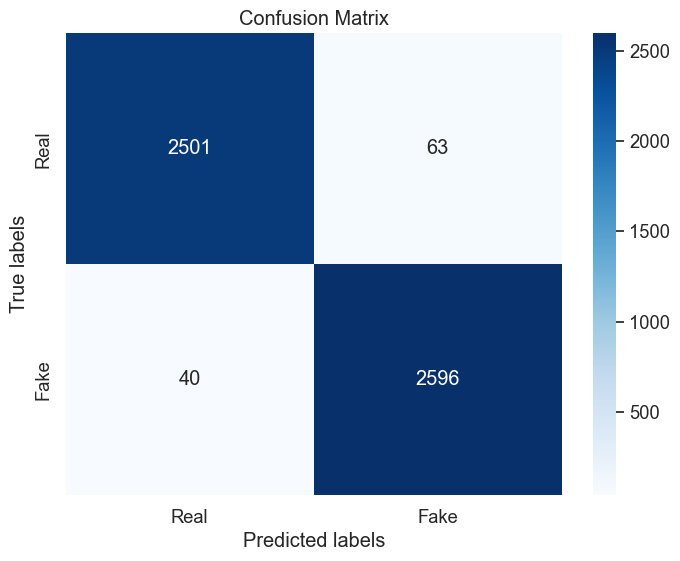

In [21]:
classes = ['Real', 'Fake']

plt.figure(figsize=(8, 6))
sns.set(font_scale=1.2)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [22]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2564
           1       0.98      0.98      0.98      2636

    accuracy                           0.98      5200
   macro avg       0.98      0.98      0.98      5200
weighted avg       0.98      0.98      0.98      5200



#MultinomialNB

In [23]:
from sklearn.naive_bayes import MultinomialNB

NB = MultinomialNB()
NB.fit(X_train, y_train)
pred1 = NB.predict(X_test)
print('Accuracy of NB  classifier on training set: {:.2f}'
     .format(NB.score(X_train, y_train)))
print('Accuracy of NB classifier on test set: {:.2f}'
     .format(NB.score(X_test, y_test)))

cm1 = confusion_matrix(y_test, pred1)
cm1

Accuracy of NB  classifier on training set: 0.89
Accuracy of NB classifier on test set: 0.84


array([[2557,    7],
       [ 803, 1833]], dtype=int64)

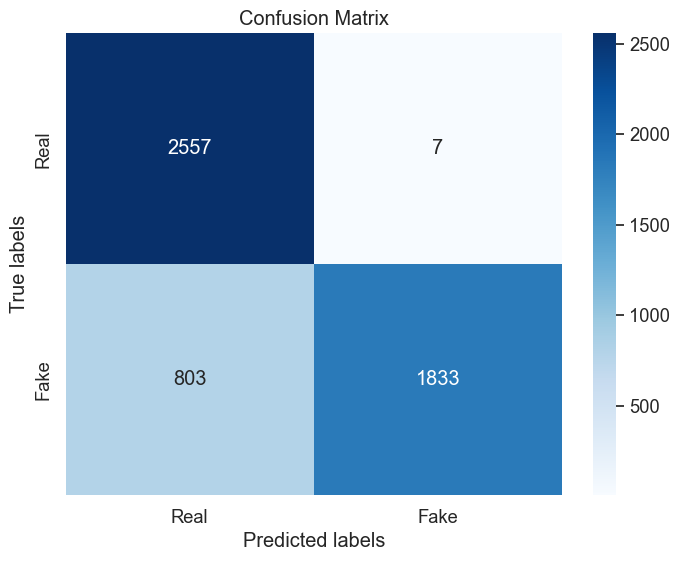

In [24]:
classes = ['Real', 'Fake']

plt.figure(figsize=(8, 6))
sns.set(font_scale=1.2)
sns.heatmap(cm1, annot=True, fmt="d", cmap="Blues",
            xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [25]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
print(classification_report(y_test,pred1))

              precision    recall  f1-score   support

           0       0.76      1.00      0.86      2564
           1       1.00      0.70      0.82      2636

    accuracy                           0.84      5200
   macro avg       0.88      0.85      0.84      5200
weighted avg       0.88      0.84      0.84      5200



#Random Forest

In [31]:
from sklearn.ensemble import RandomForestClassifier

RF = RandomForestClassifier(random_state=0)
RF.fit(X_train, y_train)
pred2 = RF.predict(X_test)
print('Accuracy of RF  classifier on training set: {:.2f}'
     .format(RF.score(X_train, y_train)))
print('Accuracy of RF classifier on test set: {:.2f}'
     .format(RF.score(X_test, y_test)))

cm2 = confusion_matrix(y_test, pred2)
cm2

Accuracy of RF  classifier on training set: 1.00
Accuracy of RF classifier on test set: 0.94


array([[2479,   85],
       [ 223, 2413]], dtype=int64)

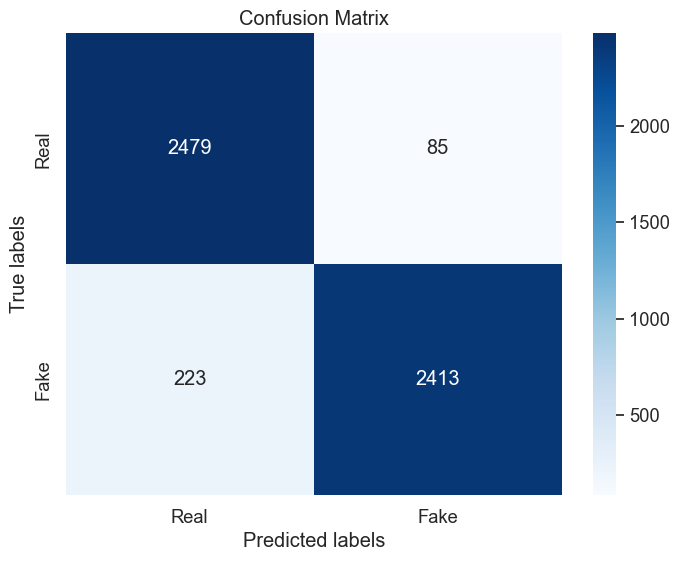

In [32]:
classes = ['Real', 'Fake']

plt.figure(figsize=(8, 6))
sns.set(font_scale=1.2)
sns.heatmap(cm2, annot=True, fmt="d", cmap="Blues",
            xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [33]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
print(classification_report(y_test,pred2))

              precision    recall  f1-score   support

           0       0.92      0.97      0.94      2564
           1       0.97      0.92      0.94      2636

    accuracy                           0.94      5200
   macro avg       0.94      0.94      0.94      5200
weighted avg       0.94      0.94      0.94      5200



#XGBoost

In [40]:
from xgboost import XGBClassifier

xgb = XGBClassifier()
xgb.fit(X_train, y_train)
pred3 = xgb.predict(X_test)
print('Accuracy of Lasso classifier on training set: {:.2f}'
     .format(xgb.score(X_train, y_train)))
print('Accuracy of Lasso classifier on test set: {:.2f}'
     .format(xgb.score(X_test, y_test)))

cm3 = confusion_matrix(y_test, pred3)
cm3

Accuracy of Lasso classifier on training set: 1.00
Accuracy of Lasso classifier on test set: 0.98


array([[2510,   54],
       [  29, 2607]], dtype=int64)

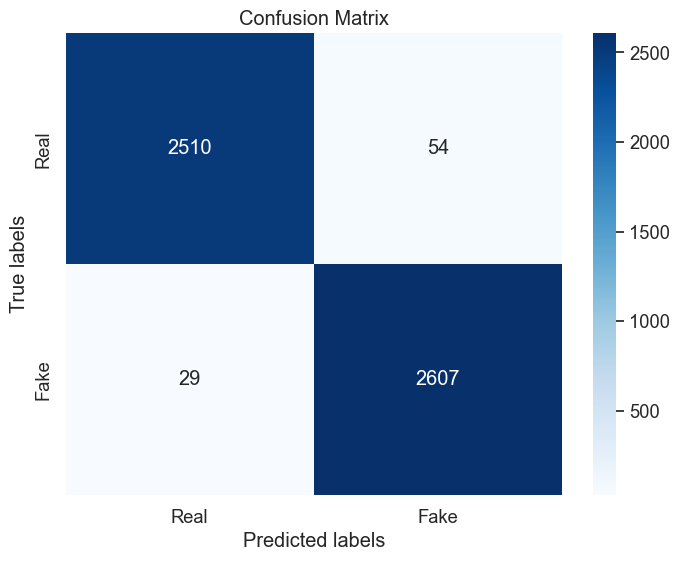

In [41]:
classes = ['Real', 'Fake']

plt.figure(figsize=(8, 6))
sns.set(font_scale=1.2)
sns.heatmap(cm3, annot=True, fmt="d", cmap="Blues",
            xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [42]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
print(classification_report(y_test,pred3))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98      2564
           1       0.98      0.99      0.98      2636

    accuracy                           0.98      5200
   macro avg       0.98      0.98      0.98      5200
weighted avg       0.98      0.98      0.98      5200



# Pipeline

In [25]:
X_train = train['total']
Y_train = train['label']

In [26]:
from sklearn.pipeline import Pipeline
import joblib
from sklearn import linear_model
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [27]:
pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', LogisticRegression(C=1e5, max_iter=1000)),
])

In [28]:
pipeline.fit(X_train, Y_train)

Pipeline(steps=[('vect', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(C=100000.0, max_iter=1000))])

In [29]:
pipeline.predict(["flynn hillary clinton big woman campus breitbart daniel j flynnever get feeling life circle roundabout rather head straight line toward intended destination hillary clinton remains big woman campus leafy liberal wellesley massachusetts everywhere else vote likely inauguration dress remainder day way miss havisham forever wore wedding dress speaking great expectations hillary rodham overflowed 48 year ago first addressed wellesley graduating class the president college informed gathered 1969 student needed debate far i could ascertain spokesman kind like democratic primary 2016 minus term unknown even seven sisters school i glad miss adams made clear i speaking today u 400 u miss rodham told classmate after appointing edger bergen charlie mccarthys mortimer snerds attendance bespectacled granny glass awarding matronly wisdom least john lennon wisdom took issue previous speaker despite becoming first win election seat u s senate since reconstruction edward brooke came criticism calling empathy goal protestors criticized tactic though clinton senior thesis saul alinsky lamented black power demagogue elitist arrogance repressive intolerance within new left similar word coming republican necessitated brief rebuttal trust rodham ironically observed 1969 one word i asked class rehearsal wanted say everyone came said talk trust talk lack trust u way feel others talk trust bust what say what say feeling permeates generation perhaps even understood distrusted the trust bust certainly busted clintons 2016 plan she certainly even understand people distrusted after whitewater travelgate vast conspiracy benghazi missing email clinton found distrusted voice friday there load compromising road broadening political horizon and distrust american people trump edged 48 percent 38 percent question immediately prior novembers election stood major reason closing horizon clinton described vanquisher supporter embracing lie con alternative fact assault truth reason she failed explain american people chose lie truth as history major among today know well people power invent fact attack question mark beginning end free society offered that hyperbole like many people emerge 1960s hillary clinton embarked upon long strange trip from high school goldwater girl wellesley college republican president democratic politician clinton drank time place gave degree more significantly went idealist cynic comparison two wellesley commencement address show way back lamented long leader viewed politics art possible challenge practice politics art making appears impossible possible now big woman campus odd woman white house wonder current station even possible why arent i 50 point ahead asked september in may asks isnt president the woman famously dubbed congenital liar bill safire concludes lie mind getting stood election day like finding jilted bride wedding day inspires dangerous delusion"])

array([0], dtype=int64)

In [30]:
#Saving the pipeline
filename = 'pipeline2.sav'
joblib.dump(pipeline, filename)

['pipeline2.sav']

In [31]:
filename = './pipeline2.sav'

# Prediction

In [32]:
# Loading the pipeline from the saved file
loaded_pipeline = joblib.load(filename)

# Defining the new text data
new_text_data = ["""
Trump warned his supporters that the US Postal Service is trying to steal the election for Hillary Clinton in Colorado. 
Video: 
At a rally in Golden, CO, Trump said: 
I have real problems with ballots being sent. Does that make sense? 
Like people saying, â€œOh, hereâ€™s a ballot. Hereâ€™s another ballot. Throw it away. Oh, hereâ€™s one I like. Weâ€™ll keep that one.â€ 
I have real problems, so get your ballots in. 
Trump also accused election officials of throwing away ballots, as his rally was a mixture of claims of voter fraud and baseless speculation about Hillary Clintonâ€™s emails. 
Donald Trump appears to be losing his mind. He also seems to think that accusing the US Postal Service and election officials of stealing the election for Hillary Clinton is going to motivate Republicans to vote. 
Consider the contradiction in Trumpâ€™s message. The Republican nominee tells his supporters that the US Postal Service is throwing away ballots, while at the same time he is urging them to mail in their ballots. 
If their ballots are going to be thrown away by USPS, why should Republicans bother mailing their ballots in? 
It is this sort of incoherent gibberish that makes no sense. Trumpâ€™s inability to stay disciplined and on message is also one of the biggest reasons why Republicans on pace to lose this election. 
Donald Trumpâ€™s descent into paranoid senior citizen continues to play out in front of the entire nation, as the Republican nominee for president believes that his letter carrier is out to get him,
"""]
# Making predictions using the loaded pipeline
result = loaded_pipeline.predict(new_text_data)

print(result)

[1]
